In [ ]:
!rm -rf results

# 1- Ablations Study on CIFAR-10

Starting Griffin Ablation Study...

Training with Griffin (Original)
----------------------------------------


100%|██████████| 170M/170M [00:11<00:00, 15.5MB/s] 


Griffin (Original) - Epoch 1/10, Loss: 1.9877, Accuracy: 42.59%
Griffin (Original) - Epoch 2/10, Loss: 1.6575, Accuracy: 48.76%
Griffin (Original) - Epoch 3/10, Loss: 1.5521, Accuracy: 51.95%
Griffin (Original) - Epoch 4/10, Loss: 1.4940, Accuracy: 54.47%
Griffin (Original) - Epoch 5/10, Loss: 1.4439, Accuracy: 55.99%
Griffin (Original) - Epoch 6/10, Loss: 1.4018, Accuracy: 58.18%
Griffin (Original) - Epoch 7/10, Loss: 1.3709, Accuracy: 58.78%
Griffin (Original) - Epoch 8/10, Loss: 1.3361, Accuracy: 59.87%
Griffin (Original) - Epoch 9/10, Loss: 1.3149, Accuracy: 61.36%
Griffin (Original) - Epoch 10/10, Loss: 1.2836, Accuracy: 62.38%

Training with Griffin (No Sigma Adapt)
----------------------------------------
Griffin (No Sigma Adapt) - Epoch 1/10, Loss: 2.0256, Accuracy: 40.73%
Griffin (No Sigma Adapt) - Epoch 2/10, Loss: 1.7027, Accuracy: 47.28%
Griffin (No Sigma Adapt) - Epoch 3/10, Loss: 1.5897, Accuracy: 50.77%
Griffin (No Sigma Adapt) - Epoch 4/10, Loss: 1.5316, Accuracy: 53.01

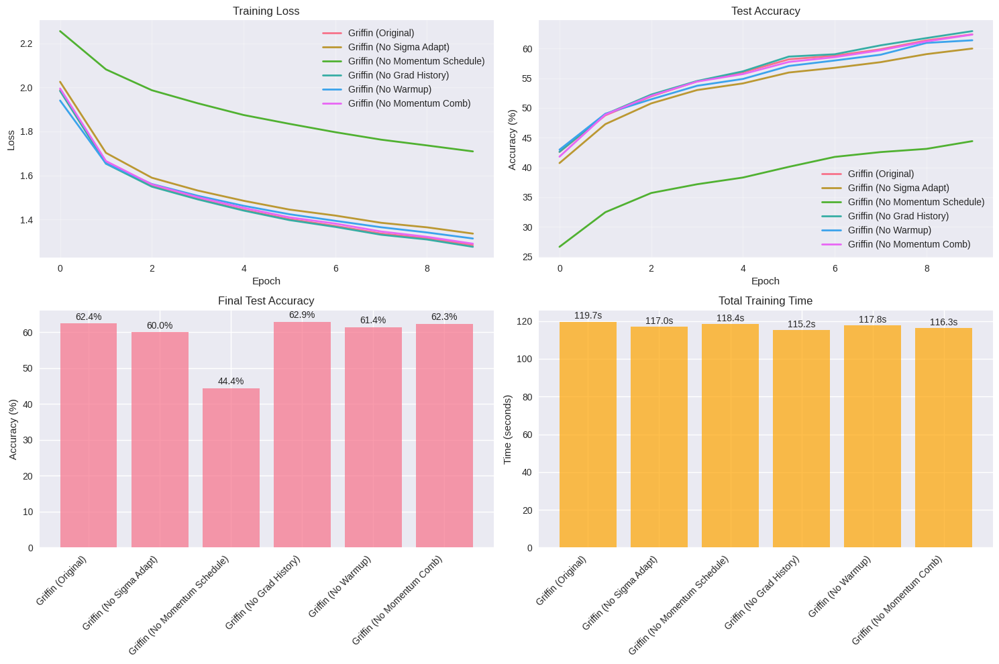


GRIFFIN ABLATION STUDY ANALYSIS

Ranking by Final Test Accuracy:
----------------------------------------
 1. Griffin (No Grad History)      | Accuracy:  62.92% | Time:  115.2s
 2. Griffin (Original)             | Accuracy:  62.38% | Time:  119.7s
 3. Griffin (No Momentum Comb)     | Accuracy:  62.34% | Time:  116.3s
 4. Griffin (No Warmup)            | Accuracy:  61.38% | Time:  117.8s
 5. Griffin (No Sigma Adapt)       | Accuracy:  59.99% | Time:  117.0s
 6. Griffin (No Momentum Schedule) | Accuracy:  44.42% | Time:  118.4s

Component Importance (vs Original 62.38%):
--------------------------------------------------
No Sigma Adaptation       | ✗ HURTS    | Δ: -2.39%
No Momentum Schedule      | ✗ HURTS    | Δ: -17.96%
No Gradient History       | ✓ HELPS    | Δ: +0.54%
No Warmup                 | ✗ HURTS    | Δ: -1.00%
No Momentum Combination   | ✗ HURTS    | Δ: -0.04%


In [4]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict
import time

# ---------------------------
# Griffin Optimizer (Original)
# ---------------------------
class Griffin(optim.Optimizer):
    def __init__(self, params, lr=5e-4, betas=(0.95, 0.99), weight_decay=1e-4,
                 eps=1e-8, beta_sigma=0.9, schedule_decay=5e-3, warmup_steps=100):
        defaults = dict(lr=lr, betas=betas, weight_decay=weight_decay,
                        eps=eps, beta_sigma=beta_sigma,
                        schedule_decay=schedule_decay, warmup_steps=warmup_steps)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure else None
        for group in self.param_groups:
            lr = group['lr']
            wd = group['weight_decay']
            eps = group['eps']
            beta_sigma = group['beta_sigma']
            schedule_decay = group['schedule_decay']
            warmup_steps = group['warmup_steps']
            beta1, beta2 = group['betas']

            for p in group['params']:
                if p.grad is None:
                    continue

                g = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m_schedule'] = 1.0
                    state['m'] = torch.zeros_like(p)  # 1st moment
                    state['v'] = torch.zeros_like(p)  # 2nd moment
                    state['sigma'] = 0.6  # Scalar sigma per parameter
                    state['g_prev'] = torch.zeros_like(p)  # Previous gradient

                state['step'] += 1
                step = state['step']
                m, v, g_prev = state['m'], state['v'], state['g_prev']
                m_schedule = state['m_schedule']
                sigma = state['sigma']

                # ===== Nadam Momentum Schedule (Optimized) =====
                momentum_t = beta1 * (1. - 0.5 * (0.98 ** (step * schedule_decay)))
                momentum_t1 = beta1 * (1. - 0.5 * (0.98 ** ((step + 1) * schedule_decay)))
                m_schedule = m_schedule * momentum_t
                schedule_next = m_schedule * momentum_t1

                # ===== Efficient Weight Decay =====
                if wd != 0:
                    p.mul_(1 - lr * wd)

                # ===== Low-Cost Moment Updates =====
                # Update momentum (m)
                m.mul_(beta1).add_(g, alpha=1 - beta1)

                # Update adaptive term (v)
                v.mul_(beta2).addcmul_(g, g, value=1 - beta2)

                # ===== Ultra-Efficient Sigma Update =====
                grad_change = (g - g_prev).abs().mean().item()
                stability = 1.0 / (1.0 + 10 * grad_change)
                new_sigma = 0.4 + 0.4 * stability

                # Warmup-controlled sigma update
                warmup_factor = min(1.0, step / warmup_steps)
                sigma = sigma * (beta_sigma * warmup_factor) + new_sigma * (1 - beta_sigma * warmup_factor)
                sigma = max(0.4, min(0.8, sigma))
                state['sigma'] = sigma

                # Store current gradient for next step
                g_prev.copy_(g)

                # ===== Fast Parameter Update =====
                # Bias correction with momentum combination
                bias_corr1 = 1 - beta1 ** step
                bias_corr2 = 1 - beta2 ** step

                m_hat = (beta1 * m) / (1 - beta1**(step+1)) + ((1 - beta1) * g) / (1 - beta1**step)
                v_hat = v / bias_corr2
                denom = v_hat.sqrt().add_(eps)

                # Learning rate with warmup and sigma scaling
                lr_scale = min(1.0, step / warmup_steps)
                step_size = lr * lr_scale * (1. - momentum_t) / (1. - m_schedule) * sigma

                p.addcdiv_(m_hat, denom, value=-step_size)

                # Update momentum schedule
                state['m_schedule'] = schedule_next

        return loss

# ---------------------------
# Ablation Variants
# ---------------------------

class Griffin_NoSigmaAdaptation(Griffin):
    """Griffin without adaptive sigma (fixed sigma)"""
    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure else None
        for group in self.param_groups:
            lr = group['lr']
            wd = group['weight_decay']
            eps = group['eps']
            schedule_decay = group['schedule_decay']
            warmup_steps = group['warmup_steps']
            beta1, beta2 = group['betas']

            for p in group['params']:
                if p.grad is None:
                    continue

                g = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m_schedule'] = 1.0
                    state['m'] = torch.zeros_like(p)
                    state['v'] = torch.zeros_like(p)
                    state['sigma'] = 0.6
                    state['g_prev'] = torch.zeros_like(p)

                state['step'] += 1
                step = state['step']
                m, v, g_prev = state['m'], state['v'], state['g_prev']
                m_schedule = state['m_schedule']
                sigma = state['sigma']  # Fixed sigma, no adaptation

                # Nadam Momentum Schedule
                momentum_t = beta1 * (1. - 0.5 * (0.98 ** (step * schedule_decay)))
                momentum_t1 = beta1 * (1. - 0.5 * (0.98 ** ((step + 1) * schedule_decay)))
                m_schedule = m_schedule * momentum_t
                schedule_next = m_schedule * momentum_t1

                # Efficient Weight Decay
                if wd != 0:
                    p.mul_(1 - lr * wd)

                # Moment Updates
                m.mul_(beta1).add_(g, alpha=1 - beta1)
                v.mul_(beta2).addcmul_(g, g, value=1 - beta2)

                # REMOVED: Sigma adaptation logic
                # Keep fixed sigma (0.6)

                # Store gradient (kept for interface but not used)
                g_prev.copy_(g)

                # Parameter Update
                bias_corr1 = 1 - beta1 ** step
                bias_corr2 = 1 - beta2 ** step

                m_hat = (beta1 * m) / (1 - beta1**(step+1)) + ((1 - beta1) * g) / (1 - beta1**step)
                v_hat = v / bias_corr2
                denom = v_hat.sqrt().add_(eps)

                lr_scale = min(1.0, step / warmup_steps)
                step_size = lr * lr_scale * (1. - momentum_t) / (1. - m_schedule) * sigma

                p.addcdiv_(m_hat, denom, value=-step_size)

                state['m_schedule'] = schedule_next

        return loss

class Griffin_NoMomentumSchedule(Griffin):
    """Griffin without momentum decay schedule (fixed betas)"""
    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure else None
        for group in self.param_groups:
            lr = group['lr']
            wd = group['weight_decay']
            eps = group['eps']
            beta_sigma = group['beta_sigma']
            warmup_steps = group['warmup_steps']
            beta1, beta2 = group['betas']

            for p in group['params']:
                if p.grad is None:
                    continue

                g = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m_schedule'] = 1.0
                    state['m'] = torch.zeros_like(p)
                    state['v'] = torch.zeros_like(p)
                    state['sigma'] = 0.6
                    state['g_prev'] = torch.zeros_like(p)

                state['step'] += 1
                step = state['step']
                m, v, g_prev = state['m'], state['v'], state['g_prev']
                m_schedule = state['m_schedule']
                sigma = state['sigma']

                # REMOVED: Momentum schedule decay
                # Use fixed momentum
                momentum_t = beta1
                momentum_t1 = beta1
                m_schedule = m_schedule * momentum_t
                schedule_next = m_schedule * momentum_t1

                # Efficient Weight Decay
                if wd != 0:
                    p.mul_(1 - lr * wd)

                # Moment Updates
                m.mul_(beta1).add_(g, alpha=1 - beta1)
                v.mul_(beta2).addcmul_(g, g, value=1 - beta2)

                # Sigma Update
                grad_change = (g - g_prev).abs().mean().item()
                stability = 1.0 / (1.0 + 10 * grad_change)
                new_sigma = 0.4 + 0.4 * stability

                warmup_factor = min(1.0, step / warmup_steps)
                sigma = sigma * (beta_sigma * warmup_factor) + new_sigma * (1 - beta_sigma * warmup_factor)
                sigma = max(0.4, min(0.8, sigma))
                state['sigma'] = sigma

                g_prev.copy_(g)

                # Parameter Update
                bias_corr1 = 1 - beta1 ** step
                bias_corr2 = 1 - beta2 ** step

                m_hat = (beta1 * m) / (1 - beta1**(step+1)) + ((1 - beta1) * g) / (1 - beta1**step)
                v_hat = v / bias_corr2
                denom = v_hat.sqrt().add_(eps)

                lr_scale = min(1.0, step / warmup_steps)
                step_size = lr * lr_scale * (1. - momentum_t) / (1. - m_schedule) * sigma

                p.addcdiv_(m_hat, denom, value=-step_size)

                state['m_schedule'] = schedule_next

        return loss

class Griffin_NoGradientHistory(Griffin):
    """Griffin without gradient history for sigma adaptation"""
    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure else None
        for group in self.param_groups:
            lr = group['lr']
            wd = group['weight_decay']
            eps = group['eps']
            beta_sigma = group['beta_sigma']
            schedule_decay = group['schedule_decay']
            warmup_steps = group['warmup_steps']
            beta1, beta2 = group['betas']

            for p in group['params']:
                if p.grad is None:
                    continue

                g = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m_schedule'] = 1.0
                    state['m'] = torch.zeros_like(p)
                    state['v'] = torch.zeros_like(p)
                    state['sigma'] = 0.6
                    # REMOVED: g_prev storage

                state['step'] += 1
                step = state['step']
                m, v = state['m'], state['v']
                m_schedule = state['m_schedule']
                sigma = state['sigma']

                # Nadam Momentum Schedule
                momentum_t = beta1 * (1. - 0.5 * (0.98 ** (step * schedule_decay)))
                momentum_t1 = beta1 * (1. - 0.5 * (0.98 ** ((step + 1) * schedule_decay)))
                m_schedule = m_schedule * momentum_t
                schedule_next = m_schedule * momentum_t1

                # Efficient Weight Decay
                if wd != 0:
                    p.mul_(1 - lr * wd)

                # Moment Updates
                m.mul_(beta1).add_(g, alpha=1 - beta1)
                v.mul_(beta2).addcmul_(g, g, value=1 - beta2)

                # REMOVED: Sigma adaptation based on gradient history
                # Use constant stability (no gradient change calculation)
                stability = 1.0  # Constant stability
                new_sigma = 0.4 + 0.4 * stability

                warmup_factor = min(1.0, step / warmup_steps)
                sigma = sigma * (beta_sigma * warmup_factor) + new_sigma * (1 - beta_sigma * warmup_factor)
                sigma = max(0.4, min(0.8, sigma))
                state['sigma'] = sigma

                # Parameter Update
                bias_corr1 = 1 - beta1 ** step
                bias_corr2 = 1 - beta2 ** step

                m_hat = (beta1 * m) / (1 - beta1**(step+1)) + ((1 - beta1) * g) / (1 - beta1**step)
                v_hat = v / bias_corr2
                denom = v_hat.sqrt().add_(eps)

                lr_scale = min(1.0, step / warmup_steps)
                step_size = lr * lr_scale * (1. - momentum_t) / (1. - m_schedule) * sigma

                p.addcdiv_(m_hat, denom, value=-step_size)

                state['m_schedule'] = schedule_next

        return loss

class Griffin_NoWarmup(Griffin):
    """Griffin without warmup for sigma adaptation"""
    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure else None
        for group in self.param_groups:
            lr = group['lr']
            wd = group['weight_decay']
            eps = group['eps']
            beta_sigma = group['beta_sigma']
            schedule_decay = group['schedule_decay']
            beta1, beta2 = group['betas']

            for p in group['params']:
                if p.grad is None:
                    continue

                g = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m_schedule'] = 1.0
                    state['m'] = torch.zeros_like(p)
                    state['v'] = torch.zeros_like(p)
                    state['sigma'] = 0.6
                    state['g_prev'] = torch.zeros_like(p)

                state['step'] += 1
                step = state['step']
                m, v, g_prev = state['m'], state['v'], state['g_prev']
                m_schedule = state['m_schedule']
                sigma = state['sigma']

                # Nadam Momentum Schedule
                momentum_t = beta1 * (1. - 0.5 * (0.98 ** (step * schedule_decay)))
                momentum_t1 = beta1 * (1. - 0.5 * (0.98 ** ((step + 1) * schedule_decay)))
                m_schedule = m_schedule * momentum_t
                schedule_next = m_schedule * momentum_t1

                # Efficient Weight Decay
                if wd != 0:
                    p.mul_(1 - lr * wd)

                # Moment Updates
                m.mul_(beta1).add_(g, alpha=1 - beta1)
                v.mul_(beta2).addcmul_(g, g, value=1 - beta2)

                # Sigma Update
                grad_change = (g - g_prev).abs().mean().item()
                stability = 1.0 / (1.0 + 10 * grad_change)
                new_sigma = 0.4 + 0.4 * stability

                # REMOVED: Warmup control
                warmup_factor = 1.0  # No warmup
                sigma = sigma * (beta_sigma * warmup_factor) + new_sigma * (1 - beta_sigma * warmup_factor)
                sigma = max(0.4, min(0.8, sigma))
                state['sigma'] = sigma

                g_prev.copy_(g)

                # Parameter Update
                bias_corr1 = 1 - beta1 ** step
                bias_corr2 = 1 - beta2 ** step

                m_hat = (beta1 * m) / (1 - beta1**(step+1)) + ((1 - beta1) * g) / (1 - beta1**step)
                v_hat = v / bias_corr2
                denom = v_hat.sqrt().add_(eps)

                # REMOVED: Learning rate warmup
                lr_scale = 1.0  # No warmup
                step_size = lr * lr_scale * (1. - momentum_t) / (1. - m_schedule) * sigma

                p.addcdiv_(m_hat, denom, value=-step_size)

                state['m_schedule'] = schedule_next

        return loss

class Griffin_NoMomentumCombination(Griffin):
    """Griffin without momentum combination (use standard momentum)"""
    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure else None
        for group in self.param_groups:
            lr = group['lr']
            wd = group['weight_decay']
            eps = group['eps']
            beta_sigma = group['beta_sigma']
            schedule_decay = group['schedule_decay']
            warmup_steps = group['warmup_steps']
            beta1, beta2 = group['betas']

            for p in group['params']:
                if p.grad is None:
                    continue

                g = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m_schedule'] = 1.0
                    state['m'] = torch.zeros_like(p)
                    state['v'] = torch.zeros_like(p)
                    state['sigma'] = 0.6
                    state['g_prev'] = torch.zeros_like(p)

                state['step'] += 1
                step = state['step']
                m, v, g_prev = state['m'], state['v'], state['g_prev']
                m_schedule = state['m_schedule']
                sigma = state['sigma']

                # Nadam Momentum Schedule
                momentum_t = beta1 * (1. - 0.5 * (0.98 ** (step * schedule_decay)))
                momentum_t1 = beta1 * (1. - 0.5 * (0.98 ** ((step + 1) * schedule_decay)))
                m_schedule = m_schedule * momentum_t
                schedule_next = m_schedule * momentum_t1

                # Efficient Weight Decay
                if wd != 0:
                    p.mul_(1 - lr * wd)

                # Moment Updates
                m.mul_(beta1).add_(g, alpha=1 - beta1)
                v.mul_(beta2).addcmul_(g, g, value=1 - beta2)

                # Sigma Update
                grad_change = (g - g_prev).abs().mean().item()
                stability = 1.0 / (1.0 + 10 * grad_change)
                new_sigma = 0.4 + 0.4 * stability

                warmup_factor = min(1.0, step / warmup_steps)
                sigma = sigma * (beta_sigma * warmup_factor) + new_sigma * (1 - beta_sigma * warmup_factor)
                sigma = max(0.4, min(0.8, sigma))
                state['sigma'] = sigma

                g_prev.copy_(g)

                # Parameter Update
                bias_corr1 = 1 - beta1 ** step
                bias_corr2 = 1 - beta2 ** step

                # REMOVED: Complex momentum combination
                # Use standard momentum
                m_hat = m / bias_corr1  # Simple momentum
                v_hat = v / bias_corr2
                denom = v_hat.sqrt().add_(eps)

                lr_scale = min(1.0, step / warmup_steps)
                step_size = lr * lr_scale * (1. - momentum_t) / (1. - m_schedule) * sigma

                p.addcdiv_(m_hat, denom, value=-step_size)

                state['m_schedule'] = schedule_next

        return loss

# ---------------------------
# Test Model and Training Setup
# ---------------------------

class SimpleCNN(nn.Module):
    def __init__(self, num_classes=10):
        super(SimpleCNN, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
        )
        self.classifier = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(64 * 8 * 8, 128),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

def get_cifar10_dataloaders(batch_size=128):
    transform_train = transforms.Compose([
        transforms.RandomCrop(32, padding=4),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
    ])

    transform_test = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
    ])

    trainset = torchvision.datasets.CIFAR10(
        root='./data', train=True, download=True, transform=transform_train)
    trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=2)

    testset = torchvision.datasets.CIFAR10(
        root='./data', train=False, download=True, transform=transform_test)
    testloader = DataLoader(testset, batch_size=batch_size, shuffle=False, num_workers=2)

    return trainloader, testloader

def train_and_evaluate(optimizer_class, optimizer_name, num_epochs=10):
    """Train and evaluate a single optimizer variant"""
    torch.manual_seed(42)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    model = SimpleCNN().to(device)
    criterion = nn.CrossEntropyLoss()
    
    # Create optimizer with standard parameters
    optimizer = optimizer_class(model.parameters(), lr=5e-4)
    
    trainloader, testloader = get_cifar10_dataloaders()
    
    history = {
        'train_loss': [],
        'test_accuracy': [],
        'training_time': 0
    }
    
    start_time = time.time()
    
    for epoch in range(num_epochs):
        # Training
        model.train()
        running_loss = 0.0
        for batch_idx, (inputs, targets) in enumerate(trainloader):
            inputs, targets = inputs.to(device), targets.to(device)
            
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
        
        avg_train_loss = running_loss / len(trainloader)
        history['train_loss'].append(avg_train_loss)
        
        # Testing
        model.eval()
        correct = 0
        total = 0
        with torch.no_grad():
            for inputs, targets in testloader:
                inputs, targets = inputs.to(device), targets.to(device)
                outputs = model(inputs)
                _, predicted = outputs.max(1)
                total += targets.size(0)
                correct += predicted.eq(targets).sum().item()
        
        test_accuracy = 100. * correct / total
        history['test_accuracy'].append(test_accuracy)
        
        print(f'{optimizer_name} - Epoch {epoch+1}/{num_epochs}, '
              f'Loss: {avg_train_loss:.4f}, Accuracy: {test_accuracy:.2f}%')
    
    history['training_time'] = time.time() - start_time
    return history

# ---------------------------
# Ablation Study Execution
# ---------------------------

def run_ablation_study():
    """Run complete ablation study comparing all variants"""
    optimizers = {
        'Griffin (Original)': Griffin,
        'Griffin (No Sigma Adapt)': Griffin_NoSigmaAdaptation,
        'Griffin (No Momentum Schedule)': Griffin_NoMomentumSchedule,
        'Griffin (No Grad History)': Griffin_NoGradientHistory,
        'Griffin (No Warmup)': Griffin_NoWarmup,
        'Griffin (No Momentum Comb)': Griffin_NoMomentumCombination,
    }
    
    results = {}
    num_epochs = 10
    
    print("Starting Griffin Ablation Study...")
    print("=" * 60)
    
    for name, optimizer_class in optimizers.items():
        print(f"\nTraining with {name}")
        print("-" * 40)
        results[name] = train_and_evaluate(optimizer_class, name, num_epochs)
    
    return results

def plot_results(results):
    """Plot comparison results from ablation study"""
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 10))
    
    # Training Loss
    for name, history in results.items():
        ax1.plot(history['train_loss'], label=name, linewidth=2)
    ax1.set_title('Training Loss')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # Test Accuracy
    for name, history in results.items():
        ax2.plot(history['test_accuracy'], label=name, linewidth=2)
    ax2.set_title('Test Accuracy')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy (%)')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    # Final Performance Comparison
    names = list(results.keys())
    final_accuracies = [history['test_accuracy'][-1] for history in results.values()]
    training_times = [history['training_time'] for history in results.values()]
    
    bars = ax3.bar(names, final_accuracies, alpha=0.7)
    ax3.set_title('Final Test Accuracy')
    ax3.set_ylabel('Accuracy (%)')
    plt.setp(ax3.xaxis.get_majorticklabels(), rotation=45, ha='right')
    
    # Add value labels on bars
    for bar, acc in zip(bars, final_accuracies):
        ax3.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
                f'{acc:.1f}%', ha='center', va='bottom')
    
    # Training Time Comparison
    bars = ax4.bar(names, training_times, alpha=0.7, color='orange')
    ax4.set_title('Total Training Time')
    ax4.set_ylabel('Time (seconds)')
    plt.setp(ax4.xaxis.get_majorticklabels(), rotation=45, ha='right')
    
    # Add value labels on bars
    for bar, time_val in zip(bars, training_times):
        ax4.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
                f'{time_val:.1f}s', ha='center', va='bottom')
    
    plt.tight_layout()
    plt.savefig('griffin_ablation_study.png', dpi=300, bbox_inches='tight')
    plt.show()

def print_ablation_analysis(results):
    """Print detailed analysis of ablation study results"""
    print("\n" + "=" * 60)
    print("GRIFFIN ABLATION STUDY ANALYSIS")
    print("=" * 60)
    
    # Sort by final accuracy
    sorted_results = sorted(results.items(), 
                          key=lambda x: x[1]['test_accuracy'][-1], 
                          reverse=True)
    
    print("\nRanking by Final Test Accuracy:")
    print("-" * 40)
    for i, (name, history) in enumerate(sorted_results, 1):
        final_acc = history['test_accuracy'][-1]
        training_time = history['training_time']
        print(f"{i:2d}. {name:30} | Accuracy: {final_acc:6.2f}% | Time: {training_time:6.1f}s")
    
    # Component importance analysis
    original_acc = results['Griffin (Original)']['test_accuracy'][-1]
    print(f"\nComponent Importance (vs Original {original_acc:.2f}%):")
    print("-" * 50)
    
    variants = {
        'No Sigma Adaptation': 'Griffin (No Sigma Adapt)',
        'No Momentum Schedule': 'Griffin (No Momentum Schedule)',
        'No Gradient History': 'Griffin (No Grad History)',
        'No Warmup': 'Griffin (No Warmup)',
        'No Momentum Combination': 'Griffin (No Momentum Comb)'
    }
    
    for component, variant_name in variants.items():
        variant_acc = results[variant_name]['test_accuracy'][-1]
        difference = variant_acc - original_acc
        impact = "✓ HELPS" if difference > 0 else "✗ HURTS" if difference < 0 else "○ NEUTRAL"
        print(f"{component:25} | {impact:10} | Δ: {difference:+.2f}%")

# ---------------------------
# Main Execution
# ---------------------------

if __name__ == "__main__":
    # Run the ablation study
    results = run_ablation_study()
    
    # Plot and analyze results
    plot_results(results)
    print_ablation_analysis(results)

# 2-CIFAR-10

Setting random seed for reproducibility...


100%|██████████| 9.91M/9.91M [00:00<00:00, 19.6MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 483kB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 4.43MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 14.5MB/s]


Training Griffin on MNIST for 10 epochs on cuda...
Epoch 1/10 | Train Loss: 0.3234, Acc: 0.8967 | Val Loss: 0.0702, Acc: 0.9785 | Time: 13.92s
Epoch 2/10 | Train Loss: 0.0607, Acc: 0.9816 | Val Loss: 0.0552, Acc: 0.9833 | Time: 13.02s
Epoch 3/10 | Train Loss: 0.0457, Acc: 0.9858 | Val Loss: 0.0607, Acc: 0.9823 | Time: 12.97s
Epoch 4/10 | Train Loss: 0.0347, Acc: 0.9893 | Val Loss: 0.0523, Acc: 0.9835 | Time: 12.94s
Epoch 5/10 | Train Loss: 0.0250, Acc: 0.9920 | Val Loss: 0.0413, Acc: 0.9900 | Time: 13.01s
Epoch 6/10 | Train Loss: 0.0182, Acc: 0.9944 | Val Loss: 0.0329, Acc: 0.9910 | Time: 13.36s
Epoch 7/10 | Train Loss: 0.0117, Acc: 0.9961 | Val Loss: 0.0403, Acc: 0.9902 | Time: 13.15s
Epoch 8/10 | Train Loss: 0.0071, Acc: 0.9977 | Val Loss: 0.0332, Acc: 0.9902 | Time: 13.00s
Epoch 9/10 | Train Loss: 0.0042, Acc: 0.9990 | Val Loss: 0.0334, Acc: 0.9913 | Time: 12.89s
Epoch 10/10 | Train Loss: 0.0029, Acc: 0.9993 | Val Loss: 0.0344, Acc: 0.9908 | Time: 12.81s

Final Test Results for Grif

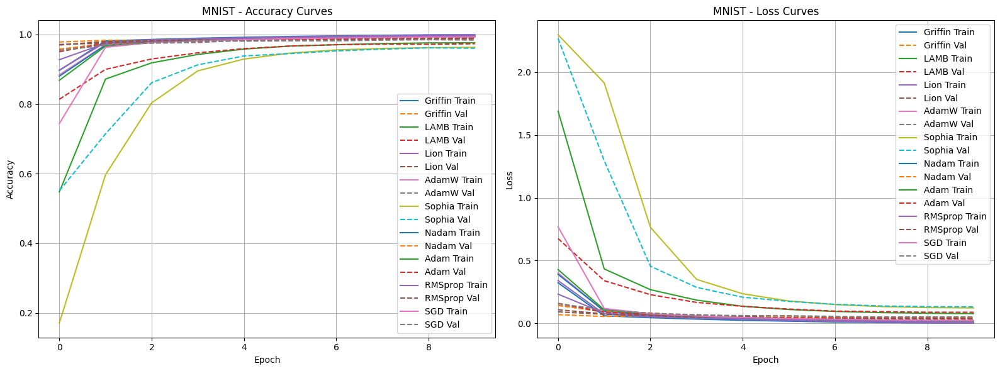

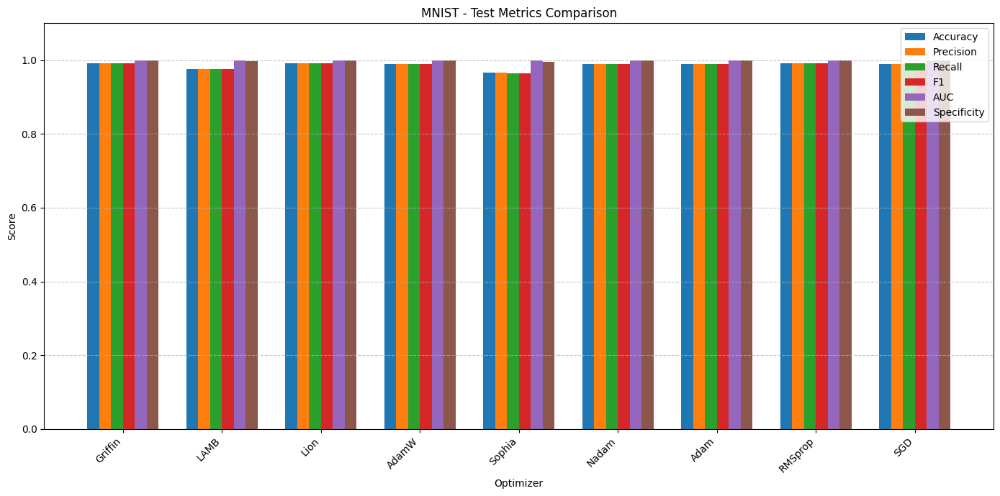

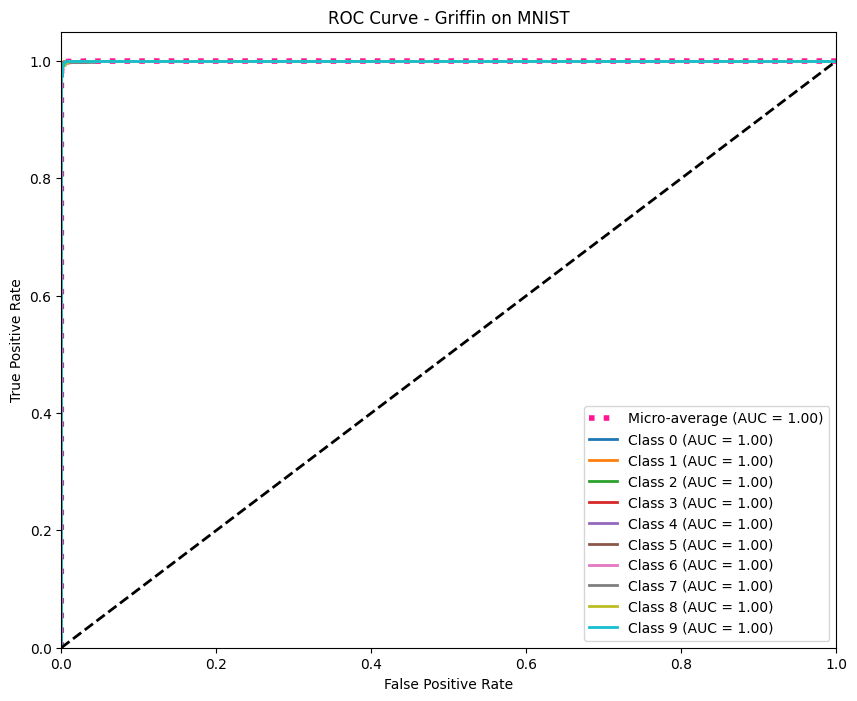

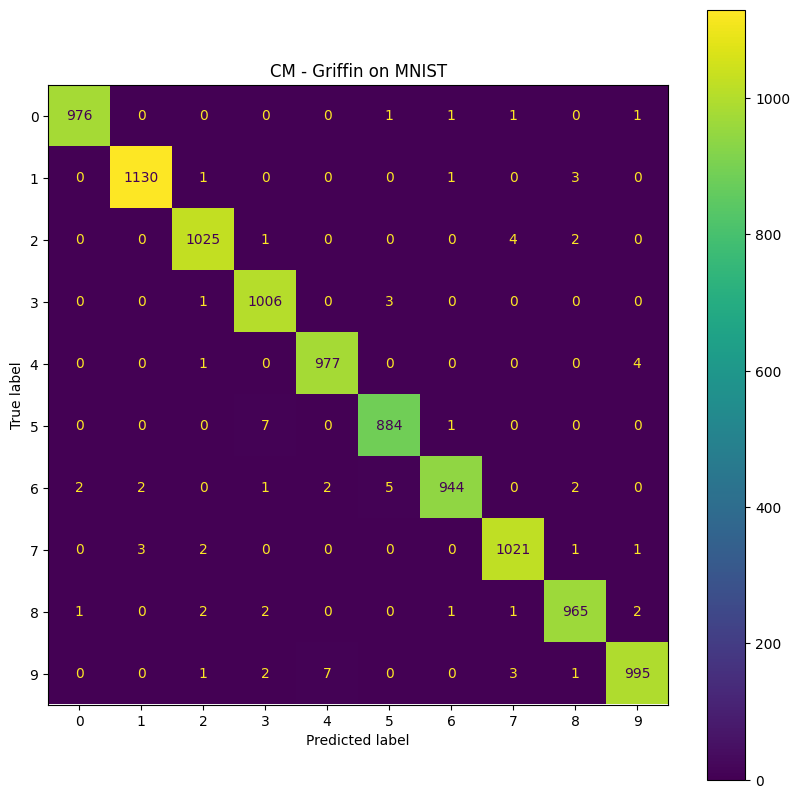

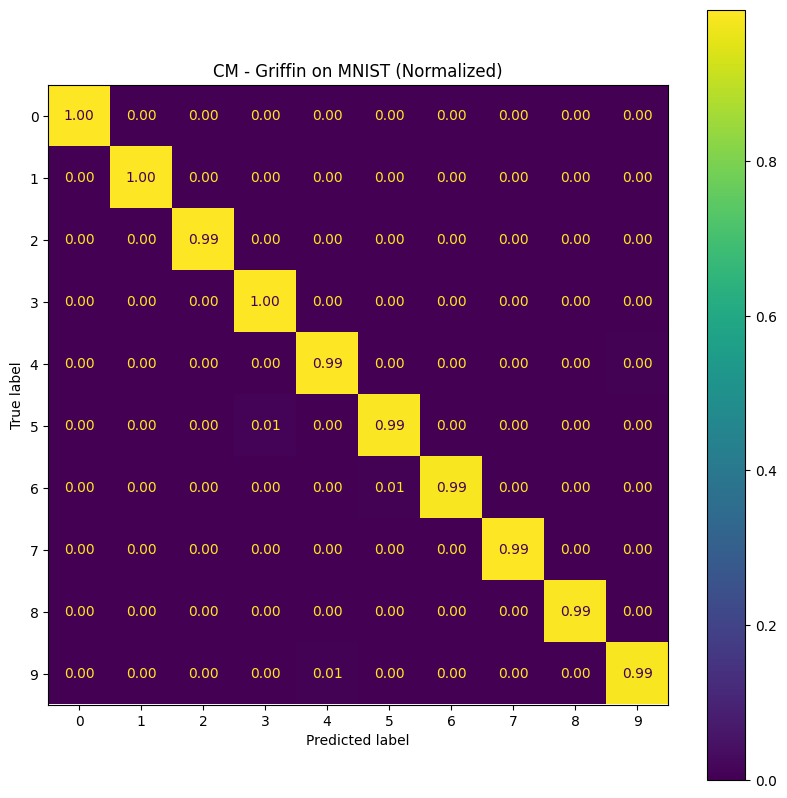

...

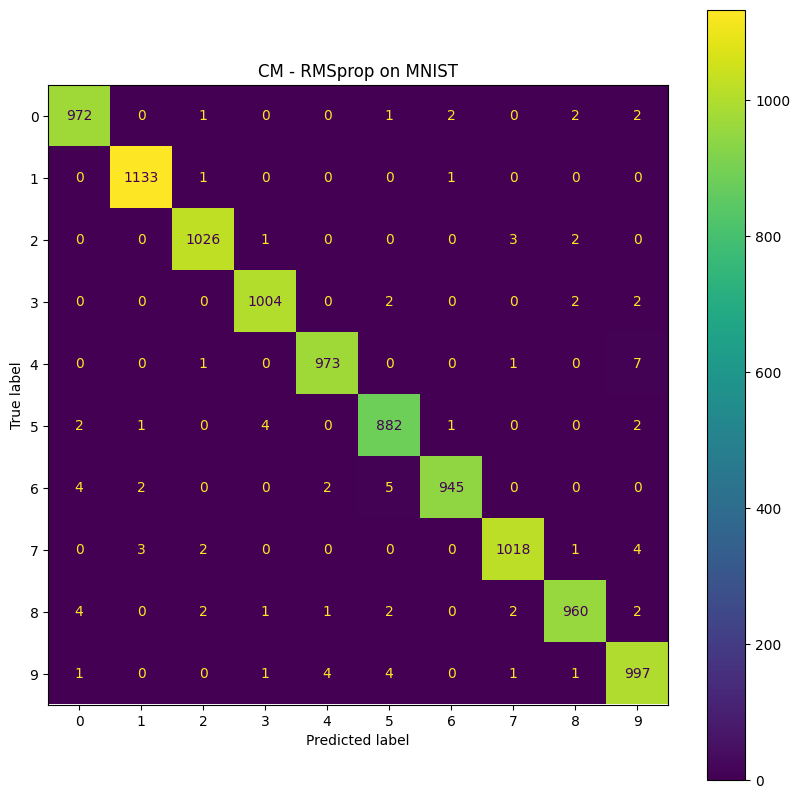

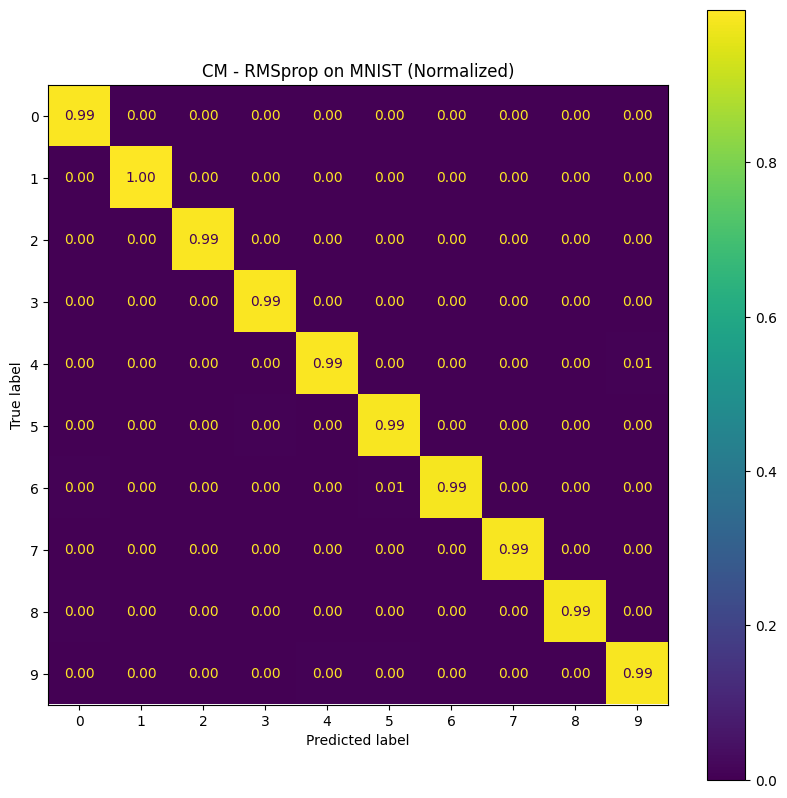

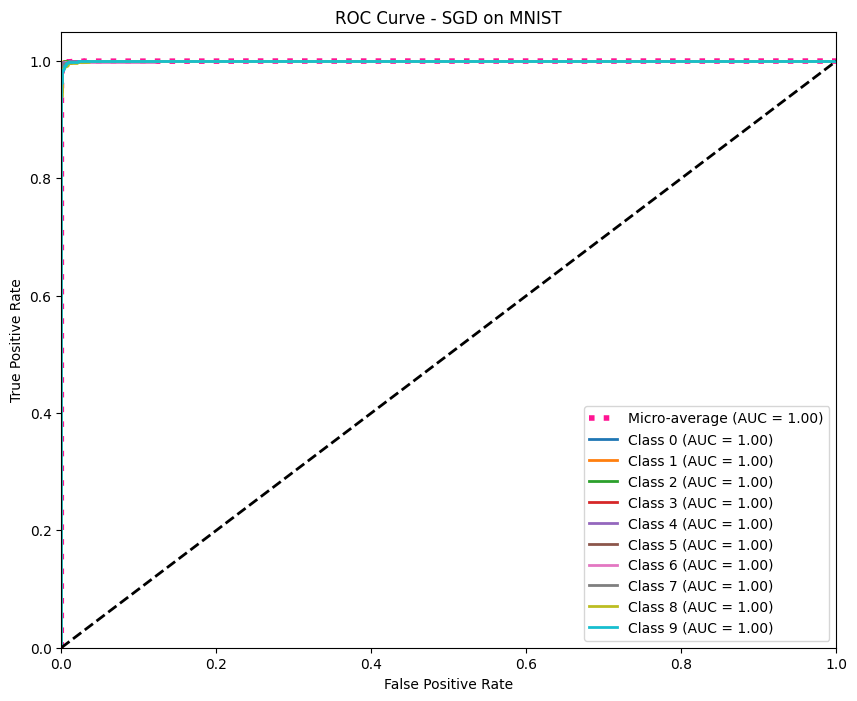

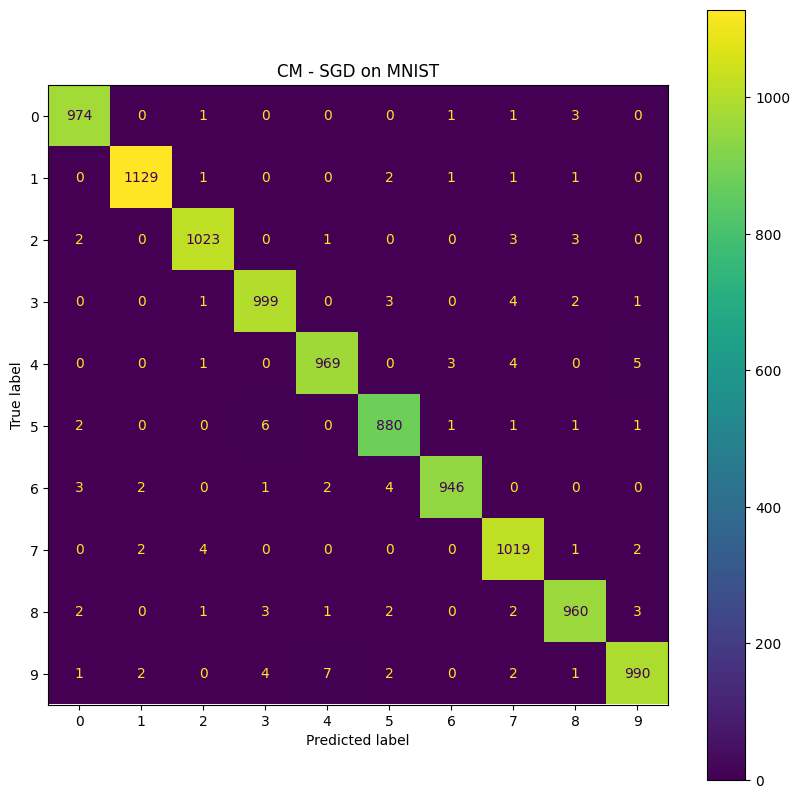

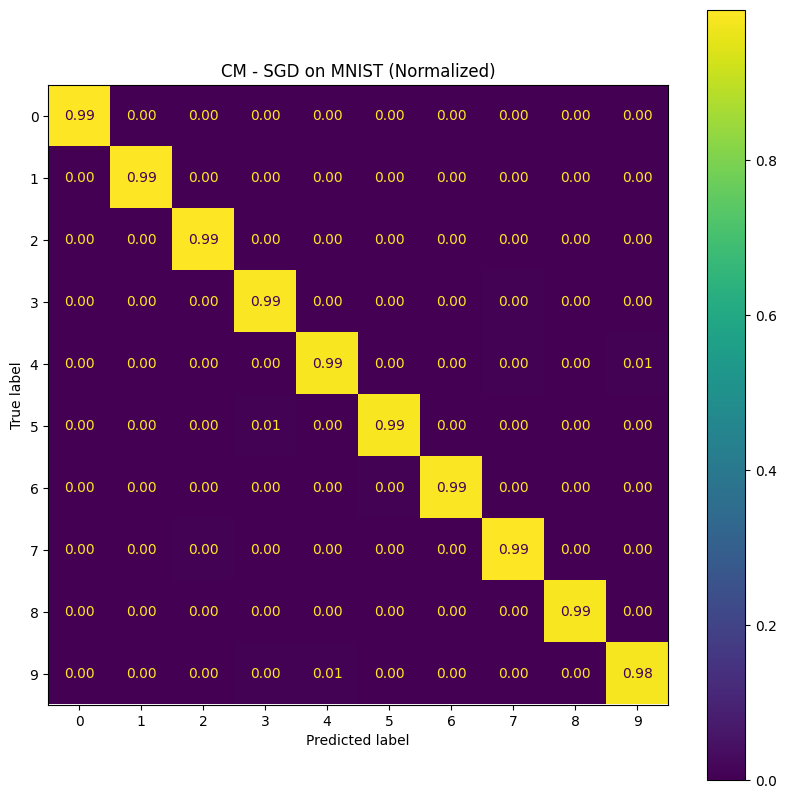


=== LaTeX Table for MNIST ===

\begin{table}[H]
\centering
\begin{tabular}{lcccccccc}\toprule
Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\ \midrule
Griffin & 0.0290 & 0.9923 & 0.9923 & 0.9922 & 0.9922 & 1.0000 & 0.9991 & 13.29 \\
LAMB & 0.0763 & 0.9755 & 0.9754 & 0.9753 & 0.9754 & 0.9996 & 0.9973 & 13.32 \\
Lion & 0.0452 & 0.9909 & 0.9908 & 0.9907 & 0.9907 & 0.9999 & 0.9990 & 12.12 \\
AdamW & 0.0311 & 0.9899 & 0.9898 & 0.9898 & 0.9898 & 0.9999 & 0.9989 & 12.13 \\
Sophia & 0.1104 & 0.9654 & 0.9653 & 0.9652 & 0.9652 & 0.9991 & 0.9962 & 12.30 \\
Nadam & 0.0312 & 0.9901 & 0.9900 & 0.9900 & 0.9900 & 0.9999 & 0.9989 & 12.22 \\
Adam & 0.0297 & 0.9892 & 0.9891 & 0.9891 & 0.9891 & 0.9999 & 0.9988 & 12.19 \\
RMSprop & 0.0274 & 0.9910 & 0.9909 & 0.9908 & 0.9909 & 0.9999 & 0.9990 & 12.15 \\
SGD & 0.0355 & 0.9889 & 0.9888 & 0.9888 & 0.9888 & 0.9999 & 0.9988 & 12.19 \\
\bottomrule
\end{tabular}
\caption{Performance Metrics for MNIST}
\label{

In [1]:
import os
import random
import time
from collections import Counter
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import Optimizer
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
from sklearn.metrics import (
    precision_score, recall_score, f1_score, confusion_matrix,
    ConfusionMatrixDisplay, roc_curve, auc, roc_auc_score
)
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
from typing import Iterable, Tuple, Optional
from itertools import cycle

# ---------------------------
# Setup & Reproducibility
# ---------------------------
def set_seed(seed: int = 42):
    """Sets the random seed for reproducibility across libraries."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

print("Setting random seed for reproducibility...", flush=True)
set_seed()

# Global settings
NUM_EPOCHS = 10
RESULTS_DIR = "results_mnist"
os.makedirs(RESULTS_DIR, exist_ok=True)


# ---------------------------
# Optimizer Implementations
# ---------------------------



import torch
from torch.optim.optimizer import Optimizer
import math


# ---------------------------
# Griffin Optimizer
# ---------------------------
class Griffin(Optimizer):
    def __init__(self, params, lr=5e-4, betas=(0.95, 0.99), weight_decay=1e-4,
                 eps=1e-8, beta_sigma=0.9, schedule_decay=5e-3, warmup_steps=100):
        defaults = dict(lr=lr, betas=betas, weight_decay=weight_decay,
                        eps=eps, beta_sigma=beta_sigma,
                        schedule_decay=schedule_decay, warmup_steps=warmup_steps)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure else None
        for group in self.param_groups:
            lr = group['lr']
            wd = group['weight_decay']
            eps = group['eps']
            beta_sigma = group['beta_sigma']
            schedule_decay = group['schedule_decay']
            warmup_steps = group['warmup_steps']
            beta1, beta2 = group['betas']

            for p in group['params']:
                if p.grad is None:
                    continue

                g = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m_schedule'] = 1.0
                    state['m'] = torch.zeros_like(p)  # 1st moment
                    state['v'] = torch.zeros_like(p)  # 2nd moment
                    state['sigma'] = 0.6  # Scalar sigma per parameter
                    state['g_prev'] = torch.zeros_like(p)  # Previous gradient

                state['step'] += 1
                step = state['step']
                m, v, g_prev = state['m'], state['v'], state['g_prev']
                m_schedule = state['m_schedule']
                sigma = state['sigma']

                # ===== Nadam Momentum Schedule (Optimized) =====
                momentum_t = beta1 * (1. - 0.5 * (0.98 ** (step * schedule_decay)))
                momentum_t1 = beta1 * (1. - 0.5 * (0.98 ** ((step + 1) * schedule_decay)))
                m_schedule = m_schedule * momentum_t
                schedule_next = m_schedule * momentum_t1

                # ===== Efficient Weight Decay =====
                if wd != 0:
                    p.mul_(1 - lr * wd)

                # ===== Low-Cost Moment Updates =====
                # Update momentum (m)
                m.mul_(beta1).add_(g, alpha=1 - beta1)

                # Update adaptive term (v)
                v.mul_(beta2).addcmul_(g, g, value=1 - beta2)

                # ===== Ultra-Efficient Sigma Update =====
                grad_change = (g - g_prev).abs().mean().item()
                stability = 1.0 / (1.0 + 10 * grad_change)
                new_sigma = 0.4 + 0.4 * stability

                # Warmup-controlled sigma update
                warmup_factor = min(1.0, step / warmup_steps)
                sigma = sigma * (beta_sigma * warmup_factor) + new_sigma * (1 - beta_sigma * warmup_factor)
                sigma = max(0.4, min(0.8, sigma))
                state['sigma'] = sigma

                # Store current gradient for next step
                g_prev.copy_(g)

                # ===== Fast Parameter Update =====
                # Bias correction with momentum combination
                bias_corr1 = 1 - beta1 ** step
                bias_corr2 = 1 - beta2 ** step

                m_hat = (beta1 * m) / (1 - beta1**(step+1)) + ((1 - beta1) * g) / (1 - beta1**step)
                v_hat = v / bias_corr2
                denom = v_hat.sqrt().add_(eps)

                # Learning rate with warmup and sigma scaling
                lr_scale = min(1.0, step / warmup_steps)
                step_size = lr * lr_scale * (1. - momentum_t) / (1. - m_schedule) * sigma

                p.addcdiv_(m_hat, denom, value=-step_size)

                # Update momentum schedule
                state['m_schedule'] = schedule_next

        return loss




class Sophia(Optimizer):
    """Implements Sophia algorithm."""
    def __init__(self, params, lr=1e-3, beta1=0.965, beta2=0.99, rho=0.04, weight_decay=1e-3, eps=1e-8):
        defaults = dict(lr=lr, beta1=beta1, beta2=beta2, rho=rho, weight_decay=weight_decay, eps=eps)
        super(Sophia, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure is not None else None
        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p)
                    state['hess_ema'] = torch.ones_like(p)
                m, hess_ema = state['m'], state['hess_ema']
                beta1, beta2, rho, lr, wd, eps = group['beta1'], group['beta2'], group['rho'], group['lr'], group['weight_decay'], group['eps']
                m.mul_(beta1).add_(grad, alpha=1 - beta1)
                hess_ema.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                denom = hess_ema.add(eps)
                scaled_grad = torch.clamp(m / denom, -rho, rho)
                if wd != 0: p.data.mul_(1 - lr * wd)
                p.add_(scaled_grad, alpha=-lr)
                state['step'] += 1
        return loss

class Lion(Optimizer):
    """Implements Lion algorithm."""
    def __init__(self, params, lr=1e-4, betas=(0.9, 0.99), weight_decay=0.0):
        if lr <= 0.0: raise ValueError(f"Invalid learning rate: {lr}")
        if not 0.0 <= betas[0] < 1.0: raise ValueError(f"Invalid beta1: {betas[0]}")
        if not 0.0 <= betas[1] < 1.0: raise ValueError(f"Invalid beta2: {betas[1]}")
        if weight_decay < 0.0: raise ValueError(f"Invalid weight_decay: {weight_decay}")
        defaults = dict(lr=lr, betas=betas, weight_decay=weight_decay)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                if group["weight_decay"] != 0:
                    p.mul_(1 - group["lr"] * group["weight_decay"])
                state = self.state[p]
                if len(state) == 0:
                    state["exp_avg"] = torch.zeros_like(p)
                exp_avg = state["exp_avg"]
                update = exp_avg.mul(group["betas"][0]).add(grad, alpha=1 - group["betas"][0])
                p.add_(update.sign(), alpha=-group["lr"])
                exp_avg.mul_(group["betas"][1]).add_(grad, alpha=1 - group["betas"][1])
        return loss

class LAMB(Optimizer):
    """Implements LAMB optimizer."""
    def __init__(
        self, params: Iterable[torch.nn.Parameter], lr: float = 1e-3,
        betas: Tuple[float, float] = (0.9, 0.999), eps: float = 1e-6,
        weight_decay: float = 0.0, clamp_trust_ratio: Optional[Tuple[float, float]] = (0.0, 10.0)
    ):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay, clamp_trust_ratio=clamp_trust_ratio)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state["step"] = 0
                    state["exp_avg"] = torch.zeros_like(p)
                    state["exp_avg_sq"] = torch.zeros_like(p)
                exp_avg, exp_avg_sq = state["exp_avg"], state["exp_avg_sq"]
                state["step"] += 1
                beta1, beta2 = group["betas"]
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                bias_c1 = 1 - beta1 ** state["step"]
                bias_c2 = 1 - beta2 ** state["step"]
                m_hat = exp_avg / bias_c1
                v_hat = exp_avg_sq / bias_c2
                denom = v_hat.sqrt().add_(group["eps"])
                update = m_hat / denom
                if group["weight_decay"] != 0:
                    update.add_(p, alpha=group["weight_decay"])
                w_norm = p.norm(p=2)
                u_norm = update.norm(p=2)
                trust_ratio = (w_norm / u_norm).item() if w_norm > 0 and u_norm > 0 else 1.0
                if group["clamp_trust_ratio"] is not None:
                    lo, hi = group["clamp_trust_ratio"]
                    trust_ratio = max(lo, min(trust_ratio, hi))
                p.add_(update, alpha=-group["lr"] * trust_ratio)
        return loss

# ---------------------------
# Model and Data for MNIST
# ---------------------------
class LeNet5(nn.Module):
    """A simple LeNet-5 style CNN for MNIST classification."""
    def __init__(self):
        super(LeNet5, self).__init__()
        self.network = nn.Sequential(
            nn.Conv2d(1, 6, kernel_size=5, padding=2), # 28x28 -> 28x28
            nn.ReLU(),
            nn.AvgPool2d(kernel_size=2, stride=2), # 28x28 -> 14x14
            nn.Conv2d(6, 16, kernel_size=5), # 14x14 -> 10x10
            nn.ReLU(),
            nn.AvgPool2d(kernel_size=2, stride=2), # 10x10 -> 5x5
            nn.Flatten(),
            nn.Linear(16 * 5 * 5, 120),
            nn.ReLU(),
            nn.Linear(120, 84),
            nn.ReLU(),
            nn.Linear(84, 10)
        )
    def forward(self, x):
        return self.network(x)

def get_mnist_loaders(batch_size=128, data_root="./data"):
    """Creates and returns MNIST DataLoaders."""
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.1307,), (0.3081,))
    ])
    train_dataset = datasets.MNIST(root=data_root, train=True, download=True, transform=transform)
    test_dataset = datasets.MNIST(root=data_root, train=False, download=True, transform=transform)

    train_size = int(0.9 * len(train_dataset))
    val_size = len(train_dataset) - train_size
    train_subset, val_subset = random_split(train_dataset, [train_size, val_size])

    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True)
    val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)

    return train_loader, val_loader, test_loader

# ---------------------------
# Training and Evaluation
# ---------------------------
def train_model(model_fn, optimizer_factory, train_loader, val_loader, test_loader,
                num_epochs=15, dataset_name="MNIST", run_name="default"):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model_fn().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optimizer_factory(model.parameters())
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    history = { 'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': [] }
    start_time = time.time()

    print(f"Training {run_name} on {dataset_name} for {num_epochs} epochs on {device}...")

    for epoch in range(num_epochs):
        epoch_start = time.time()
        model.train()
        train_loss, train_correct, train_total = 0.0, 0, 0
        for data, targets in train_loader:
            data, targets = data.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(data)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            train_total += targets.size(0)
            train_correct += preds.eq(targets).sum().item()

        history['train_loss'].append(train_loss / train_total)
        history['train_acc'].append(train_correct / train_total)

        model.eval()
        val_loss, val_correct, val_total = 0.0, 0, 0
        with torch.no_grad():
            for data, targets in val_loader:
                data, targets = data.to(device), targets.to(device)
                outputs = model(data)
                loss = criterion(outputs, targets)
                val_loss += loss.item() * data.size(0)
                _, preds = outputs.max(1)
                val_total += targets.size(0)
                val_correct += preds.eq(targets).sum().item()

        history['val_loss'].append(val_loss / val_total)
        history['val_acc'].append(val_correct / val_total)

        print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {history['train_loss'][-1]:.4f}, Acc: {history['train_acc'][-1]:.4f} | "
              f"Val Loss: {history['val_loss'][-1]:.4f}, Acc: {history['val_acc'][-1]:.4f} | Time: {time.time() - epoch_start:.2f}s")
        scheduler.step()

    # --- Test Phase ---
    model.eval()
    all_preds, all_targets, all_probs = [], [], []
    test_loss_sum = 0.0
    with torch.no_grad():
        for data, targets in test_loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            loss = criterion(outputs, targets)
            test_loss_sum += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            all_preds.extend(preds.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
            all_probs.extend(torch.softmax(outputs, dim=1).cpu().numpy())

    # --- Final Metrics Calculation ---
    final_metrics = {}
    all_preds = np.array(all_preds)
    all_targets = np.array(all_targets)
    all_probs = np.array(all_probs)

    final_metrics['test_loss'] = test_loss_sum / len(all_targets)
    final_metrics['test_acc'] = (all_preds == all_targets).mean()
    final_metrics['test_precision'] = precision_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_recall'] = recall_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_f1'] = f1_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_auc'] = roc_auc_score(all_targets, all_probs, multi_class='ovr')

    cm = confusion_matrix(all_targets, all_preds)
    specificity = []
    for i in range(cm.shape[0]):
        tn = cm.sum() - (cm[i, :].sum() + cm[:, i].sum() - cm[i, i])
        fp = cm[:, i].sum() - cm[i, i]
        specificity.append(tn / (tn + fp + 1e-8))
    final_metrics['test_specificity'] = np.mean(specificity)

    final_metrics['runtime'] = time.time() - start_time
    final_metrics['avg_epoch_time'] = final_metrics['runtime'] / num_epochs
    final_metrics['targets'] = all_targets
    final_metrics['preds'] = all_preds
    final_metrics['probs'] = all_probs

    print(f"\nFinal Test Results for {run_name}: Acc: {final_metrics['test_acc']:.4f}, F1: {final_metrics['test_f1']:.4f}, AUC: {final_metrics['test_auc']:.4f}\n")

    return {**history, **final_metrics}

# ---------------------------
# Optimizers Setup
# ---------------------------
optimizers = {
    'Griffin': lambda params:  Griffin(params, lr=1e-2, betas=(0.9, 0.999),
            weight_decay=1e-3, eps=1e-8, beta_sigma=0.99, schedule_decay=1e-3, warmup_steps=100),
    'LAMB': lambda params: LAMB(params, lr=1e-3, weight_decay=1e-4),
    'Lion': lambda params: Lion(params, lr=1e-3, weight_decay=1e-4),
    'AdamW': lambda params: optim.AdamW(params, lr=1e-3, weight_decay=1e-4),
    'Sophia': lambda params: Sophia(params, lr=1e-3, weight_decay=1e-4),
    'Nadam': lambda params: optim.NAdam(params, lr=1e-3, weight_decay=1e-4),
    'Adam': lambda params: optim.Adam(params, lr=1e-3, weight_decay=1e-4),
    'RMSprop': lambda params: optim.RMSprop(params, lr=1e-3, weight_decay=1e-4),
    'SGD': lambda params: optim.SGD(params, lr=0.01, momentum=0.9, weight_decay=1e-4),
}


# ---------------------------
# Plotting, Saving, and Table Utilities
# ---------------------------
def plot_learning_curves(results, dataset_name, save_path=None):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    for opt_name, metrics in results.items():
        ax1.plot(metrics['train_acc'], label=f'{opt_name} Train', linestyle='-')
        ax1.plot(metrics['val_acc'], label=f'{opt_name} Val', linestyle='--')
    ax1.set_title(f'{dataset_name} - Accuracy Curves'); ax1.set_xlabel('Epoch'); ax1.set_ylabel('Accuracy'); ax1.legend(); ax1.grid(True)
    for opt_name, metrics in results.items():
        ax2.plot(metrics['train_loss'], label=f'{opt_name} Train', linestyle='-')
        ax2.plot(metrics['val_loss'], label=f'{opt_name} Val', linestyle='--')
    ax2.set_title(f'{dataset_name} - Loss Curves'); ax2.set_xlabel('Epoch'); ax2.set_ylabel('Loss'); ax2.legend(); ax2.grid(True)
    plt.tight_layout()
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_test_metrics(results, dataset_name, save_path=None):
    metrics_list = ['test_acc', 'test_precision', 'test_recall', 'test_f1', 'test_auc', 'test_specificity']
    metric_names = ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Specificity']
    plt.figure(figsize=(14, 7)); bar_width = 0.12; x = np.arange(len(results))
    for i, metric in enumerate(metrics_list):
        values = [results[opt][metric] for opt in results]
        plt.bar(x + i * bar_width, values, width=bar_width, label=metric_names[i])
    plt.title(f'{dataset_name} - Test Metrics Comparison'); plt.xlabel('Optimizer'); plt.ylabel('Score')
    plt.xticks(x + bar_width * (len(metrics_list)/2 - 0.5), list(results.keys()), rotation=45, ha="right"); plt.ylim(0, 1.1); plt.legend(); plt.grid(axis='y', linestyle='--', alpha=0.7); plt.tight_layout()
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_roc_curves(result, opt_name, class_names, dataset_name, save_path=None):
    probs, targets = result['probs'], result['targets']
    targets_bin = label_binarize(targets, classes=range(len(class_names)))
    fpr, tpr, roc_auc = {}, {}, {}
    for i in range(len(class_names)):
        fpr[i], tpr[i], _ = roc_curve(targets_bin[:, i], probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    fpr["micro"], tpr["micro"], _ = roc_curve(targets_bin.ravel(), probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    plt.figure(figsize=(10, 8))
    plt.plot(fpr["micro"], tpr["micro"], label=f'Micro-average (AUC = {roc_auc["micro"]:.2f})', color='deeppink', linestyle=':', linewidth=4)
    # Corrected MatplotlibDeprecationWarning
    colors = cycle(plt.get_cmap('tab10').colors)
    for i, color in zip(range(len(class_names)), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2, label=f'Class {class_names[i]} (AUC = {roc_auc[i]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2); plt.xlim([0.0, 1.0]); plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate'); plt.title(f'ROC Curve - {opt_name} on {dataset_name}'); plt.legend(loc="lower right")
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_confusion_matrix(result, opt_name, class_names, dataset_name, normalize=False, save_path=None):
    cm = confusion_matrix(result['targets'], result['preds'])
    title = f'CM - {opt_name} on {dataset_name}'
    if normalize:
        cm = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-8)
        title += ' (Normalized)'
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    fig, ax = plt.subplots(figsize=(10, 10))
    disp.plot(ax=ax, cmap='viridis', values_format='.2f' if normalize else 'd')
    plt.title(title)
    if save_path: plt.savefig(save_path)
    plt.show()

def generate_latex_table(results, dataset_name):
    """Generates a LaTeX table with all relevant metrics."""
    header = (
        "\\begin{table}[H]\n\\centering\n"
        "\\begin{tabular}{lcccccccc}\\toprule\n"
        "Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\\\ \\midrule\n"
    )

    footer = (
        "\\bottomrule\n\\end{tabular}\n"
        f"\\caption{{Performance Metrics for {dataset_name}}}\n"
        f"\\label{{tab:{dataset_name.lower().replace('-', '_')}_perf}}\n"
        "\\end{table}"
    )

    rows = []
    for opt, m in results.items():
        rows.append(
            f"{opt} & {m['test_loss']:.4f} & {m['test_acc']:.4f} & "
            f"{m['test_precision']:.4f} & {m['test_recall']:.4f} & {m['test_f1']:.4f} & "
            f"{m['test_auc']:.4f} & {m['test_specificity']:.4f} & {m['avg_epoch_time']:.2f} \\\\"
        )

    return header + "\n".join(rows) + "\n" + footer

# ---------------------------
# Main Execution
# ---------------------------
if __name__ == "__main__":
    mnist_class_names = [str(i) for i in range(10)]
    train_loader, val_loader, test_loader = get_mnist_loaders()

    results_mnist = {}
    for opt_name, opt_factory in optimizers.items():
        results_mnist[opt_name] = train_model(
            LeNet5, opt_factory, train_loader, val_loader, test_loader,
            num_epochs=NUM_EPOCHS, dataset_name="MNIST", run_name=opt_name
        )

    # --- Generate and Save Artifacts ---
    print("\n--- Generating and Saving All Artifacts for MNIST ---")
    plot_learning_curves(results_mnist, "MNIST", save_path=os.path.join(RESULTS_DIR, "mnist_learning_curves.png"))
    plot_test_metrics(results_mnist, "MNIST", save_path=os.path.join(RESULTS_DIR, "mnist_test_metrics.png"))

    for opt_name, result in results_mnist.items():
        plot_roc_curves(result, opt_name, mnist_class_names, "MNIST", save_path=os.path.join(RESULTS_DIR, f"roc_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, mnist_class_names, "MNIST", normalize=False, save_path=os.path.join(RESULTS_DIR, f"cm_raw_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, mnist_class_names, "MNIST", normalize=True, save_path=os.path.join(RESULTS_DIR, f"cm_norm_{opt_name}.png"))

    # --- Generate, Print, and Save LaTeX and TXT Table ---
    latex_table_str = generate_latex_table(results_mnist, "MNIST")
    print("\n=== LaTeX Table for MNIST ===\n")
    print(latex_table_str)

    # Save as .tex file
    tex_path = os.path.join(RESULTS_DIR, "mnist_results_table.tex")
    with open(tex_path, "w") as f:
        f.write(latex_table_str)
    print(f"LaTeX table saved to: {tex_path}")

    # Save as .txt file (without LaTeX commands for readability)
    txt_path = os.path.join(RESULTS_DIR, "mnist_results_summary.txt")
    with open(txt_path, "w") as f:
        f.write("Optimizer, Test Loss, Test Acc, Precision, Recall, F1, AUC, Specificity, Avg Epoch Time (s)\n")
        for opt, m in results_mnist.items():
             f.write(
                f"{opt}, {m['test_loss']:.4f}, {m['test_acc']:.4f}, "
                f"{m['test_precision']:.4f}, {m['test_recall']:.4f}, {m['test_f1']:.4f}, "
                f"{m['test_auc']:.4f}, {m['test_specificity']:.4f}, {m['avg_epoch_time']:.2f}\n"
            )
    print(f"Summary text file saved to: {txt_path}")


    print("\n--- Script Finished ---")

In [3]:
from google.colab import files
import os
import zipfile

# Define the directory to zip
results_dir = "/content/results_mnist"
# Define the name for the zip file
zip_filename = "/content/results_mnist.zip"

# Create a ZipFile object
if os.path.exists(results_dir):
    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Walk through the directory and add files to the zip
        for root, _, files_in_dir in os.walk(results_dir):
            for file in files_in_dir:
                file_path = os.path.join(root, file)
                # Add file to zip, preserving directory structure
                zipf.write(file_path, os.path.relpath(file_path, results_dir))
    print(f"Successfully created {zip_filename}")

    # Download the zip file
    files.download(zip_filename)
else:
    print(f"Error: Directory '{results_dir}' not found.")

Successfully created /content/results_mnist.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# !rm -rf data

# 3- MNIST-NOISY

Setting random seed for reproducibility...
Training Griffin on Noisy MNIST for 10 epochs on cuda...
Epoch 1/10 | Train Loss: 0.3274, Acc: 0.8959 | Val Loss: 0.0758, Acc: 0.9772 | Time: 24.19s
Epoch 2/10 | Train Loss: 0.0648, Acc: 0.9803 | Val Loss: 0.0590, Acc: 0.9810 | Time: 15.30s
Epoch 3/10 | Train Loss: 0.0479, Acc: 0.9852 | Val Loss: 0.0610, Acc: 0.9825 | Time: 15.55s
Epoch 4/10 | Train Loss: 0.0383, Acc: 0.9880 | Val Loss: 0.0529, Acc: 0.9848 | Time: 15.51s
Epoch 5/10 | Train Loss: 0.0280, Acc: 0.9911 | Val Loss: 0.0449, Acc: 0.9883 | Time: 16.18s
Epoch 6/10 | Train Loss: 0.0202, Acc: 0.9934 | Val Loss: 0.0389, Acc: 0.9898 | Time: 15.38s
Epoch 7/10 | Train Loss: 0.0148, Acc: 0.9953 | Val Loss: 0.0400, Acc: 0.9895 | Time: 15.40s
Epoch 8/10 | Train Loss: 0.0092, Acc: 0.9970 | Val Loss: 0.0371, Acc: 0.9903 | Time: 15.36s
Epoch 9/10 | Train Loss: 0.0061, Acc: 0.9983 | Val Loss: 0.0325, Acc: 0.9912 | Time: 16.22s
Epoch 10/10 | Train Loss: 0.0045, Acc: 0.9989 | Val Loss: 0.0351, Acc: 0

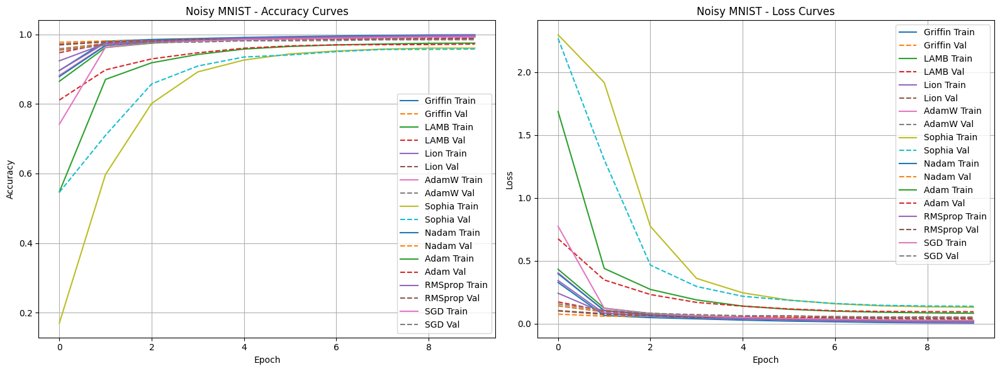

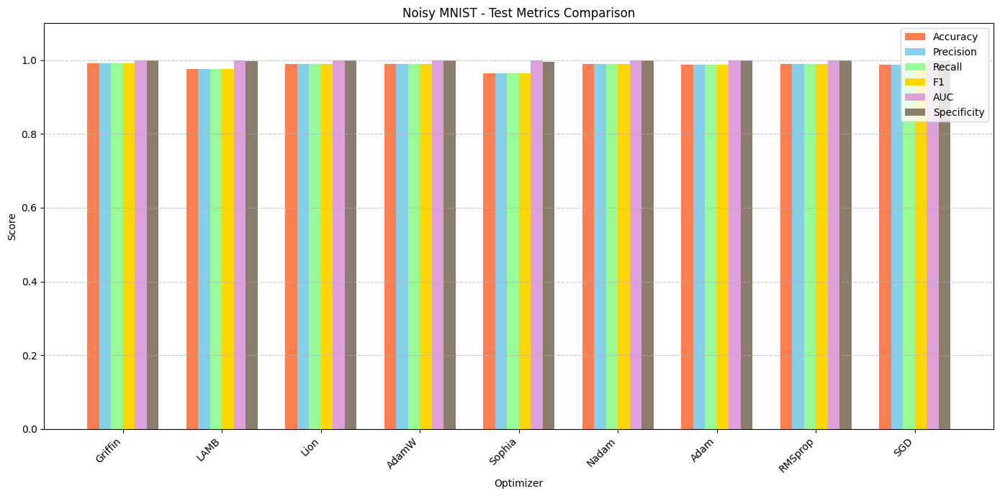

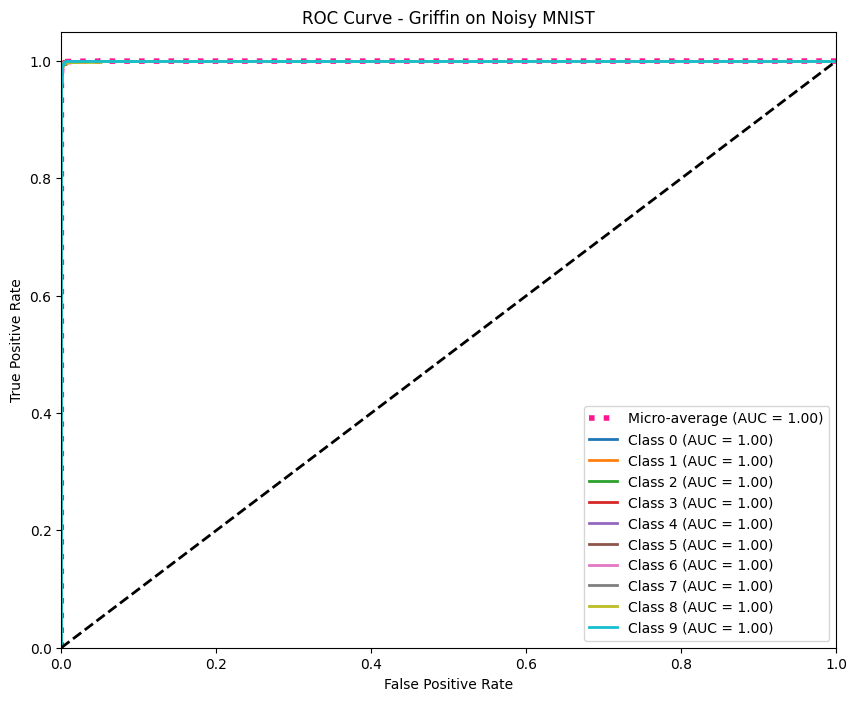

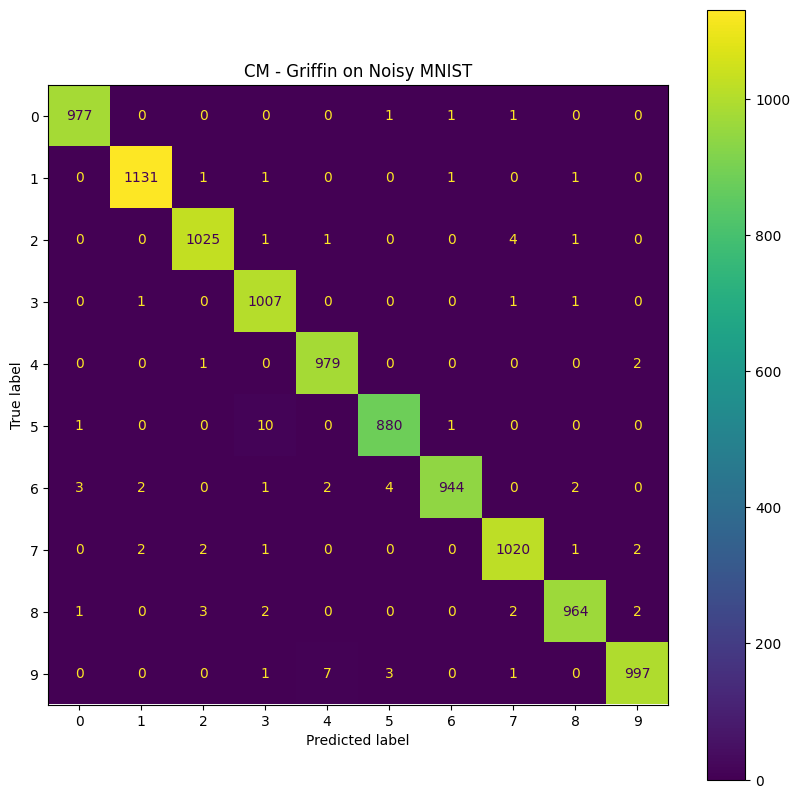

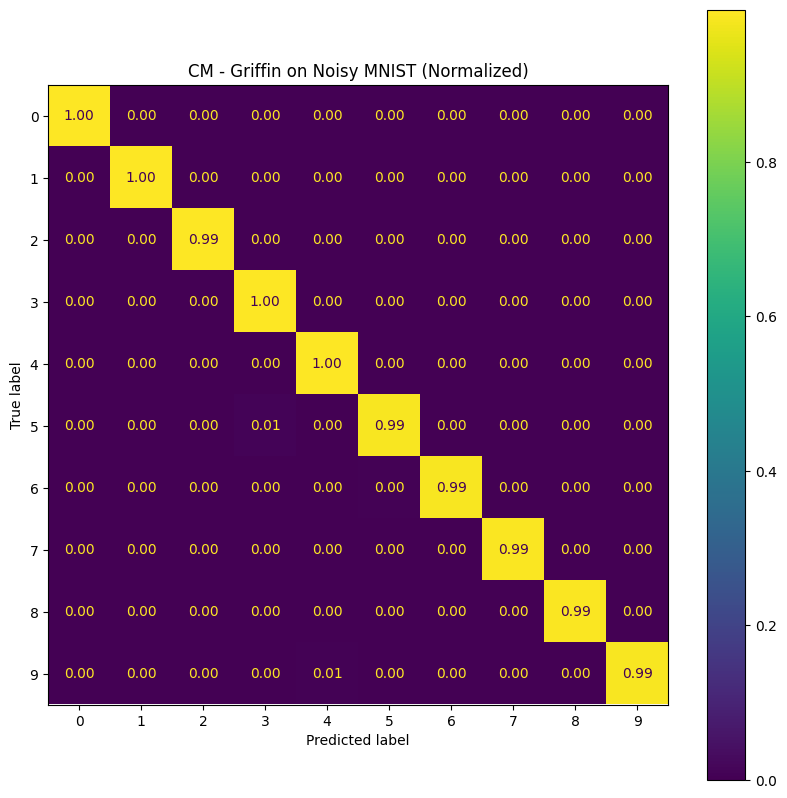

...

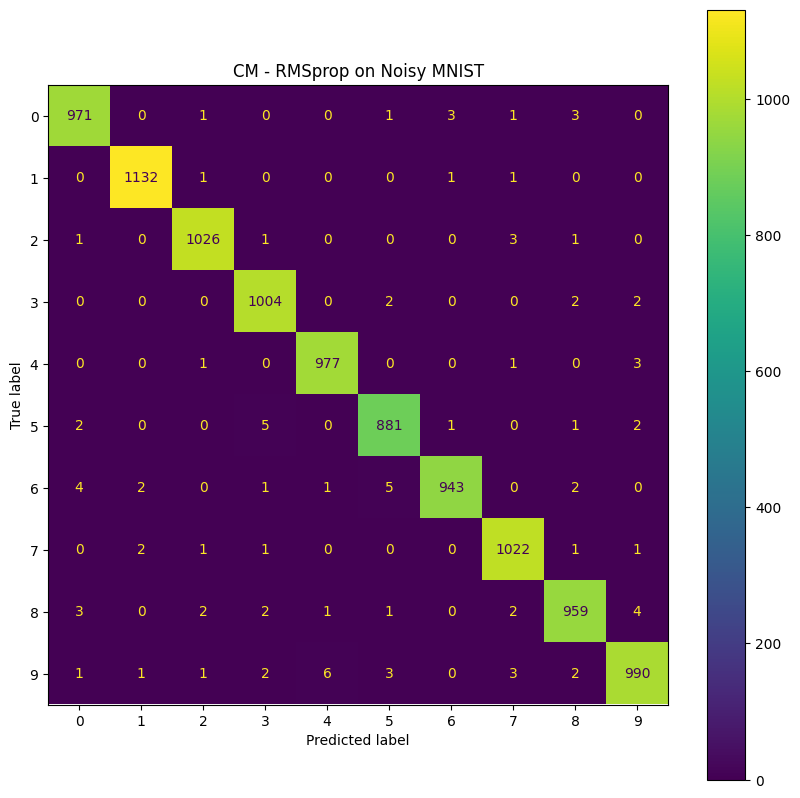

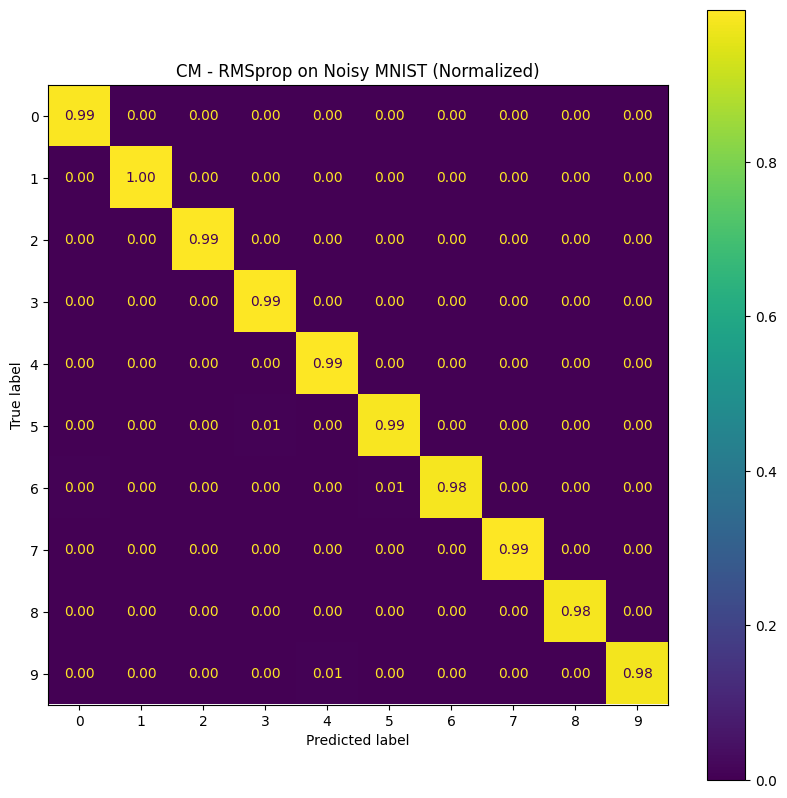

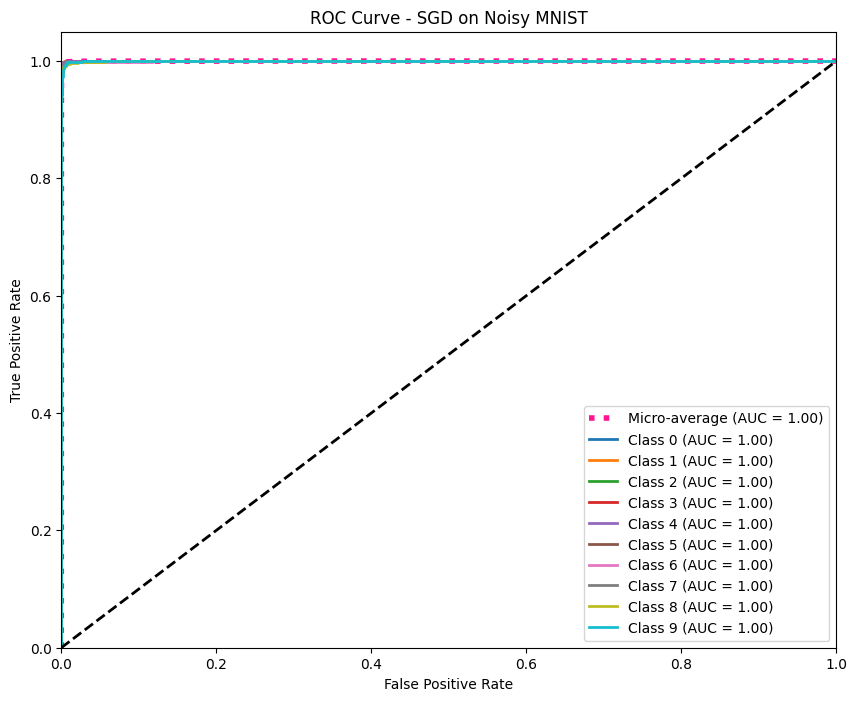

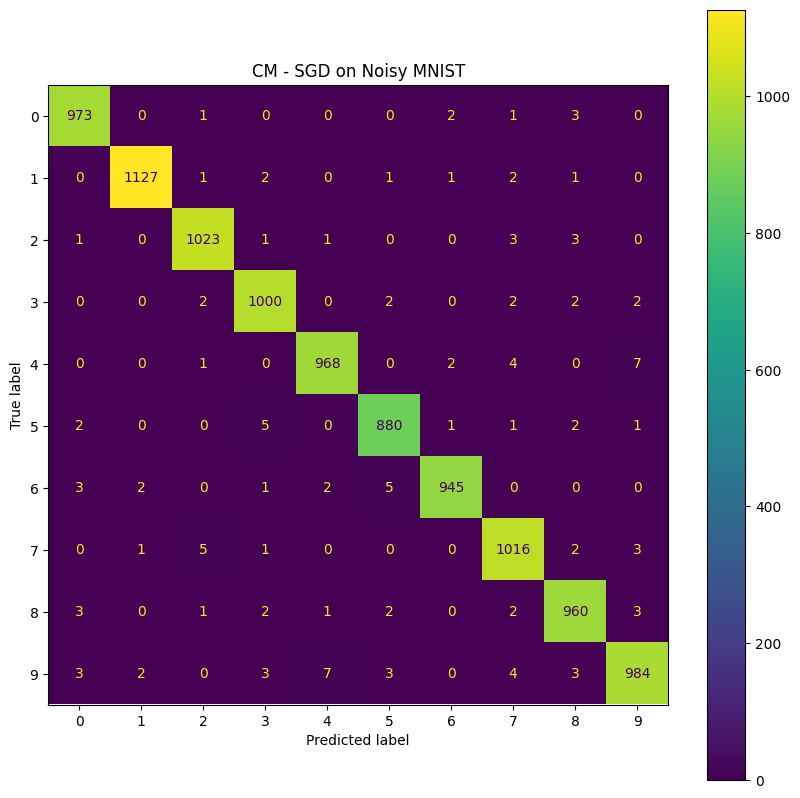

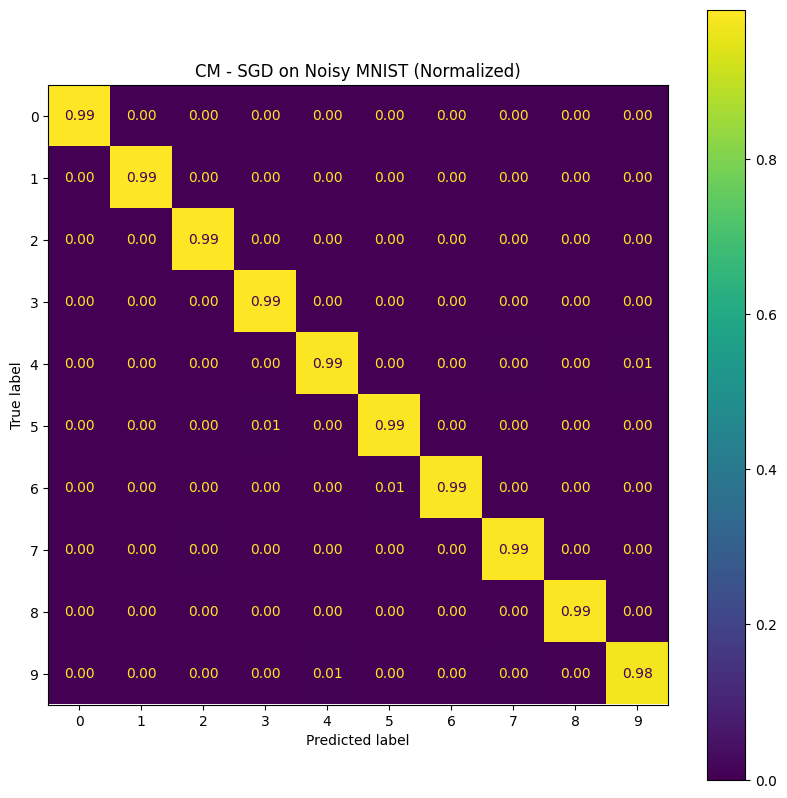


=== LaTeX Table for Noisy MNIST ===

\begin{table}[H]
\centering
\begin{tabular}{lcccccccc}\toprule
Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\ \midrule
Griffin & 0.0271 & 0.9924 & 0.9924 & 0.9923 & 0.9923 & 1.0000 & 0.9992 & 16.67 \\
LAMB & 0.0777 & 0.9754 & 0.9754 & 0.9752 & 0.9753 & 0.9996 & 0.9973 & 15.86 \\
Lion & 0.0441 & 0.9897 & 0.9897 & 0.9896 & 0.9896 & 0.9999 & 0.9989 & 14.79 \\
AdamW & 0.0325 & 0.9890 & 0.9889 & 0.9888 & 0.9888 & 0.9999 & 0.9988 & 15.02 \\
Sophia & 0.1179 & 0.9638 & 0.9637 & 0.9637 & 0.9637 & 0.9989 & 0.9960 & 15.14 \\
Nadam & 0.0308 & 0.9898 & 0.9897 & 0.9897 & 0.9897 & 0.9999 & 0.9989 & 14.79 \\
Adam & 0.0337 & 0.9876 & 0.9875 & 0.9874 & 0.9875 & 0.9999 & 0.9986 & 14.67 \\
RMSprop & 0.0287 & 0.9905 & 0.9904 & 0.9903 & 0.9904 & 0.9999 & 0.9989 & 14.66 \\
SGD & 0.0367 & 0.9876 & 0.9875 & 0.9875 & 0.9875 & 0.9999 & 0.9986 & 14.62 \\
\bottomrule
\end{tabular}
\caption{Performance Metrics for Noisy MN

In [ ]:
import os
import random
import time
from collections import Counter
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import Optimizer
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
from sklearn.metrics import (
    precision_score, recall_score, f1_score, confusion_matrix,
    ConfusionMatrixDisplay, roc_curve, auc, roc_auc_score
)
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
from typing import Iterable, Tuple, Optional
from itertools import cycle

# ---------------------------
# Setup & Reproducibility
# ---------------------------
def set_seed(seed: int = 42):
    """Sets the random seed for reproducibility across libraries."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

print("Setting random seed for reproducibility...", flush=True)
set_seed()

# Global settings
NUM_EPOCHS = 10
RESULTS_DIR = "results_noisy_mnist"
os.makedirs(RESULTS_DIR, exist_ok=True)


# ---------------------------
# Optimizer Implementations
# ---------------------------

import torch
from torch.optim.optimizer import Optimizer
import math


# ---------------------------
# Griffin Optimizer
# ---------------------------
class Griffin(Optimizer):
    def __init__(self, params, lr=5e-4, betas=(0.95, 0.99), weight_decay=1e-4,
                 eps=1e-8, beta_sigma=0.9, schedule_decay=5e-3, warmup_steps=100):
        defaults = dict(lr=lr, betas=betas, weight_decay=weight_decay,
                        eps=eps, beta_sigma=beta_sigma,
                        schedule_decay=schedule_decay, warmup_steps=warmup_steps)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure else None
        for group in self.param_groups:
            lr = group['lr']
            wd = group['weight_decay']
            eps = group['eps']
            beta_sigma = group['beta_sigma']
            schedule_decay = group['schedule_decay']
            warmup_steps = group['warmup_steps']
            beta1, beta2 = group['betas']

            for p in group['params']:
                if p.grad is None:
                    continue

                g = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m_schedule'] = 1.0
                    state['m'] = torch.zeros_like(p)  # 1st moment
                    state['v'] = torch.zeros_like(p)  # 2nd moment
                    state['sigma'] = 0.6  # Scalar sigma per parameter
                    state['g_prev'] = torch.zeros_like(p)  # Previous gradient

                state['step'] += 1
                step = state['step']
                m, v, g_prev = state['m'], state['v'], state['g_prev']
                m_schedule = state['m_schedule']
                sigma = state['sigma']

                # ===== Nadam Momentum Schedule (Optimized) =====
                momentum_t = beta1 * (1. - 0.5 * (0.98 ** (step * schedule_decay)))
                momentum_t1 = beta1 * (1. - 0.5 * (0.98 ** ((step + 1) * schedule_decay)))
                m_schedule = m_schedule * momentum_t
                schedule_next = m_schedule * momentum_t1

                # ===== Efficient Weight Decay =====
                if wd != 0:
                    p.mul_(1 - lr * wd)

                # ===== Low-Cost Moment Updates =====
                # Update momentum (m)
                m.mul_(beta1).add_(g, alpha=1 - beta1)

                # Update adaptive term (v)
                v.mul_(beta2).addcmul_(g, g, value=1 - beta2)

                # ===== Ultra-Efficient Sigma Update =====
                grad_change = (g - g_prev).abs().mean().item()
                stability = 1.0 / (1.0 + 10 * grad_change)
                new_sigma = 0.4 + 0.4 * stability

                # Warmup-controlled sigma update
                warmup_factor = min(1.0, step / warmup_steps)
                sigma = sigma * (beta_sigma * warmup_factor) + new_sigma * (1 - beta_sigma * warmup_factor)
                sigma = max(0.4, min(0.8, sigma))
                state['sigma'] = sigma

                # Store current gradient for next step
                g_prev.copy_(g)

                # ===== Fast Parameter Update =====
                # Bias correction with momentum combination
                bias_corr1 = 1 - beta1 ** step
                bias_corr2 = 1 - beta2 ** step

                m_hat = (beta1 * m) / (1 - beta1**(step+1)) + ((1 - beta1) * g) / (1 - beta1**step)
                v_hat = v / bias_corr2
                denom = v_hat.sqrt().add_(eps)

                # Learning rate with warmup and sigma scaling
                lr_scale = min(1.0, step / warmup_steps)
                step_size = lr * lr_scale * (1. - momentum_t) / (1. - m_schedule) * sigma

                p.addcdiv_(m_hat, denom, value=-step_size)

                # Update momentum schedule
                state['m_schedule'] = schedule_next

        return loss



class Sophia(Optimizer):
    """Implements Sophia algorithm."""
    def __init__(self, params, lr=1e-3, beta1=0.965, beta2=0.99, rho=0.04, weight_decay=1e-3, eps=1e-8):
        defaults = dict(lr=lr, beta1=beta1, beta2=beta2, rho=rho, weight_decay=weight_decay, eps=eps)
        super(Sophia, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure is not None else None
        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p)
                    state['hess_ema'] = torch.ones_like(p)
                m, hess_ema = state['m'], state['hess_ema']
                beta1, beta2, rho, lr, wd, eps = group['beta1'], group['beta2'], group['rho'], group['lr'], group['weight_decay'], group['eps']
                m.mul_(beta1).add_(grad, alpha=1 - beta1)
                hess_ema.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                denom = hess_ema.add(eps)
                scaled_grad = torch.clamp(m / denom, -rho, rho)
                if wd != 0: p.data.mul_(1 - lr * wd)
                p.add_(scaled_grad, alpha=-lr)
                state['step'] += 1
        return loss

class Lion(Optimizer):
    """Implements Lion algorithm."""
    def __init__(self, params, lr=1e-4, betas=(0.9, 0.99), weight_decay=0.0):
        if lr <= 0.0: raise ValueError(f"Invalid learning rate: {lr}")
        if not 0.0 <= betas[0] < 1.0: raise ValueError(f"Invalid beta1: {betas[0]}")
        if not 0.0 <= betas[1] < 1.0: raise ValueError(f"Invalid beta2: {betas[1]}")
        if weight_decay < 0.0: raise ValueError(f"Invalid weight_decay: {weight_decay}")
        defaults = dict(lr=lr, betas=betas, weight_decay=weight_decay)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                if group["weight_decay"] != 0:
                    p.mul_(1 - group["lr"] * group["weight_decay"])
                state = self.state[p]
                if len(state) == 0:
                    state["exp_avg"] = torch.zeros_like(p)
                exp_avg = state["exp_avg"]
                update = exp_avg.mul(group["betas"][0]).add(grad, alpha=1 - group["betas"][0])
                p.add_(update.sign(), alpha=-group["lr"])
                exp_avg.mul_(group["betas"][1]).add_(grad, alpha=1 - group["betas"][1])
        return loss

class LAMB(Optimizer):
    """Implements LAMB optimizer."""
    def __init__(
        self, params: Iterable[torch.nn.Parameter], lr: float = 1e-3,
        betas: Tuple[float, float] = (0.9, 0.999), eps: float = 1e-6,
        weight_decay: float = 0.0, clamp_trust_ratio: Optional[Tuple[float, float]] = (0.0, 10.0)
    ):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay, clamp_trust_ratio=clamp_trust_ratio)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state["step"] = 0
                    state["exp_avg"] = torch.zeros_like(p)
                    state["exp_avg_sq"] = torch.zeros_like(p)
                exp_avg, exp_avg_sq = state["exp_avg"], state["exp_avg_sq"]
                state["step"] += 1
                beta1, beta2 = group["betas"]
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                bias_c1 = 1 - beta1 ** state["step"]
                bias_c2 = 1 - beta2 ** state["step"]
                m_hat = exp_avg / bias_c1
                v_hat = exp_avg_sq / bias_c2
                denom = v_hat.sqrt().add_(group["eps"])
                update = m_hat / denom
                if group["weight_decay"] != 0:
                    update.add_(p, alpha=group["weight_decay"])
                w_norm = p.norm(p=2)
                u_norm = update.norm(p=2)
                trust_ratio = (w_norm / u_norm).item() if w_norm > 0 and u_norm > 0 else 1.0
                if group["clamp_trust_ratio"] is not None:
                    lo, hi = group["clamp_trust_ratio"]
                    trust_ratio = max(lo, min(trust_ratio, hi))
                p.add_(update, alpha=-group["lr"] * trust_ratio)
        return loss

# ---------------------------
# Model and Data for Noisy MNIST
# ---------------------------
class AddGaussianNoise(object):
    """Adds Gaussian noise to a tensor."""
    def __init__(self, mean=0., std=1.):
        self.std = std
        self.mean = mean

    def __call__(self, tensor):
        return tensor + torch.randn(tensor.size()) * self.std + self.mean

    def __repr__(self):
        return self.__class__.__name__ + f'(mean={self.mean}, std={self.std})'

class LeNet5(nn.Module):
    """A simple LeNet-5 style CNN for MNIST classification."""
    def __init__(self):
        super(LeNet5, self).__init__()
        self.network = nn.Sequential(
            nn.Conv2d(1, 6, kernel_size=5, padding=2), # 28x28 -> 28x28
            nn.ReLU(),
            nn.AvgPool2d(kernel_size=2, stride=2), # 28x28 -> 14x14
            nn.Conv2d(6, 16, kernel_size=5), # 14x14 -> 10x10
            nn.ReLU(),
            nn.AvgPool2d(kernel_size=2, stride=2), # 10x10 -> 5x5
            nn.Flatten(),
            nn.Linear(16 * 5 * 5, 120),
            nn.ReLU(),
            nn.Linear(120, 84),
            nn.ReLU(),
            nn.Linear(84, 10)
        )
    def forward(self, x):
        return self.network(x)

def get_noisy_mnist_loaders(batch_size=128, data_root="./data", noise_std=0.3):
    """Creates and returns Noisy MNIST DataLoaders."""
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.1307,), (0.3081,)),
        AddGaussianNoise(0., noise_std)
    ])
    train_dataset = datasets.MNIST(root=data_root, train=True, download=True, transform=transform)
    test_dataset = datasets.MNIST(root=data_root, train=False, download=True, transform=transform)

    train_size = int(0.9 * len(train_dataset))
    val_size = len(train_dataset) - train_size
    train_subset, val_subset = random_split(train_dataset, [train_size, val_size])

    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True)
    val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)

    return train_loader, val_loader, test_loader

# ---------------------------
# Training and Evaluation
# ---------------------------
def train_model(model_fn, optimizer_factory, train_loader, val_loader, test_loader,
                num_epochs=15, dataset_name="Noisy MNIST", run_name="default"):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model_fn().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optimizer_factory(model.parameters())
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    history = { 'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': [] }
    start_time = time.time()

    print(f"Training {run_name} on {dataset_name} for {num_epochs} epochs on {device}...")

    for epoch in range(num_epochs):
        epoch_start = time.time()
        model.train()
        train_loss, train_correct, train_total = 0.0, 0, 0
        for data, targets in train_loader:
            data, targets = data.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(data)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            train_total += targets.size(0)
            train_correct += preds.eq(targets).sum().item()

        history['train_loss'].append(train_loss / train_total)
        history['train_acc'].append(train_correct / train_total)

        model.eval()
        val_loss, val_correct, val_total = 0.0, 0, 0
        with torch.no_grad():
            for data, targets in val_loader:
                data, targets = data.to(device), targets.to(device)
                outputs = model(data)
                loss = criterion(outputs, targets)
                val_loss += loss.item() * data.size(0)
                _, preds = outputs.max(1)
                val_total += targets.size(0)
                val_correct += preds.eq(targets).sum().item()

        history['val_loss'].append(val_loss / val_total)
        history['val_acc'].append(val_correct / val_total)

        print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {history['train_loss'][-1]:.4f}, Acc: {history['train_acc'][-1]:.4f} | "
              f"Val Loss: {history['val_loss'][-1]:.4f}, Acc: {history['val_acc'][-1]:.4f} | Time: {time.time() - epoch_start:.2f}s")
        scheduler.step()

    # --- Test Phase ---
    model.eval()
    all_preds, all_targets, all_probs = [], [], []
    test_loss_sum = 0.0
    with torch.no_grad():
        for data, targets in test_loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            loss = criterion(outputs, targets)
            test_loss_sum += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            all_preds.extend(preds.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
            all_probs.extend(torch.softmax(outputs, dim=1).cpu().numpy())

    # --- Final Metrics Calculation ---
    final_metrics = {}
    all_preds = np.array(all_preds)
    all_targets = np.array(all_targets)
    all_probs = np.array(all_probs)

    final_metrics['test_loss'] = test_loss_sum / len(all_targets)
    final_metrics['test_acc'] = (all_preds == all_targets).mean()
    final_metrics['test_precision'] = precision_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_recall'] = recall_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_f1'] = f1_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_auc'] = roc_auc_score(all_targets, all_probs, multi_class='ovr')

    cm = confusion_matrix(all_targets, all_preds)
    specificity = []
    for i in range(cm.shape[0]):
        tn = cm.sum() - (cm[i, :].sum() + cm[:, i].sum() - cm[i, i])
        fp = cm[:, i].sum() - cm[i, i]
        specificity.append(tn / (tn + fp + 1e-8))
    final_metrics['test_specificity'] = np.mean(specificity)

    final_metrics['runtime'] = time.time() - start_time
    final_metrics['avg_epoch_time'] = final_metrics['runtime'] / num_epochs
    final_metrics['targets'] = all_targets
    final_metrics['preds'] = all_preds
    final_metrics['probs'] = all_probs

    print(f"\nFinal Test Results for {run_name}: Acc: {final_metrics['test_acc']:.4f}, F1: {final_metrics['test_f1']:.4f}, AUC: {final_metrics['test_auc']:.4f}\n")

    return {**history, **final_metrics}

# ---------------------------
# Optimizers Setup
# ---------------------------
optimizers = {
    'Griffin': lambda params:  Griffin(params, lr=1e-2, betas=(0.9, 0.999),
            weight_decay=1e-3, eps=1e-8, beta_sigma=0.99, schedule_decay=1e-3, warmup_steps=100),
    'LAMB': lambda params: LAMB(params, lr=1e-3, weight_decay=1e-4),
    'Lion': lambda params: Lion(params, lr=1e-3, weight_decay=1e-4),
    'AdamW': lambda params: optim.AdamW(params, lr=1e-3, weight_decay=1e-4),
    'Sophia': lambda params: Sophia(params, lr=1e-3, weight_decay=1e-4),
    'Nadam': lambda params: optim.NAdam(params, lr=1e-3, weight_decay=1e-4),
    'Adam': lambda params: optim.Adam(params, lr=1e-3, weight_decay=1e-4),
    'RMSprop': lambda params: optim.RMSprop(params, lr=1e-3, weight_decay=1e-4),
    'SGD': lambda params: optim.SGD(params, lr=0.01, momentum=0.9, weight_decay=1e-4),
}

# ---------------------------
# Plotting, Saving, and Table Utilities
# ---------------------------
def plot_learning_curves(results, dataset_name, save_path=None):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    for opt_name, metrics in results.items():
        ax1.plot(metrics['train_acc'], label=f'{opt_name} Train', linestyle='-')
        ax1.plot(metrics['val_acc'], label=f'{opt_name} Val', linestyle='--')
    ax1.set_title(f'{dataset_name} - Accuracy Curves'); ax1.set_xlabel('Epoch'); ax1.set_ylabel('Accuracy'); ax1.legend(); ax1.grid(True)
    for opt_name, metrics in results.items():
        ax2.plot(metrics['train_loss'], label=f'{opt_name} Train', linestyle='-')
        ax2.plot(metrics['val_loss'], label=f'{opt_name} Val', linestyle='--')
    ax2.set_title(f'{dataset_name} - Loss Curves'); ax2.set_xlabel('Epoch'); ax2.set_ylabel('Loss'); ax2.legend(); ax2.grid(True)
    plt.tight_layout()
    if save_path: plt.savefig(save_path)
    plt.show()



def plot_test_metrics(results, dataset_name, save_path=None):
    metrics_list = ['test_acc', 'test_precision', 'test_recall', 'test_f1', 'test_auc', 'test_specificity']
    metric_names = ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Specificity']

    # Beautiful color palette (only change)
    colors = ['#FF7F50', '#87CEEB', '#98FB98', '#FFD700', '#DDA0DD', '#8B7D6B']  # Soft coral, sky blue, light green, gold, plum, chocolate

    plt.figure(figsize=(14, 7))
    bar_width = 0.12
    x = np.arange(len(results))

    for i, metric in enumerate(metrics_list):
        values = [results[opt][metric] for opt in results]
        plt.bar(x + i * bar_width, values, width=bar_width, label=metric_names[i], color=colors[i])

    plt.title(f'{dataset_name} - Test Metrics Comparison')
    plt.xlabel('Optimizer')
    plt.ylabel('Score')
    plt.xticks(x + bar_width * (len(metrics_list)/2 - 0.5), list(results.keys()), rotation=45, ha="right")
    plt.ylim(0, 1.1)
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path)
    plt.show()



def plot_roc_curves(result, opt_name, class_names, dataset_name, save_path=None):
    probs, targets = result['probs'], result['targets']
    targets_bin = label_binarize(targets, classes=range(len(class_names)))
    fpr, tpr, roc_auc = {}, {}, {}
    for i in range(len(class_names)):
        fpr[i], tpr[i], _ = roc_curve(targets_bin[:, i], probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    fpr["micro"], tpr["micro"], _ = roc_curve(targets_bin.ravel(), probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    plt.figure(figsize=(10, 8))
    plt.plot(fpr["micro"], tpr["micro"], label=f'Micro-average (AUC = {roc_auc["micro"]:.2f})', color='deeppink', linestyle=':', linewidth=4)
    # Corrected MatplotlibDeprecationWarning
    colors = cycle(plt.get_cmap('tab10').colors)
    for i, color in zip(range(len(class_names)), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2, label=f'Class {class_names[i]} (AUC = {roc_auc[i]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2); plt.xlim([0.0, 1.0]); plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate'); plt.title(f'ROC Curve - {opt_name} on {dataset_name}'); plt.legend(loc="lower right")
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_confusion_matrix(result, opt_name, class_names, dataset_name, normalize=False, save_path=None):
    cm = confusion_matrix(result['targets'], result['preds'])
    title = f'CM - {opt_name} on {dataset_name}'
    if normalize:
        cm = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-8)
        title += ' (Normalized)'
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    fig, ax = plt.subplots(figsize=(10, 10))
    disp.plot(ax=ax, cmap='viridis', values_format='.2f' if normalize else 'd')
    plt.title(title)
    if save_path: plt.savefig(save_path)
    plt.show()

def generate_latex_table(results, dataset_name):
    """Generates a LaTeX table with all relevant metrics."""
    header = (
        "\\begin{table}[H]\n\\centering\n"
        "\\begin{tabular}{lcccccccc}\\toprule\n"
        "Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\\\ \\midrule\n"
    )

    footer = (
        "\\bottomrule\n\\end{tabular}\n"
        f"\\caption{{Performance Metrics for {dataset_name}}}\n"
        f"\\label{{tab:{dataset_name.lower().replace('-', '_').replace(' ', '_')}_perf}}\n"
        "\\end{table}"
    )

    rows = []
    for opt, m in results.items():
        rows.append(
            f"{opt} & {m['test_loss']:.4f} & {m['test_acc']:.4f} & "
            f"{m['test_precision']:.4f} & {m['test_recall']:.4f} & {m['test_f1']:.4f} & "
            f"{m['test_auc']:.4f} & {m['test_specificity']:.4f} & {m['avg_epoch_time']:.2f} \\\\"
        )

    return header + "\n".join(rows) + "\n" + footer

# ---------------------------
# Main Execution
# ---------------------------
if __name__ == "__main__":
    noisy_mnist_class_names = [str(i) for i in range(10)]
    train_loader, val_loader, test_loader = get_noisy_mnist_loaders()

    results_noisy_mnist = {}
    for opt_name, opt_factory in optimizers.items():
        results_noisy_mnist[opt_name] = train_model(
            LeNet5, opt_factory, train_loader, val_loader, test_loader,
            num_epochs=NUM_EPOCHS, dataset_name="Noisy MNIST", run_name=opt_name
        )

    # --- Generate and Save Artifacts ---
    print("\n--- Generating and Saving All Artifacts for Noisy MNIST ---")
    plot_learning_curves(results_noisy_mnist, "Noisy MNIST", save_path=os.path.join(RESULTS_DIR, "noisy_mnist_learning_curves.png"))
    plot_test_metrics(results_noisy_mnist, "Noisy MNIST", save_path=os.path.join(RESULTS_DIR, "noisy_mnist_test_metrics.png"))

    for opt_name, result in results_noisy_mnist.items():
        plot_roc_curves(result, opt_name, noisy_mnist_class_names, "Noisy MNIST", save_path=os.path.join(RESULTS_DIR, f"roc_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, noisy_mnist_class_names, "Noisy MNIST", normalize=False, save_path=os.path.join(RESULTS_DIR, f"cm_raw_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, noisy_mnist_class_names, "Noisy MNIST", normalize=True, save_path=os.path.join(RESULTS_DIR, f"cm_norm_{opt_name}.png"))

    # --- Generate, Print, and Save LaTeX and TXT Table ---
    latex_table_str = generate_latex_table(results_noisy_mnist, "Noisy MNIST")
    print("\n=== LaTeX Table for Noisy MNIST ===\n")
    print(latex_table_str)

    # Save as .tex file
    tex_path = os.path.join(RESULTS_DIR, "noisy_mnist_results_table.tex")
    with open(tex_path, "w") as f:
        f.write(latex_table_str)
    print(f"LaTeX table saved to: {tex_path}")

    # Save as .txt file (without LaTeX commands for readability)
    txt_path = os.path.join(RESULTS_DIR, "noisy_mnist_results_summary.txt")
    with open(txt_path, "w") as f:

        f.write("Optimizer, Test Loss, Test Acc, Precision, Recall, F1, AUC, Specificity, Avg Epoch Time (s)\n")
        for opt, m in results_noisy_mnist.items():
             f.write(
                f"{opt}, {m['test_loss']:.4f}, {m['test_acc']:.4f}, "
                f"{m['test_precision']:.4f}, {m['test_recall']:.4f}, {m['test_f1']:.4f}, "
                f"{m['test_auc']:.4f}, {m['test_specificity']:.4f}, {m['avg_epoch_time']:.2f}\n"
            )
    print(f"Summary text file saved to: {txt_path}")


    print("\n--- Script Finished ---")


In [5]:
from google.colab import files
import os
import zipfile

# Define the directory to zip
results_dir = "/content/results_noisy_mnist"
# Define the name for the zip file
zip_filename = "/content/results_noisy_mnist.zip"

# Create a ZipFile object
if os.path.exists(results_dir):
    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Walk through the directory and add files to the zip
        for root, _, files_in_dir in os.walk(results_dir):
            for file in files_in_dir:
                file_path = os.path.join(root, file)
                # Add file to zip, preserving directory structure
                zipf.write(file_path, os.path.relpath(file_path, results_dir))
    print(f"Successfully created {zip_filename}")

    # Download the zip file
    files.download(zip_filename)
else:
    print(f"Error: Directory '{results_dir}' not found.")

Successfully created /content/results_noisy_mnist.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# 4-SST-2

In [ ]:
# !rm -rf data

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


Setting random seed for reproducibility...
Loading SST-2 dataset...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md: 0.00B [00:00, ?B/s]

data/train-00000-of-00001.parquet:   0%|          | 0.00/3.11M [00:00<?, ?B/s]

data/validation-00000-of-00001.parquet:   0%|          | 0.00/72.8k [00:00<?, ?B/s]

data/test-00000-of-00001.parquet:   0%|          | 0.00/148k [00:00<?, ?B/s]

Generating train split:   0%|          | 0/67349 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/872 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/1821 [00:00<?, ? examples/s]

Dataset loaded. Splitting data...
Building vocabulary...
Vocabulary built. Size: 14763
Creating data loaders...
Data preparation complete.

--- SST-2: Training with Griffin ---
Using device: cuda
Epoch 1/8 - Train Loss: 0.6717, Acc: 0.5909 | Val Loss: 0.6400, Acc: 0.6563
Epoch 2/8 - Train Loss: 0.5934, Acc: 0.7076 | Val Loss: 0.5488, Acc: 0.7397
Epoch 3/8 - Train Loss: 0.5012, Acc: 0.7842 | Val Loss: 0.4748, Acc: 0.7978
Epoch 4/8 - Train Loss: 0.4351, Acc: 0.8245 | Val Loss: 0.4259, Acc: 0.8278
Epoch 5/8 - Train Loss: 0.3899, Acc: 0.8476 | Val Loss: 0.3927, Acc: 0.8431
Epoch 6/8 - Train Loss: 0.3586, Acc: 0.8629 | Val Loss: 0.3697, Acc: 0.8521
Epoch 7/8 - Train Loss: 0.3362, Acc: 0.8724 | Val Loss: 0.3527, Acc: 0.8584
Epoch 8/8 - Train Loss: 0.3183, Acc: 0.8806 | Val Loss: 0.3397, Acc: 0.8635

Final Results on SST-2: Test Loss: 0.4502, Acc: 0.8131, F1: 0.8129, AUC: 0.8779


--- SST-2: Training with LAMB ---
Using device: cuda
Epoch 1/8 - Train Loss: 0.5735, Acc: 0.7279 | Val Loss: 0.44

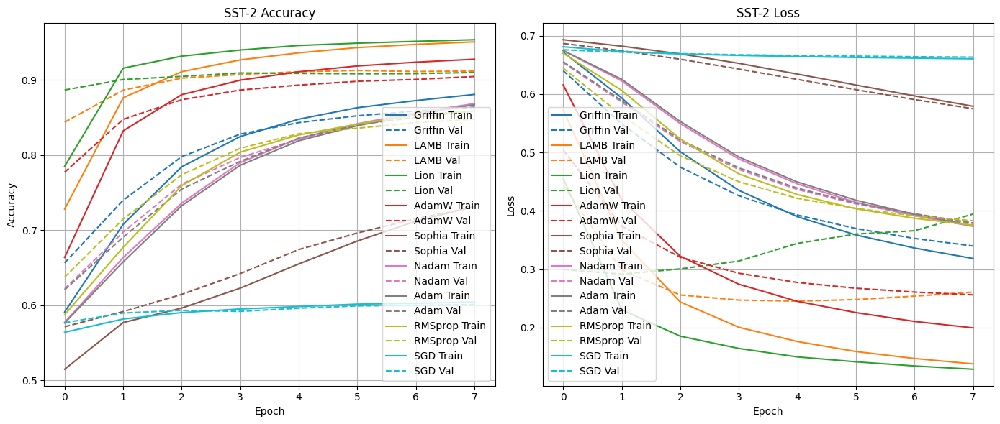

Saved test metrics plot to results/test_metrics_sst2.png


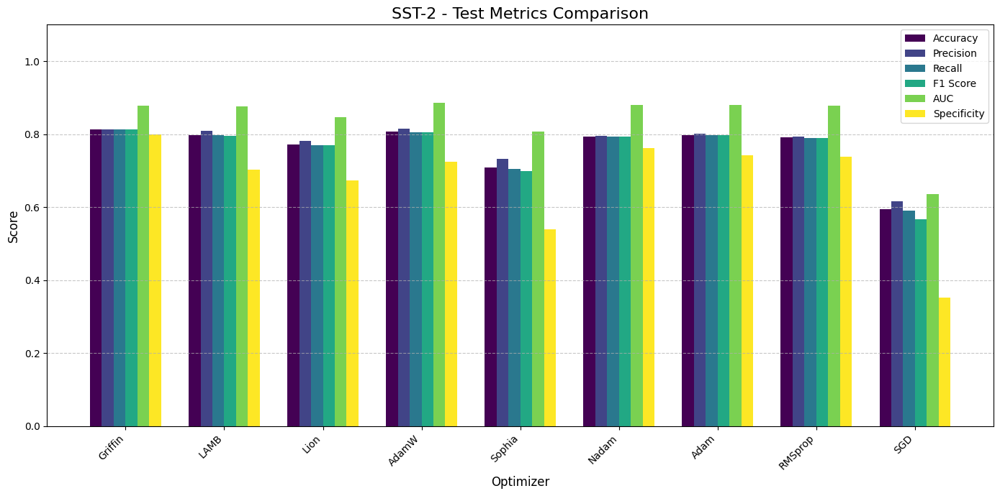


--- Generating Optimizer-Specific Plots ---
Saved ROC curve to results/roc_curve_sst2_Griffin.png


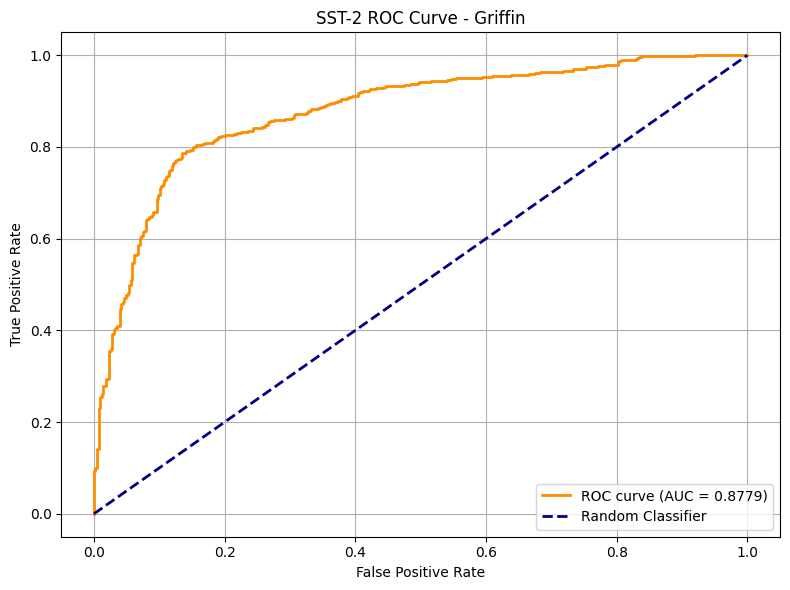

Saved raw confusion matrix to results/cm_raw_sst-2_Griffin.png


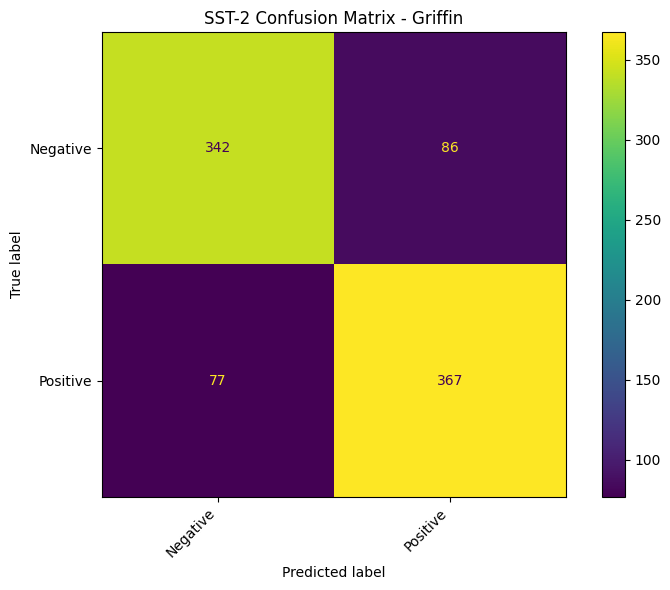

Saved normalized confusion matrix to results/cm_normalized_sst-2_Griffin.png


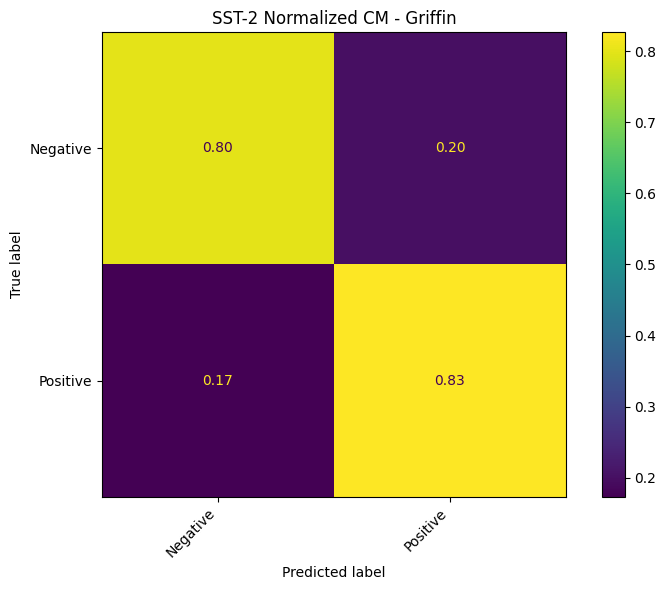

Saved ROC curve to results/roc_curve_sst2_LAMB.png


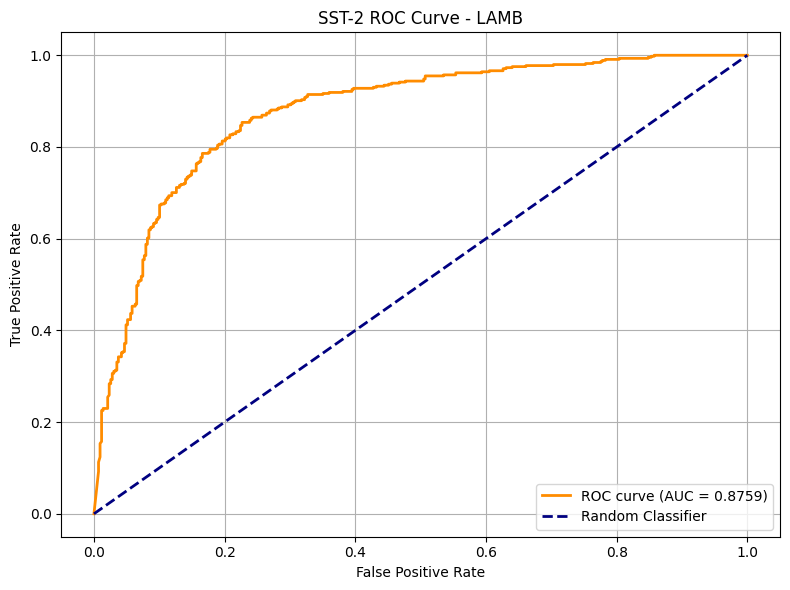

Saved raw confusion matrix to results/cm_raw_sst-2_LAMB.png


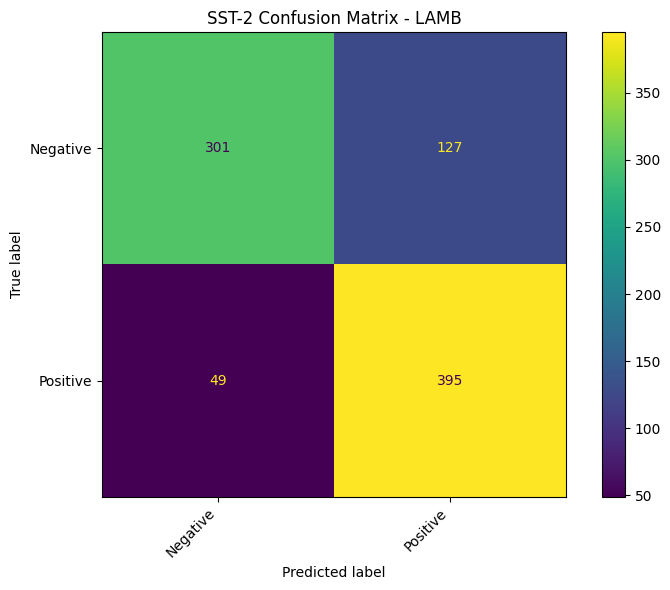

Saved normalized confusion matrix to results/cm_normalized_sst-2_LAMB.png


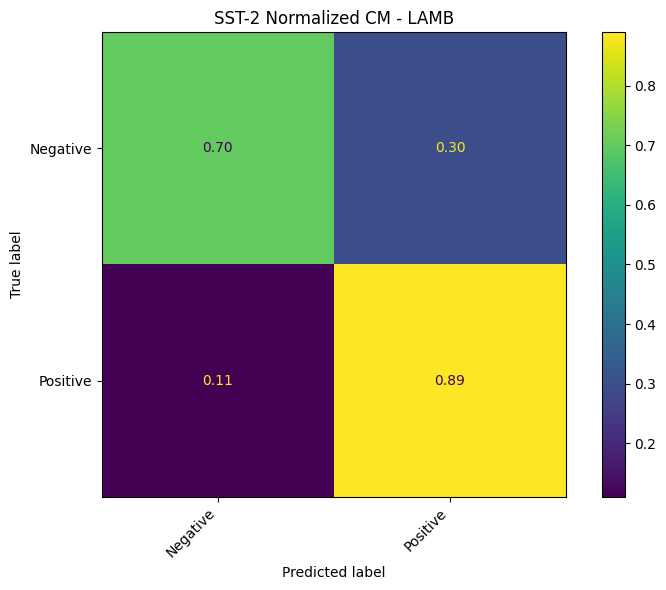

Saved ROC curve to results/roc_curve_sst2_Lion.png


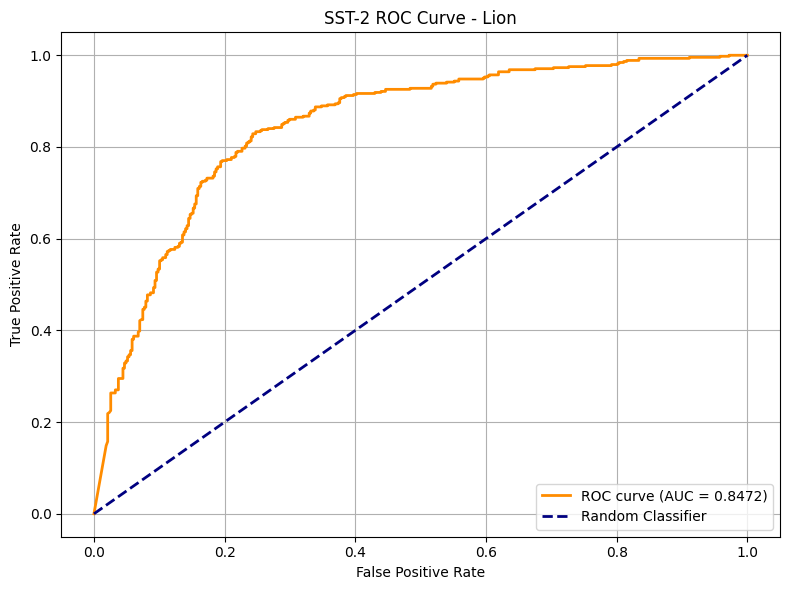

Saved raw confusion matrix to results/cm_raw_sst-2_Lion.png


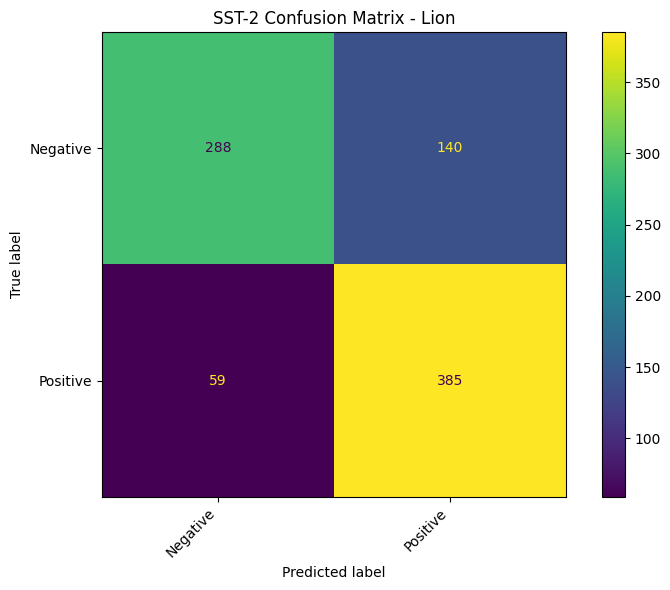

Saved normalized confusion matrix to results/cm_normalized_sst-2_Lion.png


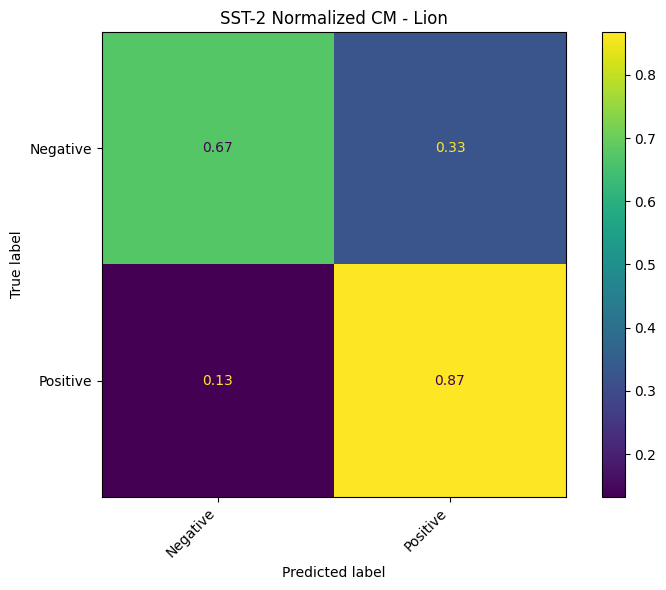

Saved ROC curve to results/roc_curve_sst2_AdamW.png


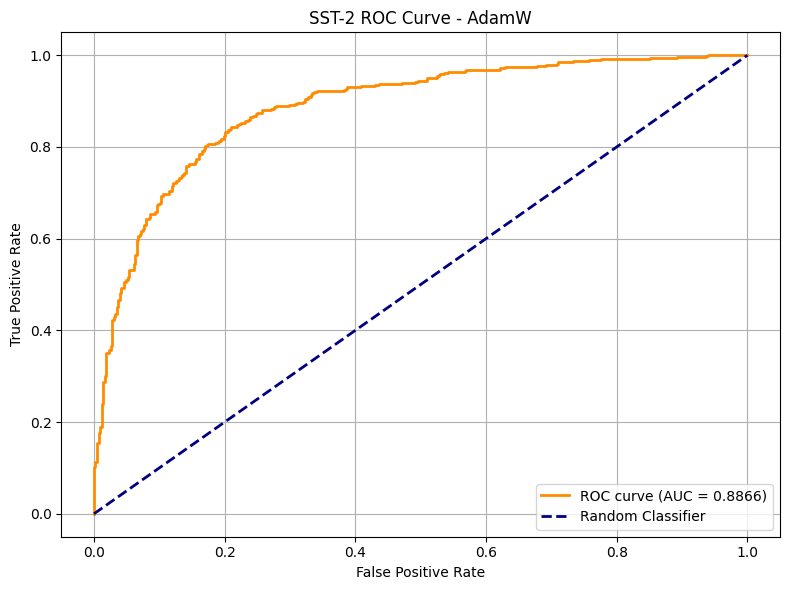

Saved raw confusion matrix to results/cm_raw_sst-2_AdamW.png


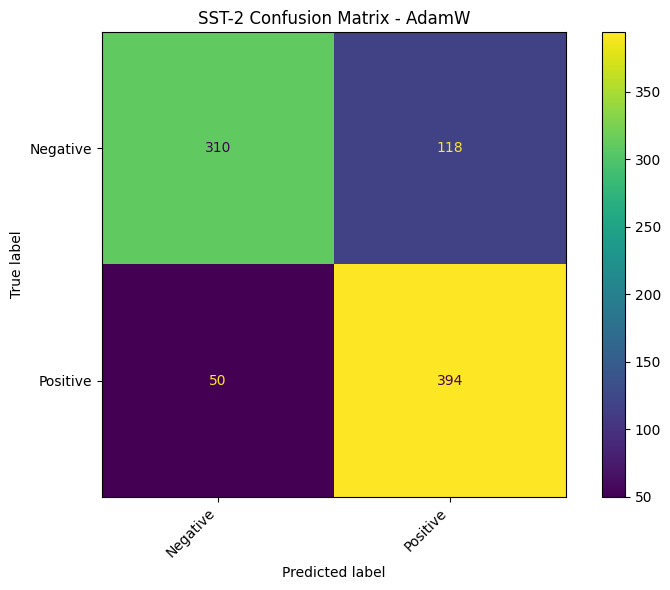

Saved normalized confusion matrix to results/cm_normalized_sst-2_AdamW.png


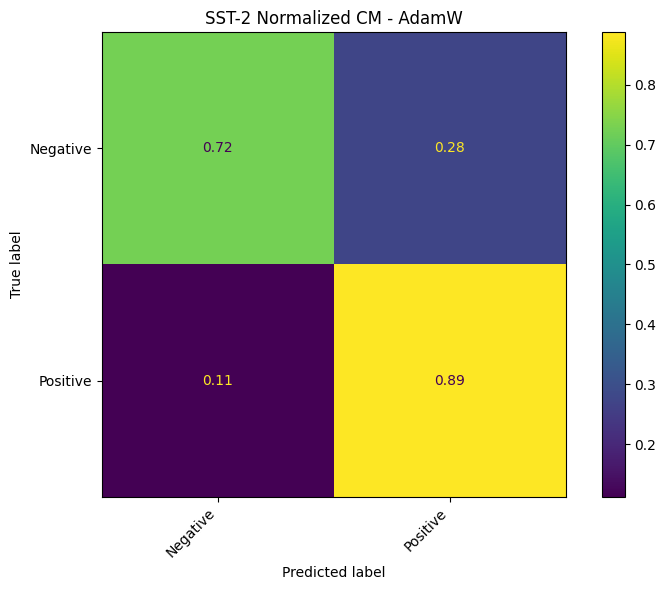

Saved ROC curve to results/roc_curve_sst2_Sophia.png


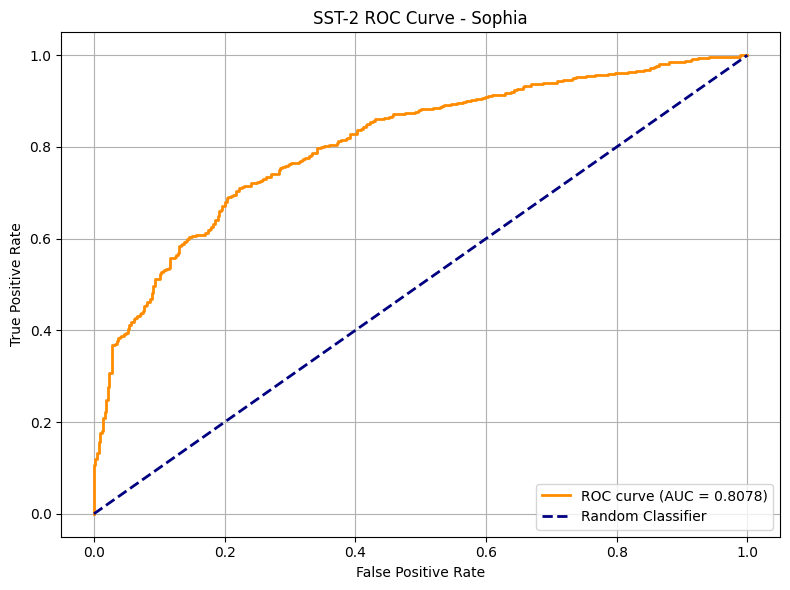

Saved raw confusion matrix to results/cm_raw_sst-2_Sophia.png


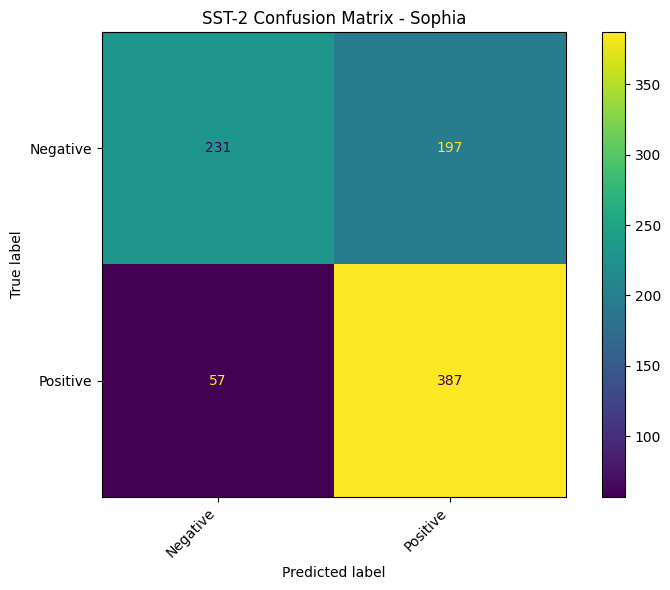

Saved normalized confusion matrix to results/cm_normalized_sst-2_Sophia.png


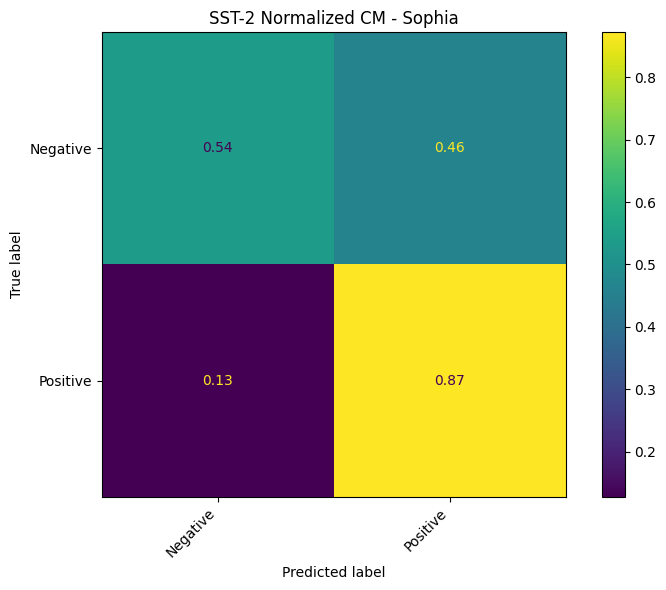

Saved ROC curve to results/roc_curve_sst2_Nadam.png


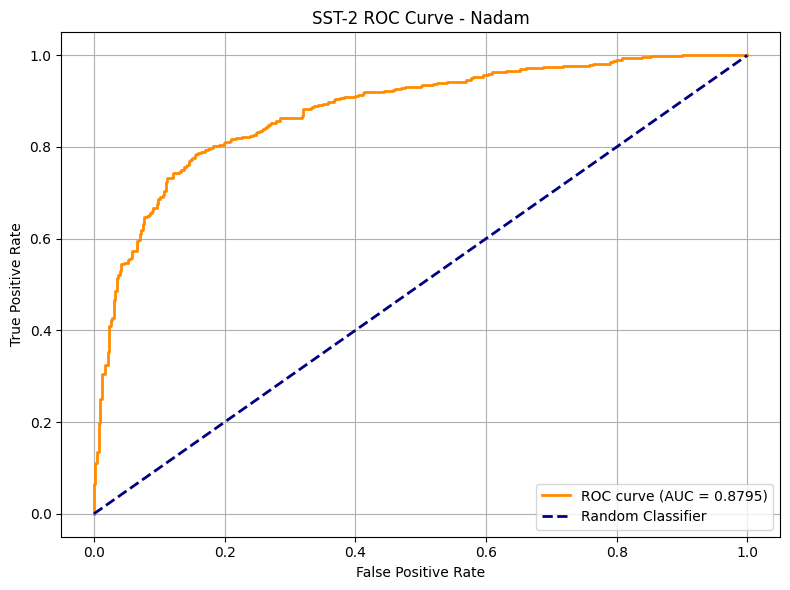

Saved raw confusion matrix to results/cm_raw_sst-2_Nadam.png


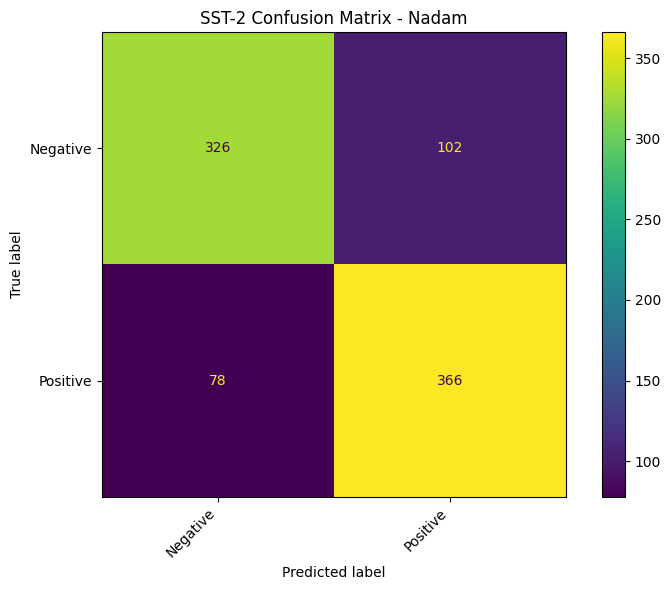

Saved normalized confusion matrix to results/cm_normalized_sst-2_Nadam.png


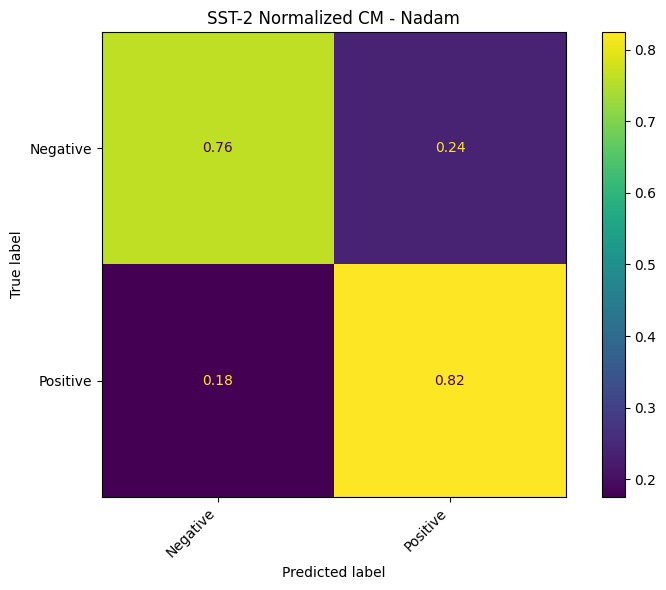

Saved ROC curve to results/roc_curve_sst2_Adam.png


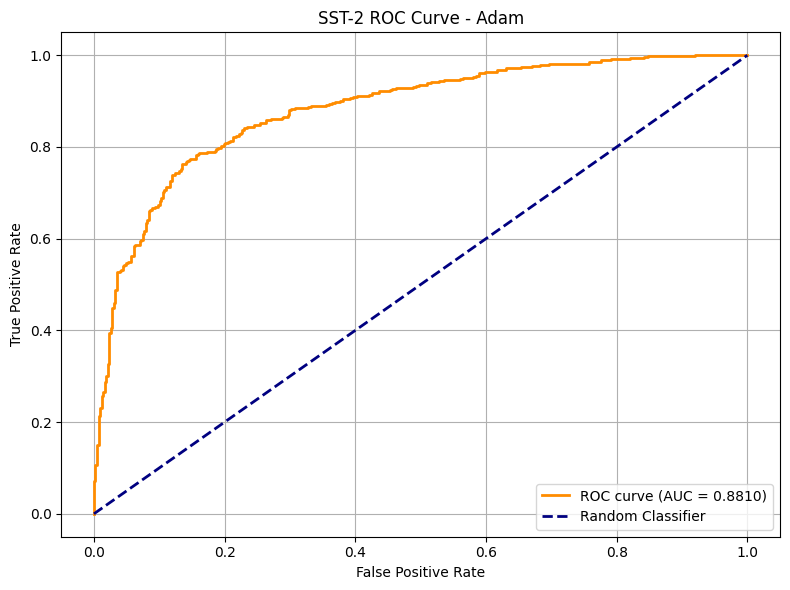

Saved raw confusion matrix to results/cm_raw_sst-2_Adam.png


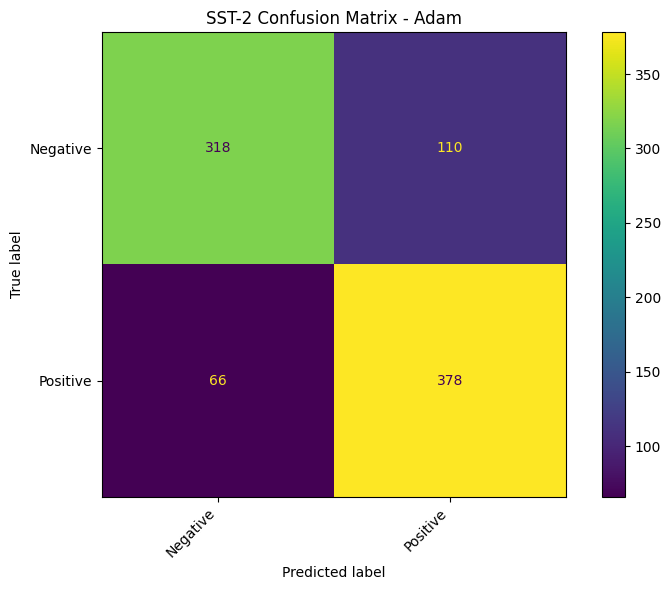

Saved normalized confusion matrix to results/cm_normalized_sst-2_Adam.png


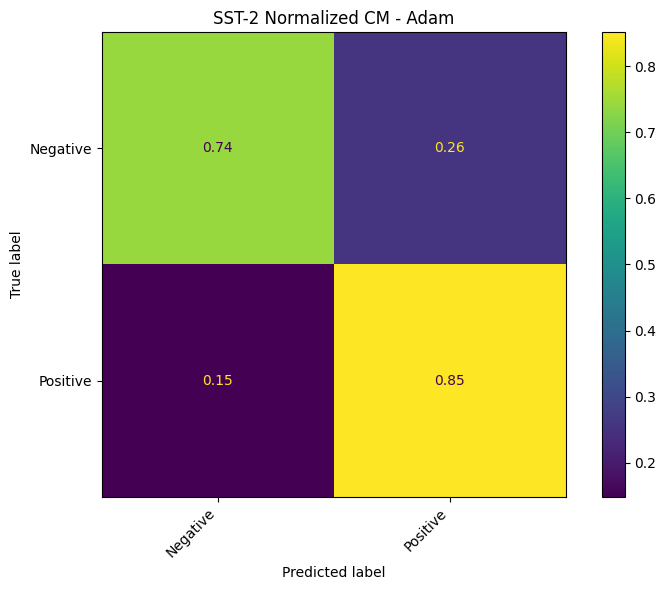

Saved ROC curve to results/roc_curve_sst2_RMSprop.png


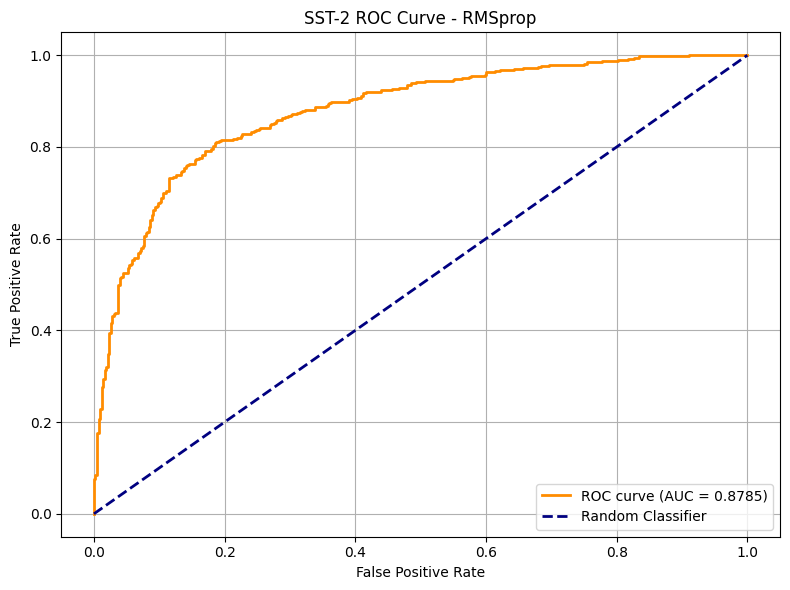

Saved raw confusion matrix to results/cm_raw_sst-2_RMSprop.png


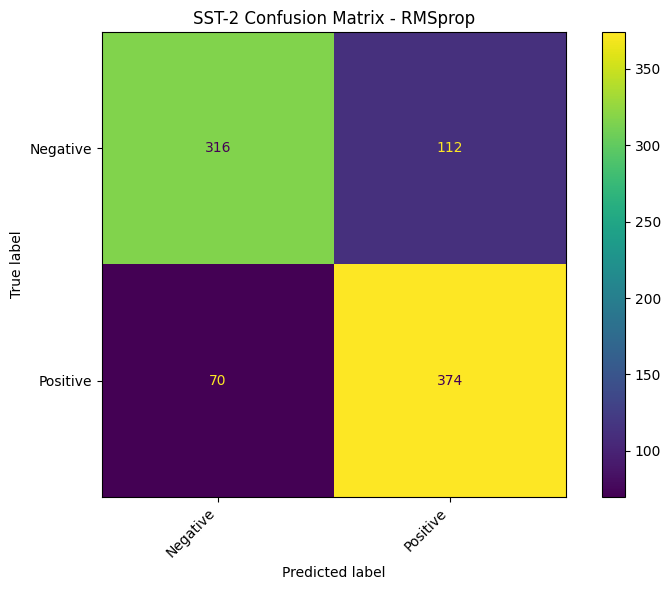

Saved normalized confusion matrix to results/cm_normalized_sst-2_RMSprop.png


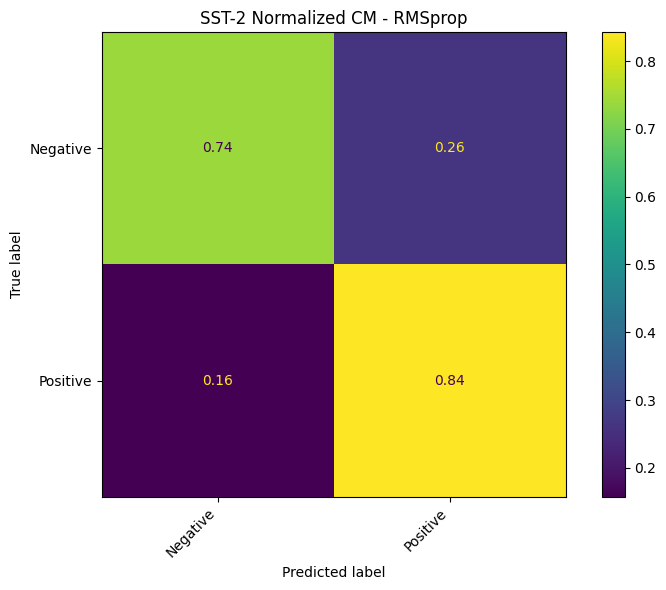

Saved ROC curve to results/roc_curve_sst2_SGD.png


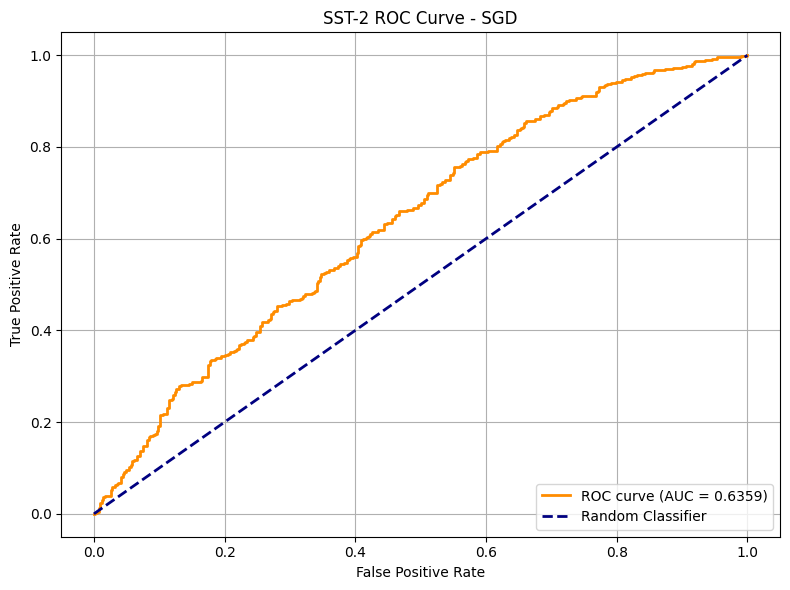

Saved raw confusion matrix to results/cm_raw_sst-2_SGD.png


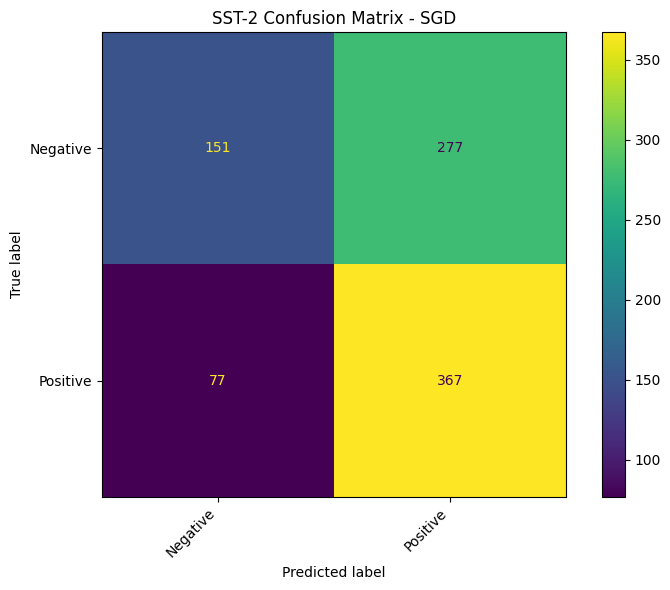

Saved normalized confusion matrix to results/cm_normalized_sst-2_SGD.png


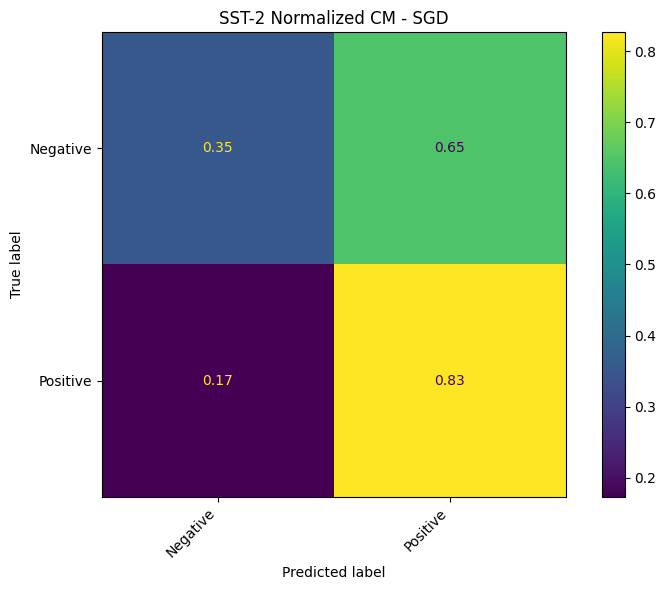

Saved raw results to results/benchmark_results_sst2.json
Saved LaTeX table to results/results_table_sst2.tex

=== LaTeX Table for SST-2 ===

\begin{table}[H]
\centering
\begin{tabular}{lcccccccc}\toprule
Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\ \midrule
Griffin & 0.4502 & 0.8131 & 0.8132 & 0.8128 & 0.8129 & 0.8779 & 0.7991 & 13.46 \\
LAMB & 0.9514 & 0.7982 & 0.8084 & 0.7965 & 0.7958 & 0.8759 & 0.7033 & 13.37 \\
Lion & 1.2417 & 0.7718 & 0.7817 & 0.7700 & 0.7689 & 0.8472 & 0.6729 & 12.63 \\
AdamW & 0.5690 & 0.8073 & 0.8153 & 0.8058 & 0.8055 & 0.8866 & 0.7243 & 12.85 \\
Sophia & 0.5910 & 0.7087 & 0.7324 & 0.7057 & 0.6991 & 0.8078 & 0.5397 & 12.64 \\
Nadam & 0.4395 & 0.7936 & 0.7945 & 0.7930 & 0.7931 & 0.8795 & 0.7617 & 12.88 \\
Adam & 0.4404 & 0.7982 & 0.8014 & 0.7972 & 0.7972 & 0.8810 & 0.7430 & 12.68 \\
RMSprop & 0.4440 & 0.7913 & 0.7941 & 0.7903 & 0.7904 & 0.8785 & 0.7383 & 12.71 \\
SGD & 0.6712 & 0.5940 & 0.6161 & 0.5897 & 

In [6]:
import os
import random
import time
from collections import Counter
import nltk
nltk.download('punkt_tab')
from nltk.tokenize import word_tokenize
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, random_split
from torch.nn.utils.rnn import pad_sequence
from torch.utils.tensorboard import SummaryWriter
from datasets import load_dataset
from sklearn.metrics import (
    precision_score, recall_score, f1_score, confusion_matrix,
    ConfusionMatrixDisplay, roc_curve, auc
)
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
from huggingface_hub import notebook_login
from typing import Iterable, Tuple, Optional
import json

# ---------------------------
# Setup & Reproducibility
# ---------------------------
def set_seed(seed: int = 42):
    """Sets the random seed for reproducibility across libraries."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

print("Setting random seed for reproducibility...", flush=True)
set_seed()
# Corrected NLTK download call
nltk.download('punkt', quiet=True)

# Set the number of training epochs
num_epochs = 8

# Create a directory to save results
os.makedirs('results', exist_ok=True)

import torch
from torch.optim.optimizer import Optimizer
import math


# ---------------------------
# Griffin Optimizer
# ---------------------------
class Griffin(Optimizer):
    def __init__(self, params, lr=5e-4, betas=(0.95, 0.99), weight_decay=1e-4,
                 eps=1e-8, beta_sigma=0.9, schedule_decay=5e-3, warmup_steps=100):
        defaults = dict(lr=lr, betas=betas, weight_decay=weight_decay,
                        eps=eps, beta_sigma=beta_sigma,
                        schedule_decay=schedule_decay, warmup_steps=warmup_steps)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure else None
        for group in self.param_groups:
            lr = group['lr']
            wd = group['weight_decay']
            eps = group['eps']
            beta_sigma = group['beta_sigma']
            schedule_decay = group['schedule_decay']
            warmup_steps = group['warmup_steps']
            beta1, beta2 = group['betas']

            for p in group['params']:
                if p.grad is None:
                    continue

                g = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m_schedule'] = 1.0
                    state['m'] = torch.zeros_like(p)  # 1st moment
                    state['v'] = torch.zeros_like(p)  # 2nd moment
                    state['sigma'] = 0.6  # Scalar sigma per parameter
                    state['g_prev'] = torch.zeros_like(p)  # Previous gradient

                state['step'] += 1
                step = state['step']
                m, v, g_prev = state['m'], state['v'], state['g_prev']
                m_schedule = state['m_schedule']
                sigma = state['sigma']

                # ===== Nadam Momentum Schedule (Optimized) =====
                momentum_t = beta1 * (1. - 0.5 * (0.98 ** (step * schedule_decay)))
                momentum_t1 = beta1 * (1. - 0.5 * (0.98 ** ((step + 1) * schedule_decay)))
                m_schedule = m_schedule * momentum_t
                schedule_next = m_schedule * momentum_t1

                # ===== Efficient Weight Decay =====
                if wd != 0:
                    p.mul_(1 - lr * wd)

                # ===== Low-Cost Moment Updates =====
                # Update momentum (m)
                m.mul_(beta1).add_(g, alpha=1 - beta1)

                # Update adaptive term (v)
                v.mul_(beta2).addcmul_(g, g, value=1 - beta2)

                # ===== Ultra-Efficient Sigma Update =====
                grad_change = (g - g_prev).abs().mean().item()
                stability = 1.0 / (1.0 + 10 * grad_change)
                new_sigma = 0.4 + 0.4 * stability

                # Warmup-controlled sigma update
                warmup_factor = min(1.0, step / warmup_steps)
                sigma = sigma * (beta_sigma * warmup_factor) + new_sigma * (1 - beta_sigma * warmup_factor)
                sigma = max(0.4, min(0.8, sigma))
                state['sigma'] = sigma

                # Store current gradient for next step
                g_prev.copy_(g)

                # ===== Fast Parameter Update =====
                # Bias correction with momentum combination
                bias_corr1 = 1 - beta1 ** step
                bias_corr2 = 1 - beta2 ** step

                m_hat = (beta1 * m) / (1 - beta1**(step+1)) + ((1 - beta1) * g) / (1 - beta1**step)
                v_hat = v / bias_corr2
                denom = v_hat.sqrt().add_(eps)

                # Learning rate with warmup and sigma scaling
                lr_scale = min(1.0, step / warmup_steps)
                step_size = lr * lr_scale * (1. - momentum_t) / (1. - m_schedule) * sigma

                p.addcdiv_(m_hat, denom, value=-step_size)

                # Update momentum schedule
                state['m_schedule'] = schedule_next

        return loss



class Sophia(Optimizer):
    """Implements Sophia algorithm."""
    def __init__(self, params, lr=1e-3, beta1=0.965, beta2=0.99, rho=0.04, weight_decay=1e-3, eps=1e-8):
        defaults = dict(lr=lr, beta1=beta1, beta2=beta2, rho=rho, weight_decay=weight_decay, eps=eps)
        super(Sophia, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure is not None else None
        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p)
                    state['hess_ema'] = torch.ones_like(p)
                m, hess_ema = state['m'], state['hess_ema']
                beta1, beta2, rho, lr, wd, eps = group['beta1'], group['beta2'], group['rho'], group['lr'], group['weight_decay'], group['eps']
                m.mul_(beta1).add_(grad, alpha=1 - beta1)
                hess_ema.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                denom = hess_ema.add(eps)
                scaled_grad = torch.clamp(m / denom, -rho, rho)
                if wd != 0: p.data.mul_(1 - lr * wd)
                p.add_(scaled_grad, alpha=-lr)
                state['step'] += 1
        return loss

class Lion(Optimizer):
    """Implements Lion algorithm."""
    def __init__(self, params, lr=1e-4, betas=(0.9, 0.99), weight_decay=0.0):
        if lr <= 0.0: raise ValueError(f"Invalid learning rate: {lr}")
        if not 0.0 <= betas[0] < 1.0: raise ValueError(f"Invalid beta1: {betas[0]}")
        if not 0.0 <= betas[1] < 1.0: raise ValueError(f"Invalid beta2: {betas[1]}")
        if weight_decay < 0.0: raise ValueError(f"Invalid weight_decay: {weight_decay}")
        defaults = dict(lr=lr, betas=betas, weight_decay=weight_decay)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                if group["weight_decay"] != 0:
                    p.mul_(1 - group["lr"] * group["weight_decay"])
                state = self.state[p]
                if len(state) == 0:
                    state["exp_avg"] = torch.zeros_like(p)
                exp_avg = state["exp_avg"]
                update = exp_avg.mul(group["betas"][0]).add(grad, alpha=1 - group["betas"][0])
                p.add_(update.sign(), alpha=-group["lr"])
                exp_avg.mul_(group["betas"][1]).add_(grad, alpha=1 - group["betas"][1])
        return loss

class LAMB(Optimizer):
    """Implements LAMB optimizer."""
    def __init__(
        self, params: Iterable[torch.nn.Parameter], lr: float = 1e-3,
        betas: Tuple[float, float] = (0.9, 0.999), eps: float = 1e-6,
        weight_decay: float = 0.0, clamp_trust_ratio: Optional[Tuple[float, float]] = (0.0, 10.0)
    ):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay, clamp_trust_ratio=clamp_trust_ratio)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state["step"] = 0
                    state["exp_avg"] = torch.zeros_like(p)
                    state["exp_avg_sq"] = torch.zeros_like(p)
                exp_avg, exp_avg_sq = state["exp_avg"], state["exp_avg_sq"]
                state["step"] += 1
                beta1, beta2 = group["betas"]
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                bias_c1 = 1 - beta1 ** state["step"]
                bias_c2 = 1 - beta2 ** state["step"]
                m_hat = exp_avg / bias_c1
                v_hat = exp_avg_sq / bias_c2
                denom = v_hat.sqrt().add_(group["eps"])
                update = m_hat / denom
                if group["weight_decay"] != 0:
                    update.add_(p, alpha=group["weight_decay"])
                w_norm = p.norm(p=2)
                u_norm = update.norm(p=2)
                trust_ratio = (w_norm / u_norm).item() if w_norm > 0 and u_norm > 0 else 1.0
                if group["clamp_trust_ratio"] is not None:
                    lo, hi = group["clamp_trust_ratio"]
                    trust_ratio = max(lo, min(trust_ratio, hi))
                p.add_(update, alpha=-group["lr"] * trust_ratio)
        return loss
# ---------------------------
# Text Classification Model
# ---------------------------
class TextClassificationModel(nn.Module):
    """A simple text classification model with an embedding layer."""
    def __init__(self, vocab_size, embed_dim=64, num_class=2, pad_idx=1):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embed_dim, padding_idx=pad_idx)
        self.classifier = nn.Linear(embed_dim, num_class)

    def forward(self, text):
        emb = self.embedding(text)
        pooled = emb.mean(dim=1)
        return self.classifier(pooled)

# ---------------------------
# Data Preparation: SST-2
# ---------------------------
print("Loading SST-2 dataset...", flush=True)
dataset = load_dataset("sst2")
print("Dataset loaded. Splitting data...", flush=True)
train_raw, val_raw = random_split(dataset['train'], [int(0.9*len(dataset['train'])), len(dataset['train'])-int(0.9*len(dataset['train']))])
test_raw = dataset['validation']

print("Building vocabulary...", flush=True)
counter = Counter()
for item in train_raw:
    counter.update(word_tokenize(item['sentence'].lower()))
vocab = {'<unk>': 0, '<pad>': 1, **{tok: i for i, tok in enumerate(counter, 2)}}
pad_idx, unk_idx = vocab['<pad>'], vocab['<unk>']
print(f"Vocabulary built. Size: {len(vocab)}", flush=True)

def text_pipeline(text):
    return [vocab.get(tok, unk_idx) for tok in word_tokenize(text.lower())]

class SST2Dataset(Dataset):
    def __init__(self, subset): self.subset = subset
    def __len__(self): return len(self.subset)
    def __getitem__(self, idx): return self.subset[idx]['sentence'], self.subset[idx]['label']

def collate_batch(batch):
    texts, labels = zip(*batch)
    seqs = [torch.tensor(text_pipeline(t), dtype=torch.long) for t in texts]
    return pad_sequence(seqs, batch_first=True, padding_value=pad_idx), torch.tensor(labels, dtype=torch.long)

print("Creating data loaders...", flush=True)
train_loader_sst2 = DataLoader(SST2Dataset(train_raw), batch_size=64, shuffle=True, collate_fn=collate_batch)
val_loader_sst2 = DataLoader(SST2Dataset(val_raw), batch_size=64, shuffle=False, collate_fn=collate_batch)
test_loader_sst2 = DataLoader(SST2Dataset(test_raw), batch_size=64, shuffle=False, collate_fn=collate_batch)
sst2_class_names = ['Negative', 'Positive']
print("Data preparation complete.", flush=True)

# ---------------------------
# Generic Train & Evaluate Function
# ---------------------------
def train_model(model_fn, optimizer_factory, train_loader, val_loader, test_loader, num_epochs=num_epochs, dataset_name="Dataset"):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}", flush=True)
    model = model_fn().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optimizer_factory(model.parameters())
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.9)
    writer = SummaryWriter(log_dir=f"runs/{dataset_name}_{optimizer.__class__.__name__}_{int(time.time())}")
    history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}
    start_time = time.time()

    for epoch in range(num_epochs):
        model.train()
        train_loss, correct, total = 0.0, 0, 0
        for data, targets in train_loader:
            data, targets = data.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(data)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            total += targets.size(0)
            correct += preds.eq(targets).sum().item()
        train_loss /= total
        train_acc = correct / total
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)

        model.eval()
        val_loss, val_correct, val_total = 0.0, 0, 0
        with torch.no_grad():
            for data, targets in val_loader:
                data, targets = data.to(device), targets.to(device)
                outputs = model(data)
                loss = criterion(outputs, targets)
                val_loss += loss.item() * data.size(0)
                _, preds = outputs.max(1)
                val_total += targets.size(0)
                val_correct += preds.eq(targets).sum().item()
        val_loss /= val_total
        val_acc = val_correct / val_total
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        print(f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Acc: {train_acc:.4f} | Val Loss: {val_loss:.4f}, Acc: {val_acc:.4f}", flush=True)
        scheduler.step()

    model.eval()
    test_loss, test_correct, test_total = 0.0, 0, 0
    all_preds, all_targets, all_probs = [], [], []
    with torch.no_grad():
        for data, targets in test_loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            loss = criterion(outputs, targets)
            test_loss += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            probs = torch.softmax(outputs, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
            test_correct += preds.eq(targets).sum().item()
            test_total += targets.size(0)

    # --- METRIC CALCULATIONS ---
    test_loss /= test_total
    test_acc = test_correct / test_total
    precision = precision_score(all_targets, all_preds, average='macro', zero_division=0)
    recall = recall_score(all_targets, all_preds, average='macro', zero_division=0)
    f1 = f1_score(all_targets, all_preds, average='macro', zero_division=0)

    # Calculate Confusion Matrix for Specificity
    cm = confusion_matrix(all_targets, all_preds)
    tn, fp, fn, tp = cm.ravel() if len(cm.ravel()) == 4 else (cm[0,0], 0, 0, 0) # Handle edge cases
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0.0

    # Calculate AUC
    y_score = np.array(all_probs)[:, 1] # Probability of the positive class
    fpr, tpr, _ = roc_curve(all_targets, y_score)
    roc_auc = auc(fpr, tpr)

    history.update({
        'test_loss': test_loss, 'test_acc': test_acc, 'precision': precision,
        'recall': recall, 'f1': f1, 'specificity': specificity, 'auc': roc_auc,
        'runtime': time.time() - start_time,
        'targets': all_targets, 'preds': all_preds, 'probs': all_probs
    })
    print(f"\nFinal Results on {dataset_name}: Test Loss: {test_loss:.4f}, Acc: {test_acc:.4f}, F1: {f1:.4f}, AUC: {roc_auc:.4f}\n", flush=True)
    writer.close()
    return history

# ---------------------------
# Optimizers Setup
# ---------------------------
optimizers = {
    'Griffin': lambda params:  Griffin(params, lr=1e-3, betas=(0.9, 0.999),
            weight_decay=1e-3, eps=1e-8, beta_sigma=0.99, schedule_decay=1e-3, warmup_steps=100),
    'LAMB': lambda params: LAMB(params, lr=1e-3, weight_decay=1e-4),
    'Lion': lambda params: Lion(params, lr=1e-3, weight_decay=1e-4),
    'AdamW': lambda params: optim.AdamW(params, lr=1e-3, weight_decay=1e-4),
    'Sophia': lambda params: Sophia(params, lr=1e-3, weight_decay=1e-4),
    'Nadam': lambda params: optim.NAdam(params, lr=1e-3, weight_decay=1e-4),
    'Adam': lambda params: optim.Adam(params, lr=1e-3, weight_decay=1e-4),
    'RMSprop': lambda params: optim.RMSprop(params, lr=1e-3, weight_decay=1e-4),
    'SGD': lambda params: optim.SGD(params, lr=0.01, momentum=0.9, weight_decay=1e-4),
}


# ---------------------------
# Run Experiments for SST-2
# ---------------------------
results_sst2 = {}
for opt_name, opt_factory in optimizers.items():
    print(f'\n--- SST-2: Training with {opt_name} ---', flush=True)
    results_sst2[opt_name] = train_model(
        lambda: TextClassificationModel(len(vocab), 64, 2, pad_idx),
        opt_factory, train_loader_sst2, val_loader_sst2, test_loader_sst2,
        num_epochs=num_epochs, dataset_name="SST-2"
    )

# ---------------------------
# Plotting Functions
# ---------------------------
def plot_learning_curves(results, dataset_name, save_path=None):
    """Plots and saves training and validation accuracy and loss curves."""
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    colors = plt.cm.tab10(np.linspace(0, 1, len(results)))
    for idx, opt in enumerate(results):
        axes[0].plot(results[opt]['train_acc'], color=colors[idx], linestyle='-', label=f'{opt} Train')
        axes[0].plot(results[opt]['val_acc'], color=colors[idx], linestyle='--', label=f'{opt} Val')
    axes[0].set_title(f'{dataset_name} Accuracy'); axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Accuracy'); axes[0].legend(); axes[0].grid(True)
    for idx, opt in enumerate(results):
        axes[1].plot(results[opt]['train_loss'], color=colors[idx], linestyle='-', label=f'{opt} Train')
        axes[1].plot(results[opt]['val_loss'], color=colors[idx], linestyle='--', label=f'{opt} Val')
    axes[1].set_title(f'{dataset_name} Loss'); axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Loss'); axes[1].legend(); axes[1].grid(True)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)
        print(f"Saved learning curves to {save_path}")
    plt.show()

def plot_test_metrics(results, dataset_name, save_path=None):
    """Plots and saves a bar chart comparing final test metrics across optimizers."""
    metrics = ['test_acc', 'precision', 'recall', 'f1', 'auc', 'specificity']
    metric_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
    colors = plt.cm.viridis(np.linspace(0, 1, len(metrics)))
    plt.figure(figsize=(14, 7)); bar_width = 0.12; x = np.arange(len(results))
    for i, metric in enumerate(metrics):
        values = [results[opt][metric] for opt in results]
        plt.bar(x + i * bar_width, values, width=bar_width, color=colors[i], label=metric_names[i])
    plt.title(f'{dataset_name} - Test Metrics Comparison', fontsize=16); plt.xlabel('Optimizer', fontsize=12); plt.ylabel('Score', fontsize=12)
    plt.xticks(x + bar_width * (len(metrics)/2 - 0.5), results.keys(), rotation=45, ha="right"); plt.ylim(0, 1.1); plt.legend(); plt.grid(axis='y', linestyle='--', alpha=0.7); plt.tight_layout()
    if save_path:
        plt.savefig(save_path)
        print(f"Saved test metrics plot to {save_path}")
    plt.show()

def plot_roc_curve_for_optimizer(result, opt_name, dataset_name, save_path=None):
    """Plots and saves the ROC curve for a single optimizer's results."""
    y_true = result['targets']
    y_score = np.array(result['probs'])[:, 1]
    fpr, tpr, _ = roc_curve(y_true, y_score)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Classifier')
    plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate')
    plt.title(f'{dataset_name} ROC Curve - {opt_name}'); plt.legend(loc="lower right"); plt.grid(True)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)
        print(f"Saved ROC curve to {save_path}")
    plt.show()

def plot_confusion_matrices_for_optimizer(result, opt_name, class_names, dataset_name, save_path_dir=None):
    """Calculates, plots, and saves raw and normalized confusion matrices."""
    y_true = result['targets']
    y_pred = result['preds']

    # Raw Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)
    fig, ax = plt.subplots(figsize=(8, 6))
    display = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    display.plot(cmap='viridis', ax=ax, values_format='d')
    title = f'{dataset_name} Confusion Matrix - {opt_name}'
    plt.title(title); plt.xticks(rotation=45, ha='right'); plt.tight_layout()
    if save_path_dir:
        path = os.path.join(save_path_dir, f'cm_raw_{dataset_name.lower()}_{opt_name}.png')
        plt.savefig(path)
        print(f"Saved raw confusion matrix to {path}")
    plt.show()

    # Normalized Confusion Matrix
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    cm_norm = np.nan_to_num(cm_norm) # handle cases with no true samples for a class
    fig_norm, ax_norm = plt.subplots(figsize=(8, 6))
    display_norm = ConfusionMatrixDisplay(confusion_matrix=cm_norm, display_labels=class_names)
    display_norm.plot(cmap='viridis', ax=ax_norm, values_format='.2f')
    title_norm = f'{dataset_name} Normalized CM - {opt_name}'
    plt.title(title_norm); plt.xticks(rotation=45, ha='right'); plt.tight_layout()
    if save_path_dir:
        path_norm = os.path.join(save_path_dir, f'cm_normalized_{dataset_name.lower()}_{opt_name}.png')
        plt.savefig(path_norm)
        print(f"Saved normalized confusion matrix to {path_norm}")
    plt.show()

# ---------------------------
# LaTeX Table Generation
# ---------------------------
def generate_latex_table(results, dataset_name):
    """Generates a LaTeX table with AUC, Specificity, and Avg Epoch Time."""
    header = (
        "\\begin{table}[H]\n\\centering\n"
        "\\begin{tabular}{lcccccccc}\\toprule\n"
        "Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\\\ \\midrule\n"
    )

    footer = (
        "\\bottomrule\n\\end{tabular}\n"
        f"\\caption{{Performance Metrics for {dataset_name}}}\n"
        f"\\label{{tab:{dataset_name.lower().replace(' ', '_')}_perf}}\n"
        "\\end{table}"
    )

    rows = []
    for opt, m in results.items():
        avg_epoch_time = m['runtime'] / num_epochs
        rows.append(
            f"{opt} & {m['test_loss']:.4f} & {m['test_acc']:.4f} & "
            f"{m['precision']:.4f} & {m['recall']:.4f} & {m['f1']:.4f} & "
            f"{m['auc']:.4f} & {m['specificity']:.4f} & {avg_epoch_time:.2f} \\\\"
        )

    return header + "\n".join(rows) + "\n" + footer

# ---------------------------
# Generate and Save Artifacts
# ---------------------------
print("\n--- Generating and Saving Artifacts for SST-2 ---", flush=True)

# --- Save Comparison Plots ---
plot_learning_curves(results_sst2, "SST-2", save_path="results/learning_curves_sst2.png")
plot_test_metrics(results_sst2, "SST-2", save_path="results/test_metrics_sst2.png")

# --- Generate and Save Optimizer-Specific Plots ---
print("\n--- Generating Optimizer-Specific Plots ---", flush=True)
for opt_name, result in results_sst2.items():
    # Plot and save ROC curve for each optimizer
    roc_save_path = os.path.join('results', f'roc_curve_sst2_{opt_name}.png')
    plot_roc_curve_for_optimizer(result, opt_name, "SST-2", save_path=roc_save_path)

    # Plot and save confusion matrices for each optimizer
    plot_confusion_matrices_for_optimizer(result, opt_name, sst2_class_names, "SST-2", save_path_dir='results')


# --- Save Raw Results Dictionary ---
# Custom JSON encoder to handle numpy types
class NumpyEncoder(json.JSONEncoder):
    def default(self, obj):
        if isinstance(obj, np.ndarray):
            return obj.tolist()
        if isinstance(obj, np.integer):
            return int(obj)
        if isinstance(obj, np.floating):
            return float(obj)
        return super(NumpyEncoder, self).default(obj)

results_path = "results/benchmark_results_sst2.json"
with open(results_path, 'w') as f:
    json.dump(results_sst2, f, indent=4, cls=NumpyEncoder)
print(f"Saved raw results to {results_path}")


# --- Save LaTeX Table ---
latex_table = generate_latex_table(results_sst2, "SST-2")
table_path = "results/results_table_sst2.tex"
with open(table_path, 'w') as f:
    f.write(latex_table)
print(f"Saved LaTeX table to {table_path}")

print("\n=== LaTeX Table for SST-2 ===\n")
print(latex_table)

print("\n--- Script Finished ---", flush=True)


In [7]:
from google.colab import files
import os
import zipfile

# Define the directory to zip
results_dir = "/content/results"
# Define the name for the zip file
zip_filename = "/content/results.zip"

# Create a ZipFile object
if os.path.exists(results_dir):
    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Walk through the directory and add files to the zip
        for root, _, files_in_dir in os.walk(results_dir):
            for file in files_in_dir:
                file_path = os.path.join(root, file)
                # Add file to zip, preserving directory structure
                zipf.write(file_path, os.path.relpath(file_path, results_dir))
    print(f"Successfully created {zip_filename}")

    # Download the zip file
    files.download(zip_filename)
else:
    print(f"Error: Directory '{results_dir}' not found.")

Successfully created /content/results.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# 5-IDMB

In [ ]:
# !rm -rf results_imdb


Setting random seed for reproducibility...


[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


Loading IMDB dataset...


README.md: 0.00B [00:00, ?B/s]

plain_text/train-00000-of-00001.parquet:   0%|          | 0.00/21.0M [00:00<?, ?B/s]

plain_text/test-00000-of-00001.parquet:   0%|          | 0.00/20.5M [00:00<?, ?B/s]

plain_text/unsupervised-00000-of-00001.p(…):   0%|          | 0.00/42.0M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/25000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/25000 [00:00<?, ? examples/s]

Generating unsupervised split:   0%|          | 0/50000 [00:00<?, ? examples/s]

Building vocabulary...
Training Griffin on IMDB for 10 epochs on cuda...
Epoch 1/10 | Train Loss: 0.6892, Acc: 0.5526 | Val Loss: 0.6830, Acc: 0.6470 | Time: 1.34s
Epoch 2/10 | Train Loss: 0.6700, Acc: 0.6734 | Val Loss: 0.6570, Acc: 0.6874 | Time: 1.30s
Epoch 3/10 | Train Loss: 0.6356, Acc: 0.7160 | Val Loss: 0.6200, Acc: 0.7230 | Time: 1.29s
Epoch 4/10 | Train Loss: 0.5965, Acc: 0.7546 | Val Loss: 0.5840, Acc: 0.7560 | Time: 1.30s
Epoch 5/10 | Train Loss: 0.5604, Acc: 0.7800 | Val Loss: 0.5543, Acc: 0.7794 | Time: 1.29s
Epoch 6/10 | Train Loss: 0.5328, Acc: 0.7985 | Val Loss: 0.5326, Acc: 0.7938 | Time: 1.40s
Epoch 7/10 | Train Loss: 0.5144, Acc: 0.8103 | Val Loss: 0.5185, Acc: 0.8018 | Time: 1.43s
Epoch 8/10 | Train Loss: 0.5048, Acc: 0.8191 | Val Loss: 0.5104, Acc: 0.8082 | Time: 1.30s
Epoch 9/10 | Train Loss: 0.4969, Acc: 0.8223 | Val Loss: 0.5068, Acc: 0.8098 | Time: 1.30s
Epoch 10/10 | Train Loss: 0.4951, Acc: 0.8243 | Val Loss: 0.5059, Acc: 0.8102 | Time: 1.30s

Final Test Resu

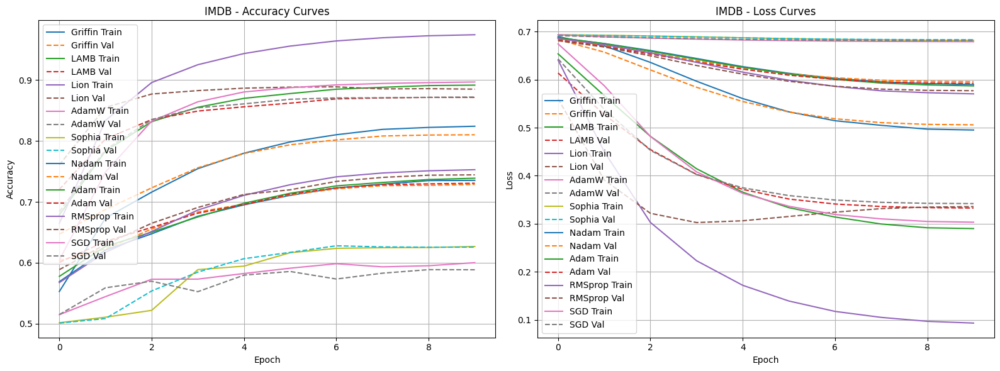

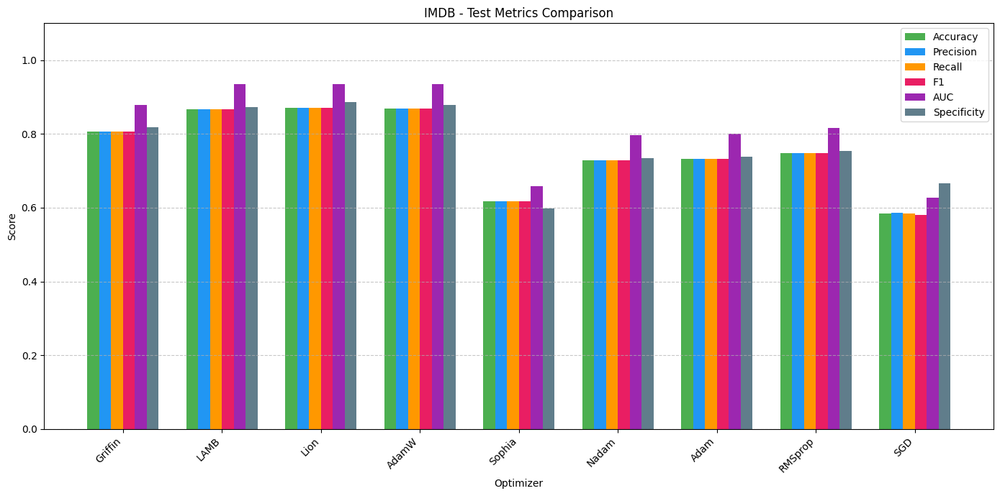

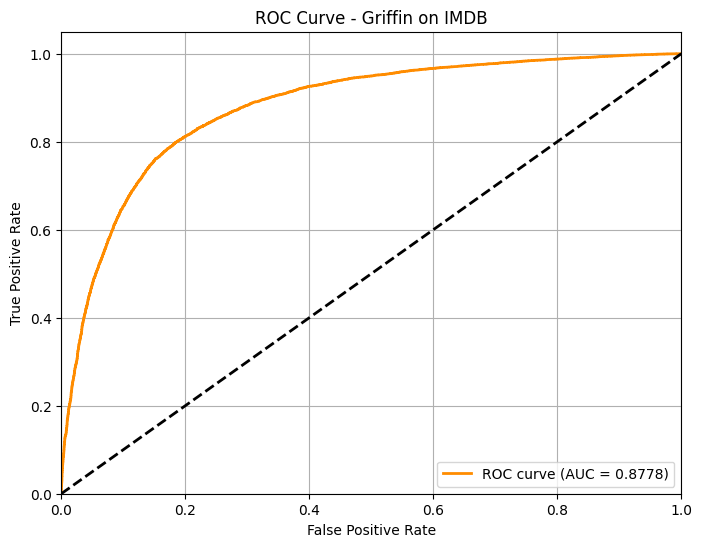

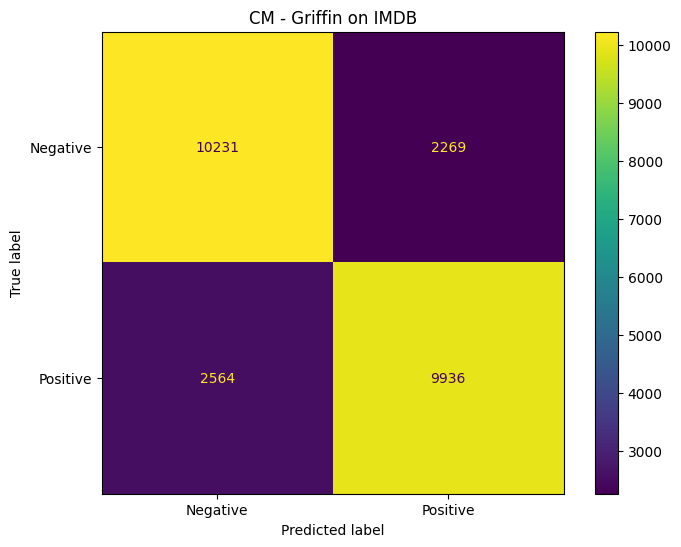

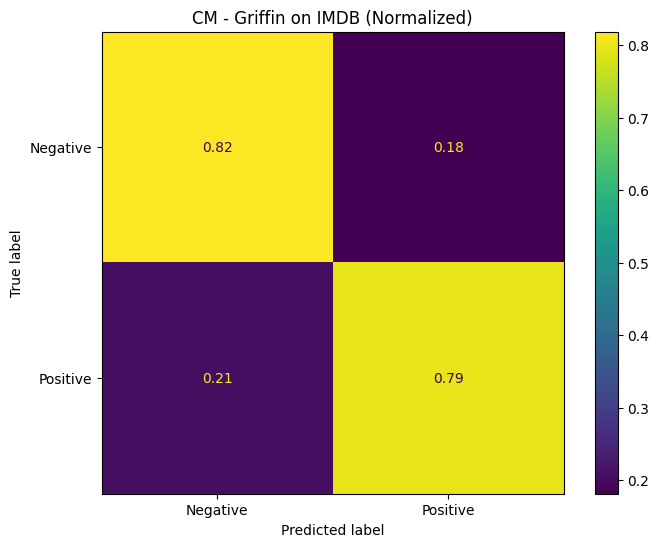

...

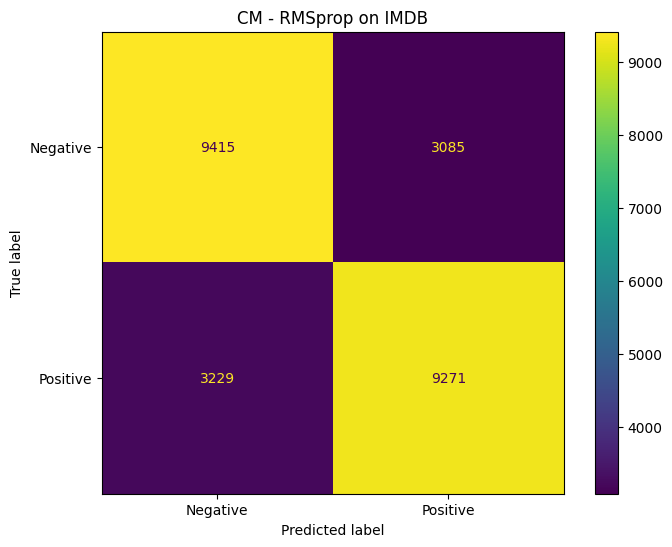

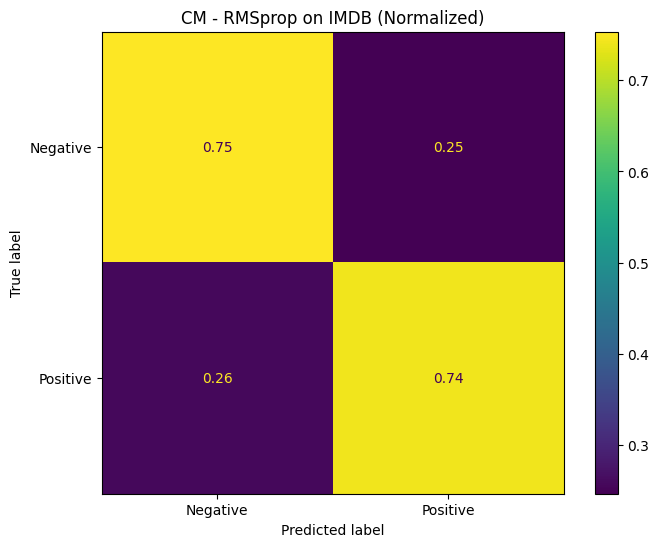

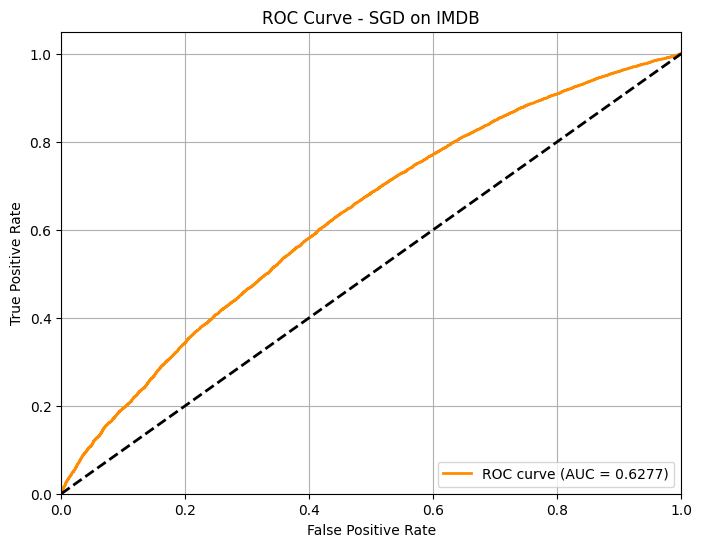

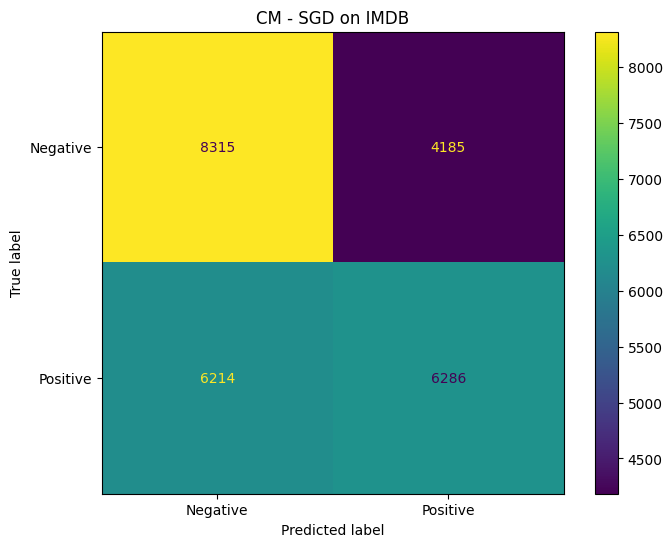

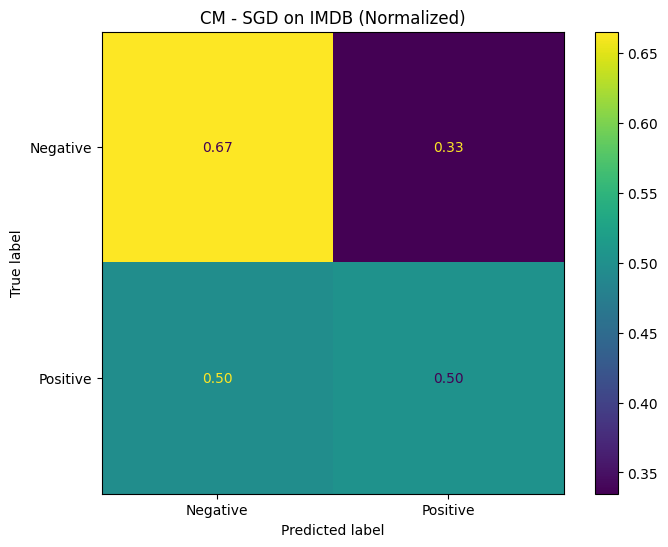


=== LaTeX Table for IMDB ===

\begin{table}[H]
\centering
\begin{tabular}{lcccccccc}\toprule
Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\ \midrule
Griffin & 0.5092 & 0.8067 & 0.8069 & 0.8067 & 0.8067 & 0.8778 & 0.8185 & 1.38 \\
LAMB & 0.3356 & 0.8676 & 0.8677 & 0.8676 & 0.8676 & 0.9344 & 0.8724 & 1.32 \\
Lion & 0.3822 & 0.8711 & 0.8715 & 0.8711 & 0.8710 & 0.9352 & 0.8873 & 1.07 \\
AdamW & 0.3492 & 0.8689 & 0.8690 & 0.8689 & 0.8689 & 0.9342 & 0.8782 & 1.10 \\
Sophia & 0.6826 & 0.6178 & 0.6180 & 0.6178 & 0.6177 & 0.6586 & 0.5980 & 1.13 \\
Nadam & 0.5945 & 0.7292 & 0.7292 & 0.7292 & 0.7292 & 0.7958 & 0.7346 & 1.12 \\
Adam & 0.5919 & 0.7320 & 0.7321 & 0.7320 & 0.7320 & 0.8000 & 0.7389 & 1.10 \\
RMSprop & 0.5759 & 0.7474 & 0.7475 & 0.7474 & 0.7474 & 0.8160 & 0.7532 & 1.07 \\
SGD & 0.6808 & 0.5840 & 0.5863 & 0.5840 & 0.5813 & 0.6277 & 0.6652 & 1.03 \\
\bottomrule
\end{tabular}
\caption{Performance Metrics for IMDB}
\label{tab:imdb_pe

In [8]:
import os
import random
import time
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import Optimizer
from torch.utils.data import DataLoader, random_split, Dataset
from torch.nn.utils.rnn import pad_sequence
from sklearn.metrics import (
    precision_score, recall_score, f1_score, confusion_matrix,
    ConfusionMatrixDisplay, roc_curve, auc, roc_auc_score
)
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
from typing import Iterable, Tuple, Optional
from itertools import cycle
from datasets import load_dataset
from collections import Counter
from nltk.tokenize import word_tokenize
import nltk
nltk.download('punkt_tab')

# ---------------------------
# Setup & Reproducibility
# ---------------------------
def set_seed(seed: int = 42):
    """Sets the random seed for reproducibility across libraries."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

print("Setting random seed for reproducibility...", flush=True)
set_seed()
nltk.download('punkt', quiet=True)


# Global settings
NUM_EPOCHS = 10 # Fewer epochs for this larger dataset
RESULTS_DIR = "results_imdb"
os.makedirs(RESULTS_DIR, exist_ok=True)


# ---------------------------
# Griffin Optimizer
# ---------------------------
class Griffin(Optimizer):
    def __init__(self, params, lr=5e-4, betas=(0.95, 0.99), weight_decay=1e-4,
                 eps=1e-8, beta_sigma=0.9, schedule_decay=5e-3, warmup_steps=100):
        defaults = dict(lr=lr, betas=betas, weight_decay=weight_decay,
                        eps=eps, beta_sigma=beta_sigma,
                        schedule_decay=schedule_decay, warmup_steps=warmup_steps)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure else None
        for group in self.param_groups:
            lr = group['lr']
            wd = group['weight_decay']
            eps = group['eps']
            beta_sigma = group['beta_sigma']
            schedule_decay = group['schedule_decay']
            warmup_steps = group['warmup_steps']
            beta1, beta2 = group['betas']

            for p in group['params']:
                if p.grad is None:
                    continue

                g = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m_schedule'] = 1.0
                    state['m'] = torch.zeros_like(p)  # 1st moment
                    state['v'] = torch.zeros_like(p)  # 2nd moment
                    state['sigma'] = 0.6  # Scalar sigma per parameter
                    state['g_prev'] = torch.zeros_like(p)  # Previous gradient

                state['step'] += 1
                step = state['step']
                m, v, g_prev = state['m'], state['v'], state['g_prev']
                m_schedule = state['m_schedule']
                sigma = state['sigma']

                # ===== Nadam Momentum Schedule (Optimized) =====
                momentum_t = beta1 * (1. - 0.5 * (0.98 ** (step * schedule_decay)))
                momentum_t1 = beta1 * (1. - 0.5 * (0.98 ** ((step + 1) * schedule_decay)))
                m_schedule = m_schedule * momentum_t
                schedule_next = m_schedule * momentum_t1

                # ===== Efficient Weight Decay =====
                if wd != 0:
                    p.mul_(1 - lr * wd)

                # ===== Low-Cost Moment Updates =====
                # Update momentum (m)
                m.mul_(beta1).add_(g, alpha=1 - beta1)

                # Update adaptive term (v)
                v.mul_(beta2).addcmul_(g, g, value=1 - beta2)

                # ===== Ultra-Efficient Sigma Update =====
                grad_change = (g - g_prev).abs().mean().item()
                stability = 1.0 / (1.0 + 10 * grad_change)
                new_sigma = 0.4 + 0.4 * stability

                # Warmup-controlled sigma update
                warmup_factor = min(1.0, step / warmup_steps)
                sigma = sigma * (beta_sigma * warmup_factor) + new_sigma * (1 - beta_sigma * warmup_factor)
                sigma = max(0.4, min(0.8, sigma))
                state['sigma'] = sigma

                # Store current gradient for next step
                g_prev.copy_(g)

                # ===== Fast Parameter Update =====
                # Bias correction with momentum combination
                bias_corr1 = 1 - beta1 ** step
                bias_corr2 = 1 - beta2 ** step

                m_hat = (beta1 * m) / (1 - beta1**(step+1)) + ((1 - beta1) * g) / (1 - beta1**step)
                v_hat = v / bias_corr2
                denom = v_hat.sqrt().add_(eps)

                # Learning rate with warmup and sigma scaling
                lr_scale = min(1.0, step / warmup_steps)
                step_size = lr * lr_scale * (1. - momentum_t) / (1. - m_schedule) * sigma

                p.addcdiv_(m_hat, denom, value=-step_size)

                # Update momentum schedule
                state['m_schedule'] = schedule_next

        return loss





class Sophia(Optimizer):
    """Implements Sophia algorithm."""
    def __init__(self, params, lr=1e-3, beta1=0.965, beta2=0.99, rho=0.04, weight_decay=1e-3, eps=1e-8):
        defaults = dict(lr=lr, beta1=beta1, beta2=beta2, rho=rho, weight_decay=weight_decay, eps=eps)
        super(Sophia, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure is not None else None
        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p)
                    state['hess_ema'] = torch.ones_like(p)
                m, hess_ema = state['m'], state['hess_ema']
                beta1, beta2, rho, lr, wd, eps = group['beta1'], group['beta2'], group['rho'], group['lr'], group['weight_decay'], group['eps']
                m.mul_(beta1).add_(grad, alpha=1 - beta1)
                hess_ema.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                denom = hess_ema.add(eps)
                scaled_grad = torch.clamp(m / denom, -rho, rho)
                if wd != 0: p.data.mul_(1 - lr * wd)
                p.add_(scaled_grad, alpha=-lr)
                state['step'] += 1
        return loss

class Lion(Optimizer):
    """Implements Lion algorithm."""
    def __init__(self, params, lr=1e-4, betas=(0.9, 0.99), weight_decay=0.0):
        if lr <= 0.0: raise ValueError(f"Invalid learning rate: {lr}")
        if not 0.0 <= betas[0] < 1.0: raise ValueError(f"Invalid beta1: {betas[0]}")
        if not 0.0 <= betas[1] < 1.0: raise ValueError(f"Invalid beta2: {betas[1]}")
        if weight_decay < 0.0: raise ValueError(f"Invalid weight_decay: {weight_decay}")
        defaults = dict(lr=lr, betas=betas, weight_decay=weight_decay)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                if group["weight_decay"] != 0:
                    p.mul_(1 - group["lr"] * group["weight_decay"])
                state = self.state[p]
                if len(state) == 0:
                    state["exp_avg"] = torch.zeros_like(p)
                exp_avg = state["exp_avg"]
                update = exp_avg.mul(group["betas"][0]).add(grad, alpha=1 - group["betas"][0])
                p.add_(update.sign(), alpha=-group["lr"])
                exp_avg.mul_(group["betas"][1]).add_(grad, alpha=1 - group["betas"][1])
        return loss

class LAMB(Optimizer):
    """Implements LAMB optimizer."""
    def __init__(
        self, params: Iterable[torch.nn.Parameter], lr: float = 1e-3,
        betas: Tuple[float, float] = (0.9, 0.999), eps: float = 1e-6,
        weight_decay: float = 0.0, clamp_trust_ratio: Optional[Tuple[float, float]] = (0.0, 10.0)
    ):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay, clamp_trust_ratio=clamp_trust_ratio)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state["step"] = 0
                    state["exp_avg"] = torch.zeros_like(p)
                    state["exp_avg_sq"] = torch.zeros_like(p)
                exp_avg, exp_avg_sq = state["exp_avg"], state["exp_avg_sq"]
                state["step"] += 1
                beta1, beta2 = group["betas"]
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                bias_c1 = 1 - beta1 ** state["step"]
                bias_c2 = 1 - beta2 ** state["step"]
                m_hat = exp_avg / bias_c1
                v_hat = exp_avg_sq / bias_c2
                denom = v_hat.sqrt().add_(group["eps"])
                update = m_hat / denom
                if group["weight_decay"] != 0:
                    update.add_(p, alpha=group["weight_decay"])
                w_norm = p.norm(p=2)
                u_norm = update.norm(p=2)
                trust_ratio = (w_norm / u_norm).item() if w_norm > 0 and u_norm > 0 else 1.0
                if group["clamp_trust_ratio"] is not None:
                    lo, hi = group["clamp_trust_ratio"]
                    trust_ratio = max(lo, min(trust_ratio, hi))
                p.add_(update, alpha=-group["lr"] * trust_ratio)
        return loss

# ---------------------------
# Model and Data for IMDB
# ---------------------------
class TextClassificationModel(nn.Module):
    """A simple text classification model with an embedding layer."""
    def __init__(self, vocab_size, embed_dim=128, num_class=2):
        super(TextClassificationModel, self).__init__()
        self.embedding = nn.Embedding(vocab_size, embed_dim, padding_idx=1)
        self.fc = nn.Linear(embed_dim, num_class)

    def forward(self, text):
        embedded = self.embedding(text)
        # Use mean pooling over the sequence dimension
        pooled = embedded.mean(1)
        return self.fc(pooled)

class IMDBDataset(Dataset):
    def __init__(self, texts, labels):
        self.texts = texts
        self.labels = labels

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        return self.texts[idx], self.labels[idx]

def get_imdb_loaders(batch_size=64):
    """Loads and preprocesses the IMDB data, returning DataLoaders."""
    print("Loading IMDB dataset...")
    dataset = load_dataset("imdb")

    print("Building vocabulary...")
    # Build vocab from the full training set
    counter = Counter()
    for item in dataset['train']:
        counter.update(word_tokenize(item['text'].lower()))

    vocab = {'<unk>': 0, '<pad>': 1}
    for i, (word, _) in enumerate(counter.most_common(10000 - 2), 2):
        vocab[word] = i

    def text_pipeline(text):
        return [vocab.get(token, vocab['<unk>']) for token in word_tokenize(text.lower())]

    def process_data(split):
        texts = [torch.tensor(text_pipeline(item['text']), dtype=torch.long) for item in split]
        labels = [item['label'] for item in split]
        return texts, labels

    train_texts, train_labels = process_data(dataset['train'])
    test_texts, test_labels = process_data(dataset['test'])

    # Create a validation set from the training set
    train_size = int(0.8 * len(train_labels))
    val_size = len(train_labels) - train_size
    train_indices, val_indices = random_split(range(len(train_labels)), [train_size, val_size])

    val_texts = [train_texts[i] for i in val_indices]
    val_labels = [train_labels[i] for i in val_indices]
    train_texts = [train_texts[i] for i in train_indices]
    train_labels = [train_labels[i] for i in train_indices]

    train_dataset = IMDBDataset(train_texts, train_labels)
    val_dataset = IMDBDataset(val_texts, val_labels)
    test_dataset = IMDBDataset(test_texts, test_labels)

    def collate_batch(batch):
        label_list, text_list = [], []
        for (_text, _label) in batch:
            label_list.append(_label)
            text_list.append(_text)
        return pad_sequence(text_list, batch_first=True, padding_value=1), torch.tensor(label_list, dtype=torch.long)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_batch)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_batch)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_batch)

    return train_loader, val_loader, test_loader, len(vocab)


# ---------------------------
# Training and Evaluation
# ---------------------------
def train_model(model_fn, optimizer_factory, train_loader, val_loader, test_loader,
                num_epochs=15, dataset_name="IMDB", run_name="default"):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model_fn().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optimizer_factory(model.parameters())
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    history = { 'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': [] }
    start_time = time.time()

    print(f"Training {run_name} on {dataset_name} for {num_epochs} epochs on {device}...")

    for epoch in range(num_epochs):
        epoch_start = time.time()
        model.train()
        train_loss, train_correct, train_total = 0.0, 0, 0
        for data, targets in train_loader:
            data, targets = data.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(data)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            train_total += targets.size(0)
            train_correct += preds.eq(targets).sum().item()

        history['train_loss'].append(train_loss / train_total)
        history['train_acc'].append(train_correct / train_total)

        model.eval()
        val_loss, val_correct, val_total = 0.0, 0, 0
        with torch.no_grad():
            for data, targets in val_loader:
                data, targets = data.to(device), targets.to(device)
                outputs = model(data)
                loss = criterion(outputs, targets)
                val_loss += loss.item() * data.size(0)
                _, preds = outputs.max(1)
                val_total += targets.size(0)
                val_correct += preds.eq(targets).sum().item()

        history['val_loss'].append(val_loss / val_total)
        history['val_acc'].append(val_correct / val_total)

        print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {history['train_loss'][-1]:.4f}, Acc: {history['train_acc'][-1]:.4f} | "
              f"Val Loss: {history['val_loss'][-1]:.4f}, Acc: {history['val_acc'][-1]:.4f} | Time: {time.time() - epoch_start:.2f}s")
        scheduler.step()

    # --- Test Phase ---
    model.eval()
    all_preds, all_targets, all_probs = [], [], []
    test_loss_sum = 0.0
    with torch.no_grad():
        for data, targets in test_loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            loss = criterion(outputs, targets)
            test_loss_sum += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            all_preds.extend(preds.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
            all_probs.extend(torch.softmax(outputs, dim=1).cpu().numpy())

    # --- Final Metrics Calculation ---
    final_metrics = {}
    all_preds = np.array(all_preds)
    all_targets = np.array(all_targets)
    all_probs = np.array(all_probs)

    final_metrics['test_loss'] = test_loss_sum / len(all_targets)
    final_metrics['test_acc'] = (all_preds == all_targets).mean()
    final_metrics['test_precision'] = precision_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_recall'] = recall_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_f1'] = f1_score(all_targets, all_preds, average='macro', zero_division=0)

    final_metrics['test_auc'] = roc_auc_score(all_targets, all_probs[:, 1])

    cm = confusion_matrix(all_targets, all_preds)
    tn, fp, fn, tp = cm.ravel()
    final_metrics['test_specificity'] = tn / (tn + fp + 1e-8)

    final_metrics['runtime'] = time.time() - start_time
    final_metrics['avg_epoch_time'] = final_metrics['runtime'] / num_epochs
    final_metrics['targets'] = all_targets
    final_metrics['preds'] = all_preds
    final_metrics['probs'] = all_probs

    print(f"\nFinal Test Results for {run_name}: Acc: {final_metrics['test_acc']:.4f}, F1: {final_metrics['test_f1']:.4f}, AUC: {final_metrics['test_auc']:.4f}\n")

    return {**history, **final_metrics}

# ---------------------------
# Optimizers Setup
# ---------------------------
optimizers = {
    'Griffin': lambda params:  Griffin(params, lr=1e-3, betas=(0.9, 0.999),
            weight_decay=1e-3, eps=1e-8, beta_sigma=0.99, schedule_decay=1e-3, warmup_steps=100),
    'LAMB': lambda params: LAMB(params, lr=1e-3, weight_decay=1e-4),
    'Lion': lambda params: Lion(params, lr=1e-3, weight_decay=1e-4),
    'AdamW': lambda params: optim.AdamW(params, lr=1e-3, weight_decay=1e-4),
    'Sophia': lambda params: Sophia(params, lr=1e-3, weight_decay=1e-4),
    'Nadam': lambda params: optim.NAdam(params, lr=1e-3, weight_decay=1e-4),
    'Adam': lambda params: optim.Adam(params, lr=1e-3, weight_decay=1e-4),
    'RMSprop': lambda params: optim.RMSprop(params, lr=1e-3, weight_decay=1e-4),
    'SGD': lambda params: optim.SGD(params, lr=0.01, momentum=0.9, weight_decay=1e-4),
}



# ---------------------------
# Plotting, Saving, and Table Utilities
# ---------------------------
def plot_learning_curves(results, dataset_name, save_path=None):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    for opt_name, metrics in results.items():
        ax1.plot(metrics['train_acc'], label=f'{opt_name} Train', linestyle='-')
        ax1.plot(metrics['val_acc'], label=f'{opt_name} Val', linestyle='--')
    ax1.set_title(f'{dataset_name} - Accuracy Curves'); ax1.set_xlabel('Epoch'); ax1.set_ylabel('Accuracy'); ax1.legend(); ax1.grid(True)
    for opt_name, metrics in results.items():
        ax2.plot(metrics['train_loss'], label=f'{opt_name} Train', linestyle='-')
        ax2.plot(metrics['val_loss'], label=f'{opt_name} Val', linestyle='--')
    ax2.set_title(f'{dataset_name} - Loss Curves'); ax2.set_xlabel('Epoch'); ax2.set_ylabel('Loss'); ax2.legend(); ax2.grid(True)
    plt.tight_layout()
    if save_path: plt.savefig(save_path)
    plt.show()


def plot_test_metrics(results, dataset_name, save_path=None):
    metrics_list = ['test_acc', 'test_precision', 'test_recall', 'test_f1', 'test_auc', 'test_specificity']
    metric_names = ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Specificity']

    colors = ['#4CAF50', '#2196F3', '#FF9800', '#E91E63', '#9C27B0', '#607D8B']

    plt.figure(figsize=(14, 7))
    bar_width = 0.12
    x = np.arange(len(results))

    for i, metric in enumerate(metrics_list):
        values = [results[opt][metric] for opt in results]
        plt.bar(x + i * bar_width, values, width=bar_width, label=metric_names[i], color=colors[i])

    plt.title(f'{dataset_name} - Test Metrics Comparison')
    plt.xlabel('Optimizer')
    plt.ylabel('Score')
    plt.xticks(x + bar_width * (len(metrics_list)/2 - 0.5), list(results.keys()), rotation=45, ha="right")
    plt.ylim(0, 1.1)
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path)
    plt.show()


def plot_roc_curves(result, opt_name, class_names, dataset_name, save_path=None):
    probs, targets = result['probs'], result['targets']
    fpr, tpr, _ = roc_curve(targets, probs[:, 1])
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0]); plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate'); plt.title(f'ROC Curve - {opt_name} on {dataset_name}'); plt.legend(loc="lower right"); plt.grid(True)
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_confusion_matrix(result, opt_name, class_names, dataset_name, normalize=False, save_path=None):
    cm = confusion_matrix(result['targets'], result['preds'])
    title = f'CM - {opt_name} on {dataset_name}'
    if normalize:
        cm = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-8)
        title += ' (Normalized)'
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    fig, ax = plt.subplots(figsize=(8, 6))
    disp.plot(ax=ax, cmap='viridis', values_format='.2f' if normalize else 'd')
    plt.title(title)
    if save_path: plt.savefig(save_path)
    plt.show()

def generate_latex_table(results, dataset_name):
    """Generates a LaTeX table with all relevant metrics."""
    header = (
        "\\begin{table}[H]\n\\centering\n"
        "\\begin{tabular}{lcccccccc}\\toprule\n"
        "Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\\\ \\midrule\n"
    )

    footer = (
        "\\bottomrule\n\\end{tabular}\n"
        f"\\caption{{Performance Metrics for {dataset_name}}}\n"
        f"\\label{{tab:{dataset_name.lower().replace('-', '_').replace(' ', '_')}_perf}}\n"
        "\\end{table}"
    )

    rows = []
    for opt, m in results.items():
        rows.append(
            f"{opt} & {m['test_loss']:.4f} & {m['test_acc']:.4f} & "
            f"{m['test_precision']:.4f} & {m['test_recall']:.4f} & {m['test_f1']:.4f} & "
            f"{m['test_auc']:.4f} & {m['test_specificity']:.4f} & {m['avg_epoch_time']:.2f} \\\\"
        )

    return header + "\n".join(rows) + "\n" + footer

# ---------------------------
# Main Execution
# ---------------------------
if __name__ == "__main__":
    imdb_class_names = ['Negative', 'Positive']
    train_loader, val_loader, test_loader, vocab_size = get_imdb_loaders()

    results_imdb = {}
    for opt_name, opt_factory in optimizers.items():
        model_creator = lambda: TextClassificationModel(vocab_size)
        results_imdb[opt_name] = train_model(
            model_creator, opt_factory, train_loader, val_loader, test_loader,
            num_epochs=NUM_EPOCHS, dataset_name="IMDB", run_name=opt_name
        )

    # --- Generate and Save Artifacts ---
    print("\n--- Generating and Saving All Artifacts for IMDB ---")
    plot_learning_curves(results_imdb, "IMDB", save_path=os.path.join(RESULTS_DIR, "imdb_learning_curves.png"))
    plot_test_metrics(results_imdb, "IMDB", save_path=os.path.join(RESULTS_DIR, "imdb_test_metrics.png"))

    for opt_name, result in results_imdb.items():
        plot_roc_curves(result, opt_name, imdb_class_names, "IMDB", save_path=os.path.join(RESULTS_DIR, f"roc_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, imdb_class_names, "IMDB", normalize=False, save_path=os.path.join(RESULTS_DIR, f"cm_raw_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, imdb_class_names, "IMDB", normalize=True, save_path=os.path.join(RESULTS_DIR, f"cm_norm_{opt_name}.png"))

    # --- Generate, Print, and Save LaTeX and TXT Table ---
    latex_table_str = generate_latex_table(results_imdb, "IMDB")
    print("\n=== LaTeX Table for IMDB ===\n")
    print(latex_table_str)

    # Save as .tex file
    tex_path = os.path.join(RESULTS_DIR, "imdb_results_table.tex")
    with open(tex_path, "w") as f:
        f.write(latex_table_str)
    print(f"LaTeX table saved to: {tex_path}")

    # Save as .txt file (without LaTeX commands for readability)
    txt_path = os.path.join(RESULTS_DIR, "imdb_results_summary.txt")
    with open(txt_path, "w") as f:
        f.write("Optimizer, Test Loss, Test Acc, Precision, Recall, F1, AUC, Specificity, Avg Epoch Time (s)\n")
        for opt, m in results_imdb.items():
             f.write(
                f"{opt}, {m['test_loss']:.4f}, {m['test_acc']:.4f}, "
                f"{m['test_precision']:.4f}, {m['test_recall']:.4f}, {m['test_f1']:.4f}, "
                f"{m['test_auc']:.4f}, {m['test_specificity']:.4f}, {m['avg_epoch_time']:.2f}\n"
            )
    print(f"Summary text file saved to: {txt_path}")


    print("\n--- Script Finished ---")


In [9]:
from google.colab import files
import os
import zipfile

# Define the directory to zip
results_dir = "/content/results_imdb"
# Define the name for the zip file
zip_filename = "/content/results_imdb.zip"

# Create a ZipFile object
if os.path.exists(results_dir):
    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Walk through the directory and add files to the zip
        for root, _, files_in_dir in os.walk(results_dir):
            for file in files_in_dir:
                file_path = os.path.join(root, file)
                # Add file to zip, preserving directory structure
                zipf.write(file_path, os.path.relpath(file_path, results_dir))
    print(f"Successfully created {zip_filename}")

    # Download the zip file
    files.download(zip_filename)
else:
    print(f"Error: Directory '{results_dir}' not found.")

Successfully created /content/results_imdb.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# 6-AG NEWS

Setting random seed for reproducibility...
Loading AG News dataset...


README.md: 0.00B [00:00, ?B/s]

data/train-00000-of-00001.parquet:   0%|          | 0.00/18.6M [00:00<?, ?B/s]

data/test-00000-of-00001.parquet:   0%|          | 0.00/1.23M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/120000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/7600 [00:00<?, ? examples/s]

Building vocabulary...
Training Griffin on AG News for 5 epochs on cuda...
Epoch 1/5 | Train Loss: 1.1726, Acc: 0.6241 | Val Loss: 0.8345, Acc: 0.8012 | Time: 4.07s
Epoch 2/5 | Train Loss: 0.6320, Acc: 0.8433 | Val Loss: 0.5011, Acc: 0.8597 | Time: 3.73s
Epoch 3/5 | Train Loss: 0.4485, Acc: 0.8764 | Val Loss: 0.4172, Acc: 0.8742 | Time: 3.73s
Epoch 4/5 | Train Loss: 0.3934, Acc: 0.8878 | Val Loss: 0.3905, Acc: 0.8788 | Time: 4.03s
Epoch 5/5 | Train Loss: 0.3746, Acc: 0.8917 | Val Loss: 0.3843, Acc: 0.8802 | Time: 3.75s

Final Test Results for Griffin: Acc: 0.8803, F1: 0.8799, AUC: 0.9730

Training LAMB on AG News for 5 epochs on cuda...
Epoch 1/5 | Train Loss: 0.8171, Acc: 0.8222 | Val Loss: 0.4303, Acc: 0.8785 | Time: 3.28s
Epoch 2/5 | Train Loss: 0.3303, Acc: 0.9034 | Val Loss: 0.2909, Acc: 0.9064 | Time: 3.47s
Epoch 3/5 | Train Loss: 0.2476, Acc: 0.9225 | Val Loss: 0.2674, Acc: 0.9128 | Time: 3.51s
Epoch 4/5 | Train Loss: 0.2175, Acc: 0.9322 | Val Loss: 0.2601, Acc: 0.9149 | Time: 3

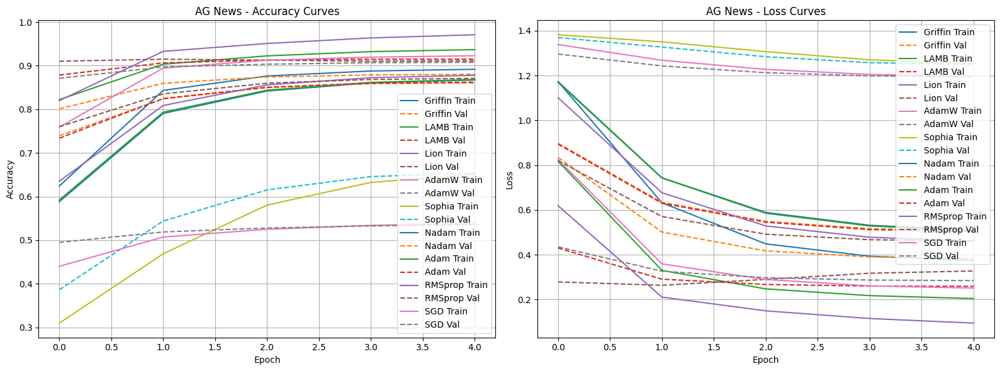

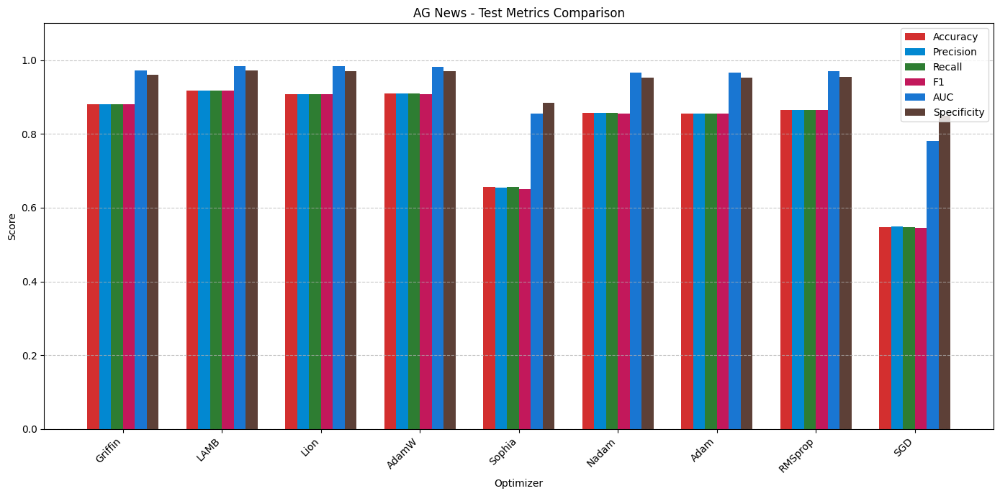

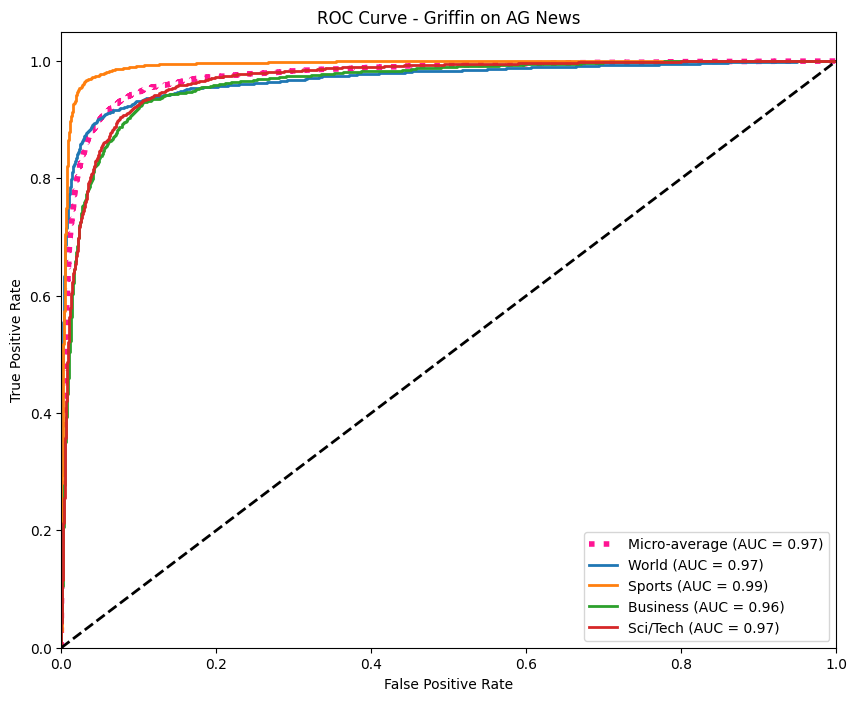

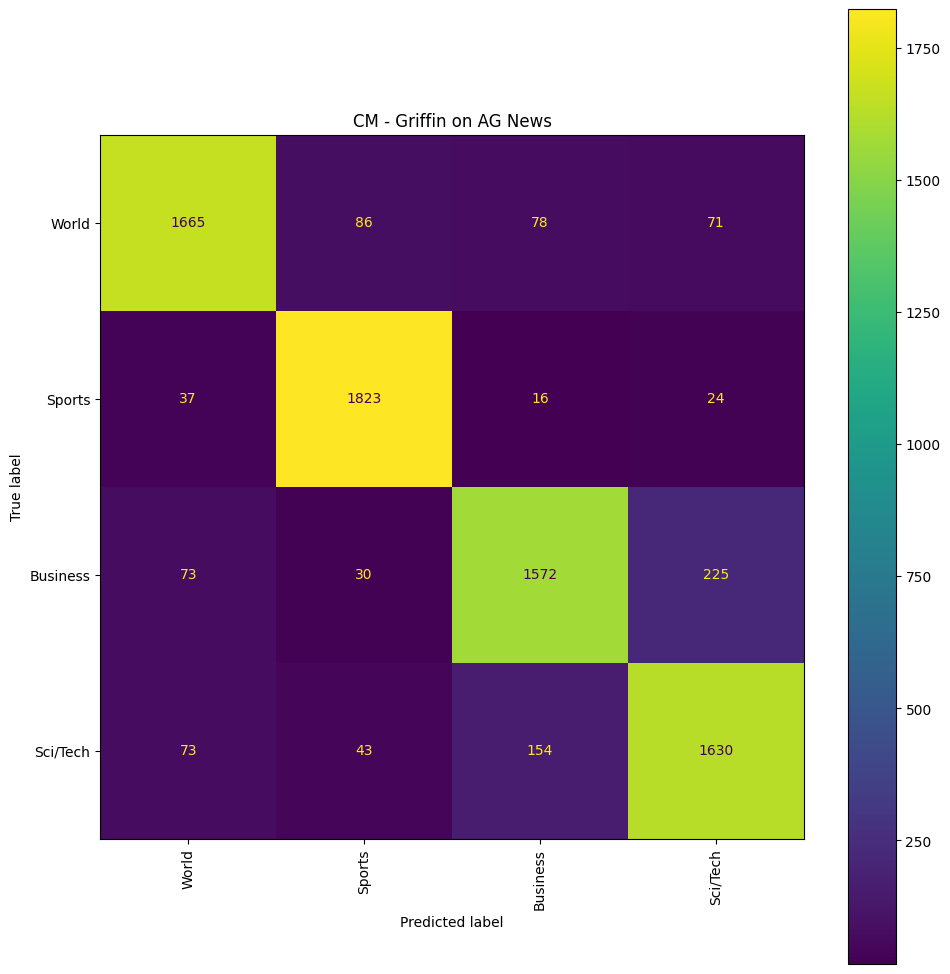

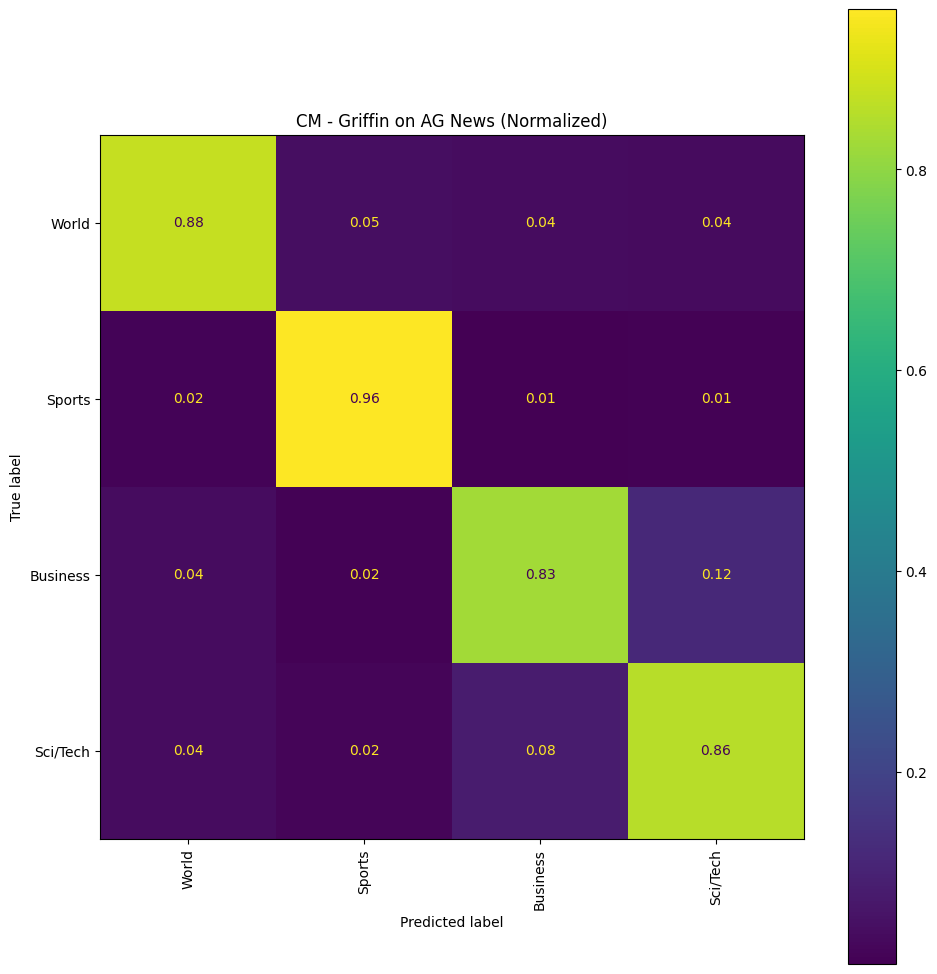

...

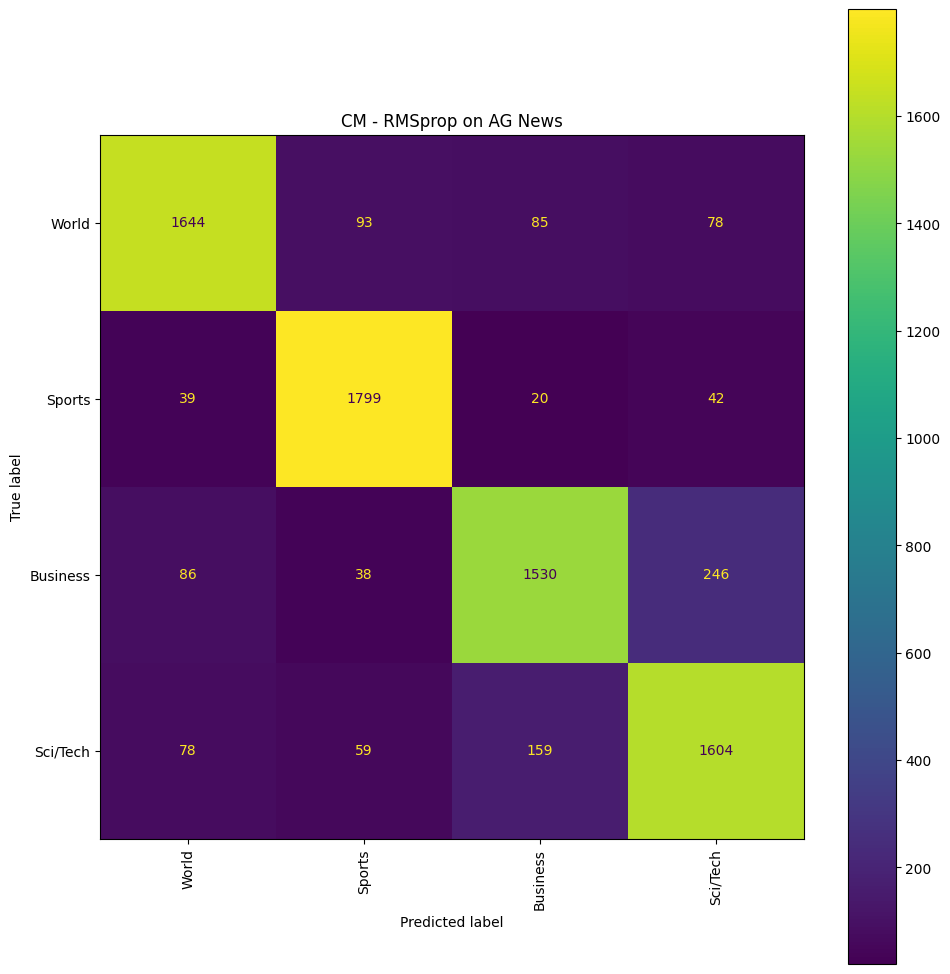

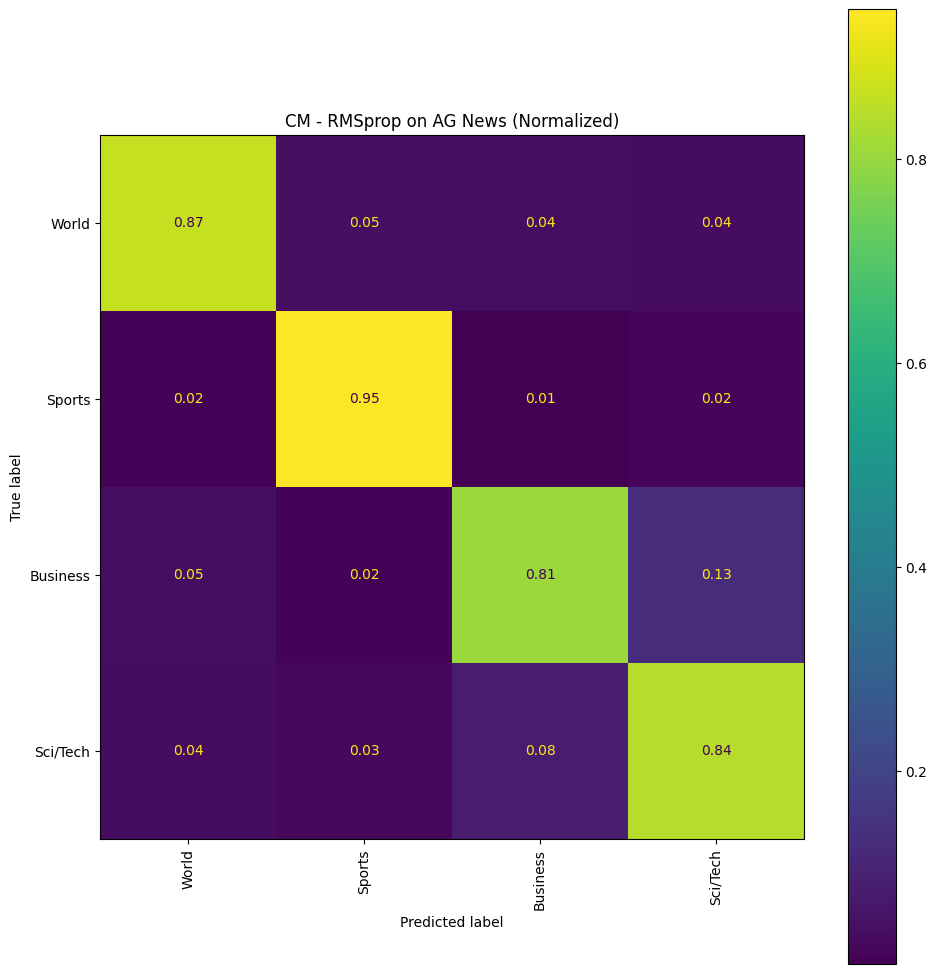

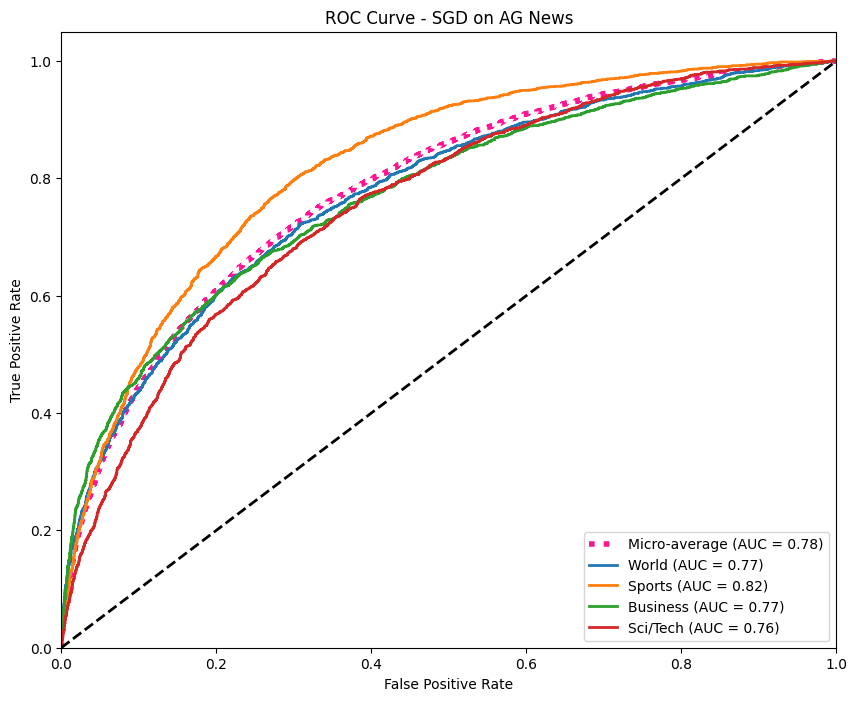

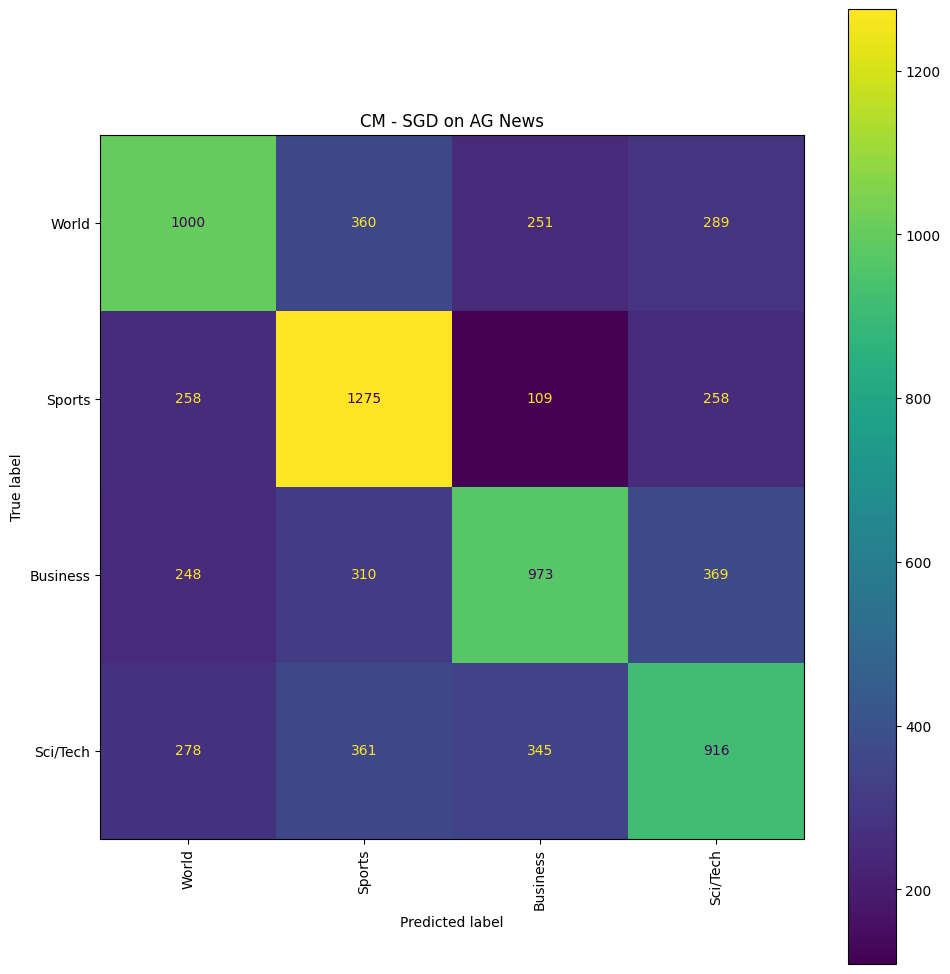

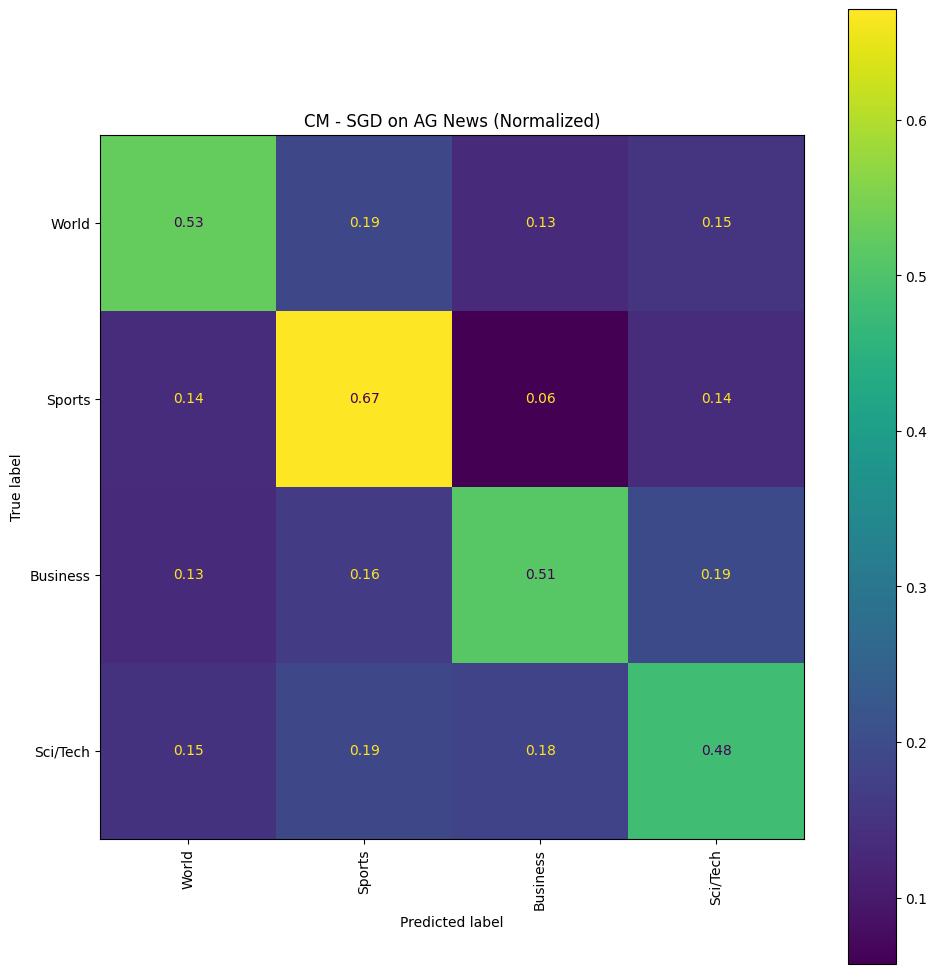


=== LaTeX Table for AG News ===

\begin{table}[H]
\centering
\begin{tabular}{lcccccccc}\toprule
Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\ \midrule
Griffin & 0.3886 & 0.8803 & 0.8801 & 0.8803 & 0.8799 & 0.9730 & 0.9601 & 3.88 \\
LAMB & 0.2692 & 0.9167 & 0.9166 & 0.9167 & 0.9166 & 0.9844 & 0.9722 & 3.38 \\
Lion & 0.3232 & 0.9087 & 0.9087 & 0.9087 & 0.9086 & 0.9843 & 0.9696 & 2.55 \\
AdamW & 0.2901 & 0.9088 & 0.9088 & 0.9088 & 0.9087 & 0.9819 & 0.9696 & 2.78 \\
Sophia & 1.2449 & 0.6557 & 0.6549 & 0.6557 & 0.6515 & 0.8550 & 0.8852 & 2.72 \\
Nadam & 0.5060 & 0.8563 & 0.8565 & 0.8563 & 0.8559 & 0.9664 & 0.9521 & 2.86 \\
Adam & 0.5043 & 0.8553 & 0.8554 & 0.8553 & 0.8549 & 0.9664 & 0.9518 & 2.72 \\
RMSprop & 0.4624 & 0.8654 & 0.8654 & 0.8654 & 0.8650 & 0.9696 & 0.9551 & 2.54 \\
SGD & 1.1856 & 0.5479 & 0.5483 & 0.5479 & 0.5460 & 0.7810 & 0.8493 & 2.31 \\
\bottomrule
\end{tabular}
\caption{Performance Metrics for AG News}
\label{tab:a

In [10]:
import os
import random
import time
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import Optimizer
import torch.nn.functional as F
from torch.utils.data import DataLoader, random_split, Dataset
from torch.nn.utils.rnn import pad_sequence
from sklearn.metrics import (
    precision_score, recall_score, f1_score, confusion_matrix,
    ConfusionMatrixDisplay, roc_curve, auc, roc_auc_score
)
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
from typing import Iterable, Tuple, Optional
from itertools import cycle
from datasets import load_dataset
from collections import Counter
from nltk.tokenize import word_tokenize
import nltk

# ---------------------------
# Setup & Reproducibility
# ---------------------------
def set_seed(seed: int = 42):
    """Sets the random seed for reproducibility across libraries."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

print("Setting random seed for reproducibility...", flush=True)
set_seed()
nltk.download('punkt', quiet=True)


# Global settings
NUM_EPOCHS = 5
RESULTS_DIR = "results_ag_news"
os.makedirs(RESULTS_DIR, exist_ok=True)


# ---------------------------
# Optimizer Implementations
# ---------------------------


# ---------------------------
# Griffin Optimizer
# ---------------------------
class Griffin(Optimizer):
    def __init__(self, params, lr=5e-4, betas=(0.95, 0.99), weight_decay=1e-4,
                 eps=1e-8, beta_sigma=0.9, schedule_decay=5e-3, warmup_steps=100):
        defaults = dict(lr=lr, betas=betas, weight_decay=weight_decay,
                        eps=eps, beta_sigma=beta_sigma,
                        schedule_decay=schedule_decay, warmup_steps=warmup_steps)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure else None
        for group in self.param_groups:
            lr = group['lr']
            wd = group['weight_decay']
            eps = group['eps']
            beta_sigma = group['beta_sigma']
            schedule_decay = group['schedule_decay']
            warmup_steps = group['warmup_steps']
            beta1, beta2 = group['betas']

            for p in group['params']:
                if p.grad is None:
                    continue

                g = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m_schedule'] = 1.0
                    state['m'] = torch.zeros_like(p)  # 1st moment
                    state['v'] = torch.zeros_like(p)  # 2nd moment
                    state['sigma'] = 0.6  # Scalar sigma per parameter
                    state['g_prev'] = torch.zeros_like(p)  # Previous gradient

                state['step'] += 1
                step = state['step']
                m, v, g_prev = state['m'], state['v'], state['g_prev']
                m_schedule = state['m_schedule']
                sigma = state['sigma']

                # ===== Nadam Momentum Schedule (Optimized) =====
                momentum_t = beta1 * (1. - 0.5 * (0.98 ** (step * schedule_decay)))
                momentum_t1 = beta1 * (1. - 0.5 * (0.98 ** ((step + 1) * schedule_decay)))
                m_schedule = m_schedule * momentum_t
                schedule_next = m_schedule * momentum_t1

                # ===== Efficient Weight Decay =====
                if wd != 0:
                    p.mul_(1 - lr * wd)

                # ===== Low-Cost Moment Updates =====
                # Update momentum (m)
                m.mul_(beta1).add_(g, alpha=1 - beta1)

                # Update adaptive term (v)
                v.mul_(beta2).addcmul_(g, g, value=1 - beta2)

                # ===== Ultra-Efficient Sigma Update =====
                grad_change = (g - g_prev).abs().mean().item()
                stability = 1.0 / (1.0 + 10 * grad_change)
                new_sigma = 0.4 + 0.4 * stability

                # Warmup-controlled sigma update
                warmup_factor = min(1.0, step / warmup_steps)
                sigma = sigma * (beta_sigma * warmup_factor) + new_sigma * (1 - beta_sigma * warmup_factor)
                sigma = max(0.4, min(0.8, sigma))
                state['sigma'] = sigma

                # Store current gradient for next step
                g_prev.copy_(g)

                # ===== Fast Parameter Update =====
                # Bias correction with momentum combination
                bias_corr1 = 1 - beta1 ** step
                bias_corr2 = 1 - beta2 ** step

                m_hat = (beta1 * m) / (1 - beta1**(step+1)) + ((1 - beta1) * g) / (1 - beta1**step)
                v_hat = v / bias_corr2
                denom = v_hat.sqrt().add_(eps)

                # Learning rate with warmup and sigma scaling
                lr_scale = min(1.0, step / warmup_steps)
                step_size = lr * lr_scale * (1. - momentum_t) / (1. - m_schedule) * sigma

                p.addcdiv_(m_hat, denom, value=-step_size)

                # Update momentum schedule
                state['m_schedule'] = schedule_next

        return loss




class Sophia(Optimizer):
    """Implements Sophia algorithm."""
    def __init__(self, params, lr=1e-3, beta1=0.965, beta2=0.99, rho=0.04, weight_decay=1e-3, eps=1e-8):
        defaults = dict(lr=lr, beta1=beta1, beta2=beta2, rho=rho, weight_decay=weight_decay, eps=eps)
        super(Sophia, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure is not None else None
        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p)
                    state['hess_ema'] = torch.ones_like(p)
                m, hess_ema = state['m'], state['hess_ema']
                beta1, beta2, rho, lr, wd, eps = group['beta1'], group['beta2'], group['rho'], group['lr'], group['weight_decay'], group['eps']
                m.mul_(beta1).add_(grad, alpha=1 - beta1)
                hess_ema.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                denom = hess_ema.add(eps)
                scaled_grad = torch.clamp(m / denom, -rho, rho)
                if wd != 0: p.data.mul_(1 - lr * wd)
                p.add_(scaled_grad, alpha=-lr)
                state['step'] += 1
        return loss

class Lion(Optimizer):
    """Implements Lion algorithm."""
    def __init__(self, params, lr=1e-4, betas=(0.9, 0.99), weight_decay=0.0):
        if lr <= 0.0: raise ValueError(f"Invalid learning rate: {lr}")
        if not 0.0 <= betas[0] < 1.0: raise ValueError(f"Invalid beta1: {betas[0]}")
        if not 0.0 <= betas[1] < 1.0: raise ValueError(f"Invalid beta2: {betas[1]}")
        if weight_decay < 0.0: raise ValueError(f"Invalid weight_decay: {weight_decay}")
        defaults = dict(lr=lr, betas=betas, weight_decay=weight_decay)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                if group["weight_decay"] != 0:
                    p.mul_(1 - group["lr"] * group["weight_decay"])
                state = self.state[p]
                if len(state) == 0:
                    state["exp_avg"] = torch.zeros_like(p)
                exp_avg = state["exp_avg"]
                update = exp_avg.mul(group["betas"][0]).add(grad, alpha=1 - group["betas"][0])
                p.add_(update.sign(), alpha=-group["lr"])
                exp_avg.mul_(group["betas"][1]).add_(grad, alpha=1 - group["betas"][1])
        return loss

class LAMB(Optimizer):
    """Implements LAMB optimizer."""
    def __init__(
        self, params: Iterable[torch.nn.Parameter], lr: float = 1e-3,
        betas: Tuple[float, float] = (0.9, 0.999), eps: float = 1e-6,
        weight_decay: float = 0.0, clamp_trust_ratio: Optional[Tuple[float, float]] = (0.0, 10.0)
    ):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay, clamp_trust_ratio=clamp_trust_ratio)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state["step"] = 0
                    state["exp_avg"] = torch.zeros_like(p)
                    state["exp_avg_sq"] = torch.zeros_like(p)
                exp_avg, exp_avg_sq = state["exp_avg"], state["exp_avg_sq"]
                state["step"] += 1
                beta1, beta2 = group["betas"]
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                bias_c1 = 1 - beta1 ** state["step"]
                bias_c2 = 1 - beta2 ** state["step"]
                m_hat = exp_avg / bias_c1
                v_hat = exp_avg_sq / bias_c2
                denom = v_hat.sqrt().add_(group["eps"])
                update = m_hat / denom
                if group["weight_decay"] != 0:
                    update.add_(p, alpha=group["weight_decay"])
                w_norm = p.norm(p=2)
                u_norm = update.norm(p=2)
                trust_ratio = (w_norm / u_norm).item() if w_norm > 0 and u_norm > 0 else 1.0
                if group["clamp_trust_ratio"] is not None:
                    lo, hi = group["clamp_trust_ratio"]
                    trust_ratio = max(lo, min(trust_ratio, hi))
                p.add_(update, alpha=-group["lr"] * trust_ratio)
        return loss

# ---------------------------
# Model and Data for AG News
# ---------------------------
class TextClassificationModel(nn.Module):
    """A simple text classification model with an embedding layer."""
    def __init__(self, vocab_size, embed_dim=128, num_class=4):
        super(TextClassificationModel, self).__init__()
        self.embedding = nn.Embedding(vocab_size, embed_dim, padding_idx=1)
        self.fc = nn.Linear(embed_dim, num_class)

    def forward(self, text):
        embedded = self.embedding(text)
        pooled = embedded.mean(1)
        return self.fc(pooled)

class AGNewsDataset(Dataset):
    def __init__(self, texts, labels):
        self.texts = texts
        self.labels = labels

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        return self.texts[idx], self.labels[idx]

def get_ag_news_loaders(batch_size=128):
    """Loads and preprocesses the AG News data."""
    print("Loading AG News dataset...")
    dataset = load_dataset("ag_news")

    print("Building vocabulary...")
    train_val_data = dataset['train']
    counter = Counter()
    for item in train_val_data:
        counter.update(word_tokenize(item['text'].lower()))

    vocab = {'<unk>': 0, '<pad>': 1}
    for i, (word, _) in enumerate(counter.most_common(20000 - 2), 2):
        vocab[word] = i

    def text_pipeline(text):
        return [vocab.get(token, vocab['<unk>']) for token in word_tokenize(text.lower())]

    def process_data(split):
        texts = [torch.tensor(text_pipeline(item['text']), dtype=torch.long) for item in split]
        labels = [item['label'] for item in split]
        return texts, labels

    train_val_texts, train_val_labels = process_data(dataset['train'])
    test_texts, test_labels = process_data(dataset['test'])

    train_size = int(0.9 * len(train_val_labels))
    val_size = len(train_val_labels) - train_size
    train_indices, val_indices = random_split(range(len(train_val_labels)), [train_size, val_size])

    train_texts = [train_val_texts[i] for i in train_indices]
    train_labels = [train_val_labels[i] for i in train_indices]
    val_texts = [train_val_texts[i] for i in val_indices]
    val_labels = [train_val_labels[i] for i in val_indices]

    train_dataset = AGNewsDataset(train_texts, train_labels)
    val_dataset = AGNewsDataset(val_texts, val_labels)
    test_dataset = AGNewsDataset(test_texts, test_labels)

    def collate_batch(batch):
        label_list, text_list = [], []
        for (_text, _label) in batch:
            label_list.append(_label)
            text_list.append(_text)
        return pad_sequence(text_list, batch_first=True, padding_value=1), torch.tensor(label_list, dtype=torch.long)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_batch)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_batch)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_batch)

    return train_loader, val_loader, test_loader, len(vocab), len(dataset['train'].features['label'].names)


# ---------------------------
# Training and Evaluation
# ---------------------------
def train_model(model_fn, optimizer_factory, train_loader, val_loader, test_loader,
                num_epochs=5, dataset_name="AG News", run_name="default"):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model_fn().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optimizer_factory(model.parameters())
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    history = { 'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': [] }
    start_time = time.time()

    print(f"Training {run_name} on {dataset_name} for {num_epochs} epochs on {device}...")

    for epoch in range(num_epochs):
        epoch_start = time.time()
        model.train()
        train_loss, train_correct, train_total = 0.0, 0, 0
        for data, targets in train_loader:
            data, targets = data.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(data)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            train_total += targets.size(0)
            train_correct += preds.eq(targets).sum().item()

        history['train_loss'].append(train_loss / train_total)
        history['train_acc'].append(train_correct / train_total)

        model.eval()
        val_loss, val_correct, val_total = 0.0, 0, 0
        with torch.no_grad():
            for data, targets in val_loader:
                data, targets = data.to(device), targets.to(device)
                outputs = model(data)
                loss = criterion(outputs, targets)
                val_loss += loss.item() * data.size(0)
                _, preds = outputs.max(1)
                val_total += targets.size(0)
                val_correct += preds.eq(targets).sum().item()

        history['val_loss'].append(val_loss / val_total)
        history['val_acc'].append(val_correct / val_total)

        print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {history['train_loss'][-1]:.4f}, Acc: {history['train_acc'][-1]:.4f} | "
              f"Val Loss: {history['val_loss'][-1]:.4f}, Acc: {history['val_acc'][-1]:.4f} | Time: {time.time() - epoch_start:.2f}s")
        scheduler.step()

    # --- Test Phase ---
    model.eval()
    all_preds, all_targets, all_probs = [], [], []
    test_loss_sum = 0.0
    with torch.no_grad():
        for data, targets in test_loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            loss = criterion(outputs, targets)
            test_loss_sum += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            all_preds.extend(preds.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
            all_probs.extend(torch.softmax(outputs, dim=1).cpu().numpy())

    # --- Final Metrics Calculation ---
    final_metrics = {}
    all_preds = np.array(all_preds)
    all_targets = np.array(all_targets)
    all_probs = np.array(all_probs)

    final_metrics['test_loss'] = test_loss_sum / len(all_targets)
    final_metrics['test_acc'] = (all_preds == all_targets).mean()
    final_metrics['test_precision'] = precision_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_recall'] = recall_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_f1'] = f1_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_auc'] = roc_auc_score(all_targets, all_probs, multi_class='ovr')

    cm = confusion_matrix(all_targets, all_preds)
    specificity = []
    for i in range(cm.shape[0]):
        tn = cm.sum() - (cm[i, :].sum() + cm[:, i].sum() - cm[i, i])
        fp = cm[:, i].sum() - cm[i, i]
        specificity.append(tn / (tn + fp + 1e-8))
    final_metrics['test_specificity'] = np.mean(specificity)

    final_metrics['runtime'] = time.time() - start_time
    final_metrics['avg_epoch_time'] = final_metrics['runtime'] / num_epochs
    final_metrics['targets'] = all_targets
    final_metrics['preds'] = all_preds
    final_metrics['probs'] = all_probs

    print(f"\nFinal Test Results for {run_name}: Acc: {final_metrics['test_acc']:.4f}, F1: {final_metrics['test_f1']:.4f}, AUC: {final_metrics['test_auc']:.4f}\n")

    return {**history, **final_metrics}


# ---------------------------
# Optimizers Setup
# ---------------------------
optimizers = {
    'Griffin': lambda params:  Griffin(params, lr=1e-3, betas=(0.9, 0.999),
            weight_decay=1e-3, eps=1e-8, beta_sigma=0.99, schedule_decay=1e-3, warmup_steps=100),
    'LAMB': lambda params: LAMB(params, lr=1e-3, weight_decay=1e-4),
    'Lion': lambda params: Lion(params, lr=1e-3, weight_decay=1e-4),
    'AdamW': lambda params: optim.AdamW(params, lr=1e-3, weight_decay=1e-4),
    'Sophia': lambda params: Sophia(params, lr=1e-3, weight_decay=1e-4),
    'Nadam': lambda params: optim.NAdam(params, lr=1e-3, weight_decay=1e-4),
    'Adam': lambda params: optim.Adam(params, lr=1e-3, weight_decay=1e-4),
    'RMSprop': lambda params: optim.RMSprop(params, lr=1e-3, weight_decay=1e-4),
    'SGD': lambda params: optim.SGD(params, lr=0.01, momentum=0.9, weight_decay=1e-4),
}

# ---------------------------
# Plotting, Saving, and Table Utilities
# ---------------------------
def plot_learning_curves(results, dataset_name, save_path=None):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    for opt_name, metrics in results.items():
        ax1.plot(metrics['train_acc'], label=f'{opt_name} Train', linestyle='-')
        ax1.plot(metrics['val_acc'], label=f'{opt_name} Val', linestyle='--')
    ax1.set_title(f'{dataset_name} - Accuracy Curves'); ax1.set_xlabel('Epoch'); ax1.set_ylabel('Accuracy'); ax1.legend(); ax1.grid(True)
    for opt_name, metrics in results.items():
        ax2.plot(metrics['train_loss'], label=f'{opt_name} Train', linestyle='-')
        ax2.plot(metrics['val_loss'], label=f'{opt_name} Val', linestyle='--')
    ax2.set_title(f'{dataset_name} - Loss Curves'); ax2.set_xlabel('Epoch'); ax2.set_ylabel('Loss'); ax2.legend(); ax2.grid(True)
    plt.tight_layout()
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_test_metrics(results, dataset_name, save_path=None):
    metrics_list = ['test_acc', 'test_precision', 'test_recall', 'test_f1', 'test_auc', 'test_specificity']
    metric_names = ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Specificity']

    # Beautiful color palette (only change)
    colors = ['#D32F2F', '#0288D1', '#2E7D32', '#C2185B', '#1976D2', '#5D4037']

    plt.figure(figsize=(14, 7))
    bar_width = 0.12
    x = np.arange(len(results))

    for i, metric in enumerate(metrics_list):
        values = [results[opt][metric] for opt in results]
        plt.bar(x + i * bar_width, values, width=bar_width, label=metric_names[i], color=colors[i])

    plt.title(f'{dataset_name} - Test Metrics Comparison')
    plt.xlabel('Optimizer')
    plt.ylabel('Score')
    plt.xticks(x + bar_width * (len(metrics_list)/2 - 0.5), list(results.keys()), rotation=45, ha="right")
    plt.ylim(0, 1.1)
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path)
    plt.show()

def plot_roc_curves(result, opt_name, class_names, dataset_name, save_path=None):
    probs, targets = result['probs'], result['targets']
    targets_bin = label_binarize(targets, classes=range(len(class_names)))
    fpr, tpr, roc_auc = {}, {}, {}
    for i in range(len(class_names)):
        fpr[i], tpr[i], _ = roc_curve(targets_bin[:, i], probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    fpr["micro"], tpr["micro"], _ = roc_curve(targets_bin.ravel(), probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    plt.figure(figsize=(10, 8))
    plt.plot(fpr["micro"], tpr["micro"], label=f'Micro-average (AUC = {roc_auc["micro"]:.2f})', color='deeppink', linestyle=':', linewidth=4)
    colors = cycle(plt.get_cmap('tab10').colors)
    for i, color in zip(range(len(class_names)), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2, label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2); plt.xlim([0.0, 1.0]); plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate'); plt.title(f'ROC Curve - {opt_name} on {dataset_name}'); plt.legend(loc="lower right")
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_confusion_matrix(result, opt_name, class_names, dataset_name, normalize=False, save_path=None):
    cm = confusion_matrix(result['targets'], result['preds'])
    title = f'CM - {opt_name} on {dataset_name}'
    if normalize:
        cm = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-8)
        title += ' (Normalized)'
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    fig, ax = plt.subplots(figsize=(10, 10))
    disp.plot(ax=ax, cmap='viridis', values_format='.2f' if normalize else 'd', xticks_rotation='vertical')
    plt.title(title)
    plt.tight_layout()
    if save_path: plt.savefig(save_path)
    plt.show()

def generate_latex_table(results, dataset_name):
    """Generates a LaTeX table with all relevant metrics."""
    header = (
        "\\begin{table}[H]\n\\centering\n"
        "\\begin{tabular}{lcccccccc}\\toprule\n"
        "Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\\\ \\midrule\n"
    )

    footer = (
        "\\bottomrule\n\\end{tabular}\n"
        f"\\caption{{Performance Metrics for {dataset_name}}}\n"
        f"\\label{{tab:{dataset_name.lower().replace('-', '_').replace(' ', '_')}_perf}}\n"
        "\\end{table}"
    )

    rows = []
    for opt, m in results.items():
        rows.append(
            f"{opt} & {m['test_loss']:.4f} & {m['test_acc']:.4f} & "
            f"{m['test_precision']:.4f} & {m['test_recall']:.4f} & {m['test_f1']:.4f} & "
            f"{m['test_auc']:.4f} & {m['test_specificity']:.4f} & {m['avg_epoch_time']:.2f} \\\\"
        )

    return header + "\n".join(rows) + "\n" + footer

# ---------------------------
# Main Execution
# ---------------------------
if __name__ == "__main__":
    train_loader, val_loader, test_loader, vocab_size, num_classes = get_ag_news_loaders()
    class_names = ['World', 'Sports', 'Business', 'Sci/Tech']

    results_ag_news = {}
    for opt_name, opt_factory in optimizers.items():
        model_creator = lambda: TextClassificationModel(vocab_size, 128, num_classes)
        results_ag_news[opt_name] = train_model(
            model_creator, opt_factory, train_loader, val_loader, test_loader,
            num_epochs=NUM_EPOCHS, dataset_name="AG News", run_name=opt_name
        )

    # --- Generate and Save Artifacts ---
    print("\n--- Generating and Saving All Artifacts for AG News ---")
    plot_learning_curves(results_ag_news, "AG News", save_path=os.path.join(RESULTS_DIR, "ag_news_learning_curves.png"))
    plot_test_metrics(results_ag_news, "AG News", save_path=os.path.join(RESULTS_DIR, "ag_news_test_metrics.png"))

    for opt_name, result in results_ag_news.items():
        plot_roc_curves(result, opt_name, class_names, "AG News", save_path=os.path.join(RESULTS_DIR, f"roc_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, class_names, "AG News", normalize=False, save_path=os.path.join(RESULTS_DIR, f"cm_raw_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, class_names, "AG News", normalize=True, save_path=os.path.join(RESULTS_DIR, f"cm_norm_{opt_name}.png"))

    # --- Generate, Print, and Save LaTeX and TXT Table ---
    latex_table_str = generate_latex_table(results_ag_news, "AG News")
    print("\n=== LaTeX Table for AG News ===\n")
    print(latex_table_str)

    # Save as .tex file
    tex_path = os.path.join(RESULTS_DIR, "ag_news_results_table.tex")
    with open(tex_path, "w") as f:
        f.write(latex_table_str)
    print(f"LaTeX table saved to: {tex_path}")

    # Save as .txt file (without LaTeX commands for readability)
    txt_path = os.path.join(RESULTS_DIR, "ag_news_results_summary.txt")
    with open(txt_path, "w") as f:
        f.write("Optimizer, Test Loss, Test Acc, Precision, Recall, F1, AUC, Specificity, Avg Epoch Time (s)\n")
        for opt, m in results_ag_news.items():
             f.write(
                f"{opt}, {m['test_loss']:.4f}, {m['test_acc']:.4f}, "
                f"{m['test_precision']:.4f}, {m['test_recall']:.4f}, {m['test_f1']:.4f}, "
                f"{m['test_auc']:.4f}, {m['test_specificity']:.4f}, {m['avg_epoch_time']:.2f}\n"
            )
    print(f"Summary text file saved to: {txt_path}")


    print("\n--- Script Finished ---")


In [11]:
from google.colab import files
import os
import zipfile

# Define the directory to zip
results_dir = "/content/results_ag_news"
# Define the name for the zip file
zip_filename = "/content/results_ag_news.zip"

# Create a ZipFile object
if os.path.exists(results_dir):
    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Walk through the directory and add files to the zip
        for root, _, files_in_dir in os.walk(results_dir):
            for file in files_in_dir:
                file_path = os.path.join(root, file)
                # Add file to zip, preserving directory structure
                zipf.write(file_path, os.path.relpath(file_path, results_dir))
    print(f"Successfully created {zip_filename}")

    # Download the zip file
    files.download(zip_filename)
else:
    print(f"Error: Directory '{results_dir}' not found.")

Successfully created /content/results_ag_news.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# !rm -rf results_ag_news

# 7- SVHN

Setting random seed for reproducibility...


100%|██████████| 182M/182M [00:17<00:00, 10.4MB/s] 
100%|██████████| 64.3M/64.3M [00:11<00:00, 5.51MB/s]


Training Griffin on SVHN for 10 epochs on cuda...
Epoch 1/10 | Train Loss: 0.9656, Acc: 0.6691 | Val Loss: 0.6675, Acc: 0.7925 | Time: 46.34s
Epoch 2/10 | Train Loss: 0.3739, Acc: 0.8849 | Val Loss: 0.3573, Acc: 0.8893 | Time: 44.99s
Epoch 3/10 | Train Loss: 0.3087, Acc: 0.9067 | Val Loss: 0.3779, Acc: 0.8833 | Time: 44.95s
Epoch 4/10 | Train Loss: 0.2691, Acc: 0.9194 | Val Loss: 0.2779, Acc: 0.9156 | Time: 45.32s
Epoch 5/10 | Train Loss: 0.2399, Acc: 0.9292 | Val Loss: 0.2665, Acc: 0.9192 | Time: 45.33s
Epoch 6/10 | Train Loss: 0.2169, Acc: 0.9375 | Val Loss: 0.2360, Acc: 0.9296 | Time: 45.09s
Epoch 7/10 | Train Loss: 0.1871, Acc: 0.9457 | Val Loss: 0.2441, Acc: 0.9267 | Time: 45.26s
Epoch 8/10 | Train Loss: 0.1695, Acc: 0.9520 | Val Loss: 0.2026, Acc: 0.9412 | Time: 45.07s
Epoch 9/10 | Train Loss: 0.1484, Acc: 0.9593 | Val Loss: 0.1985, Acc: 0.9443 | Time: 45.53s
Epoch 10/10 | Train Loss: 0.1381, Acc: 0.9622 | Val Loss: 0.1900, Acc: 0.9477 | Time: 45.21s

Final Test Results for Griff

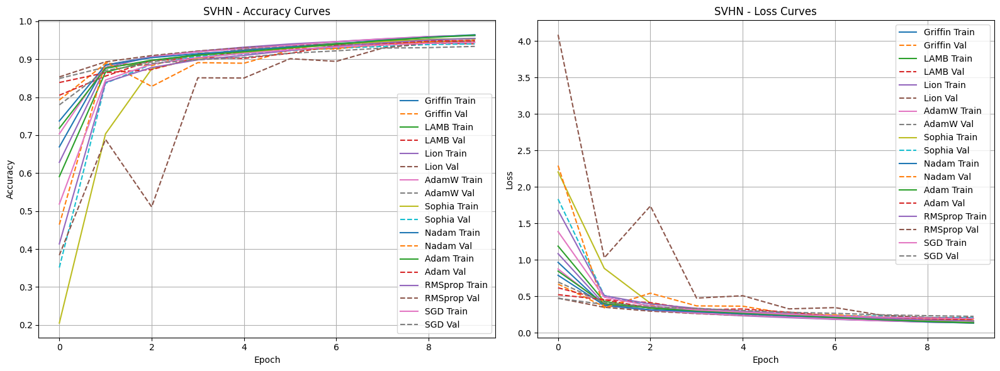

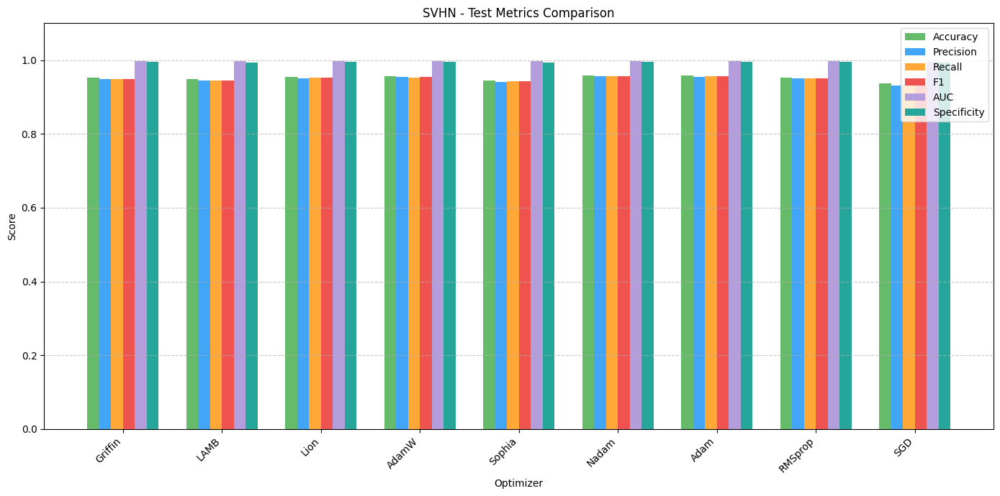

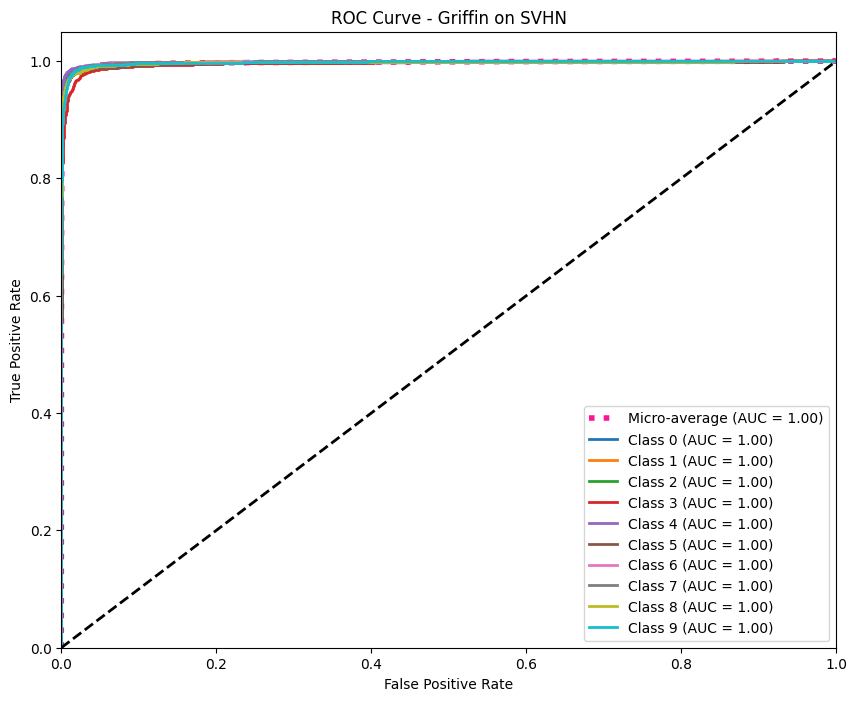

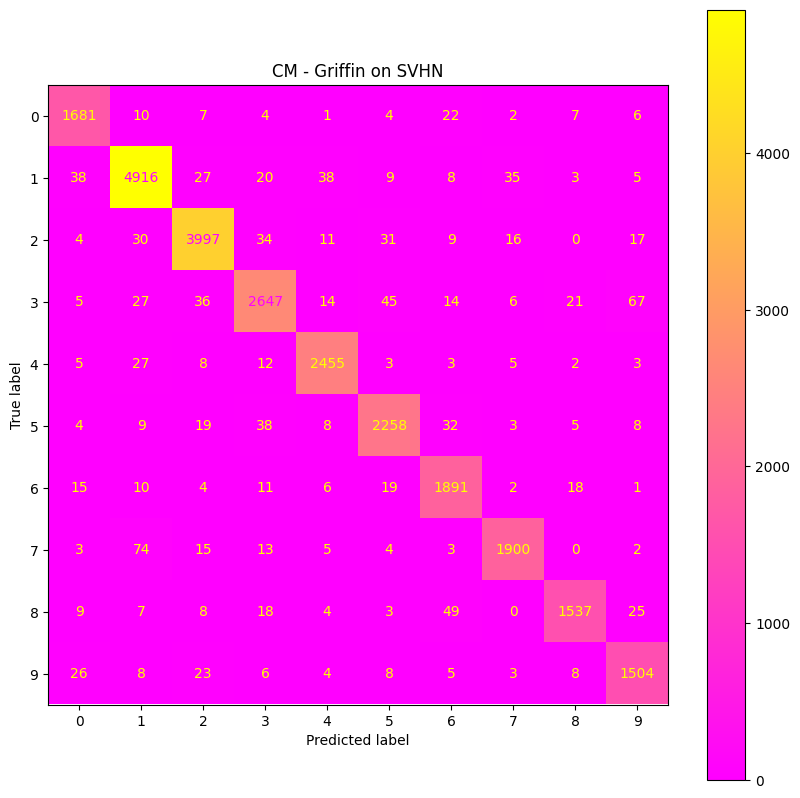

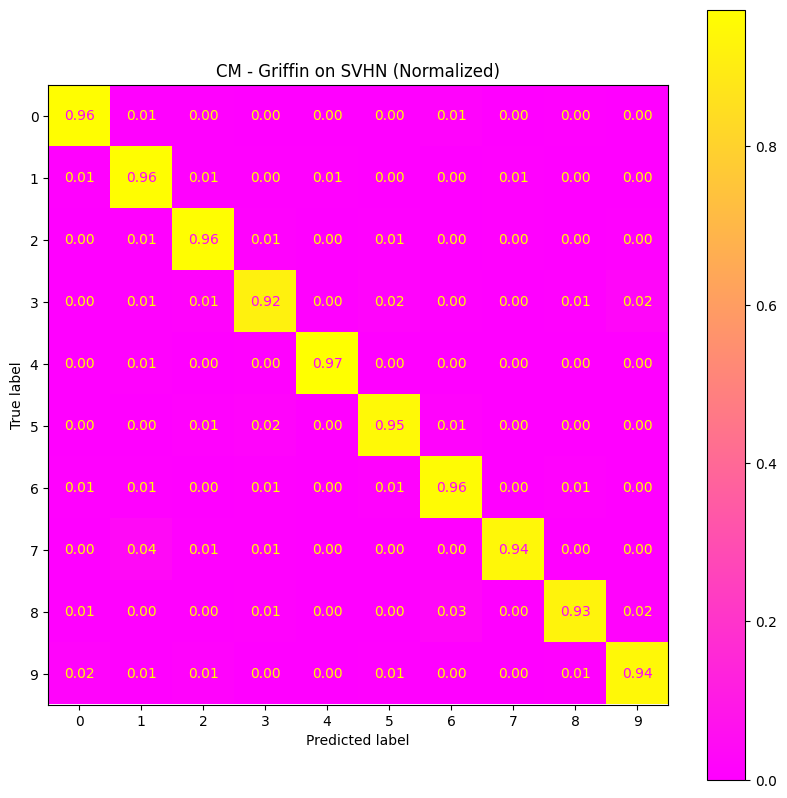

...

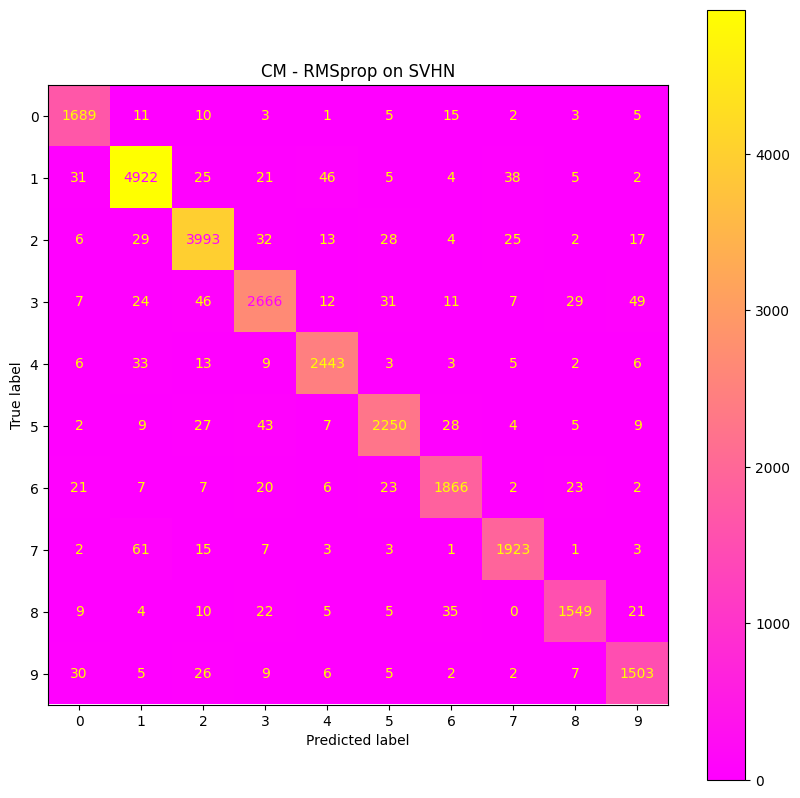

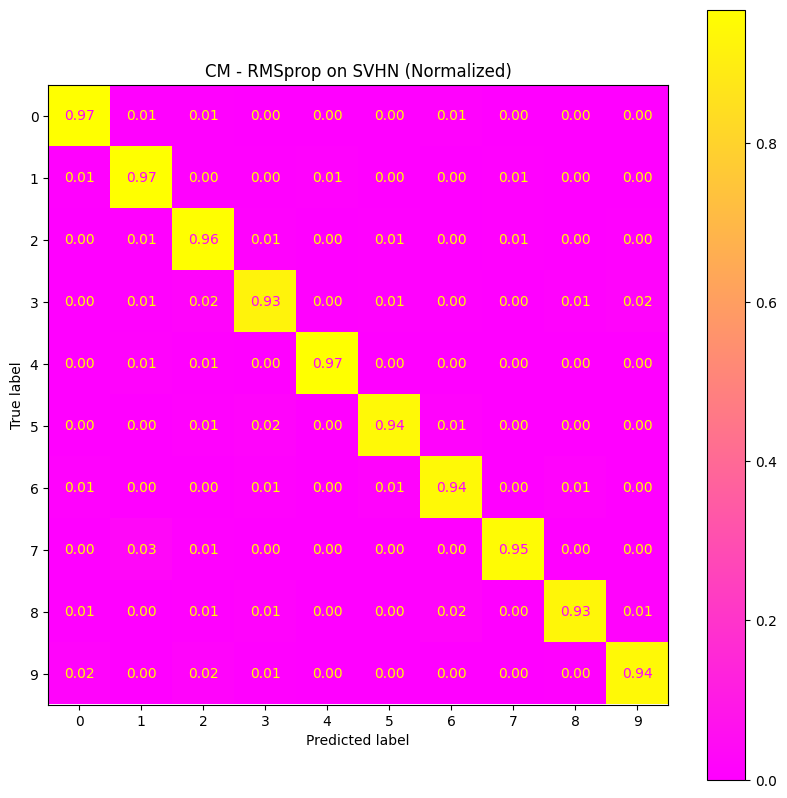

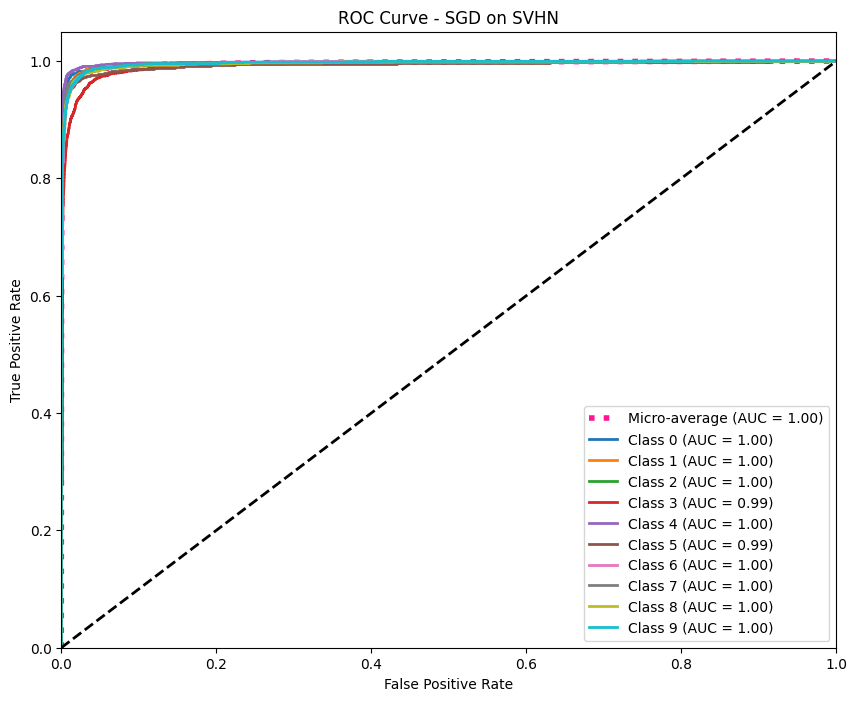

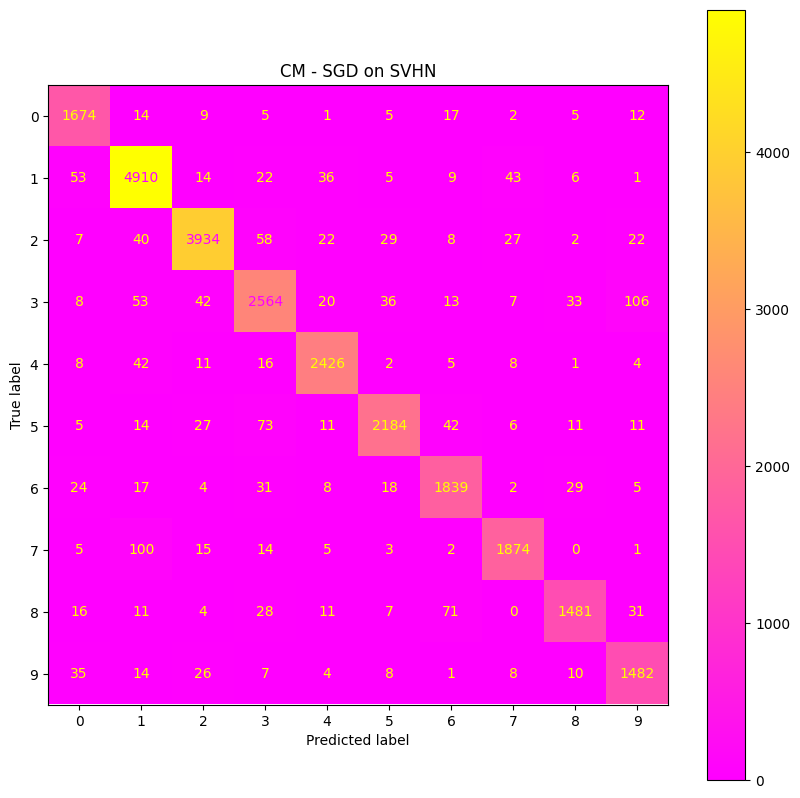

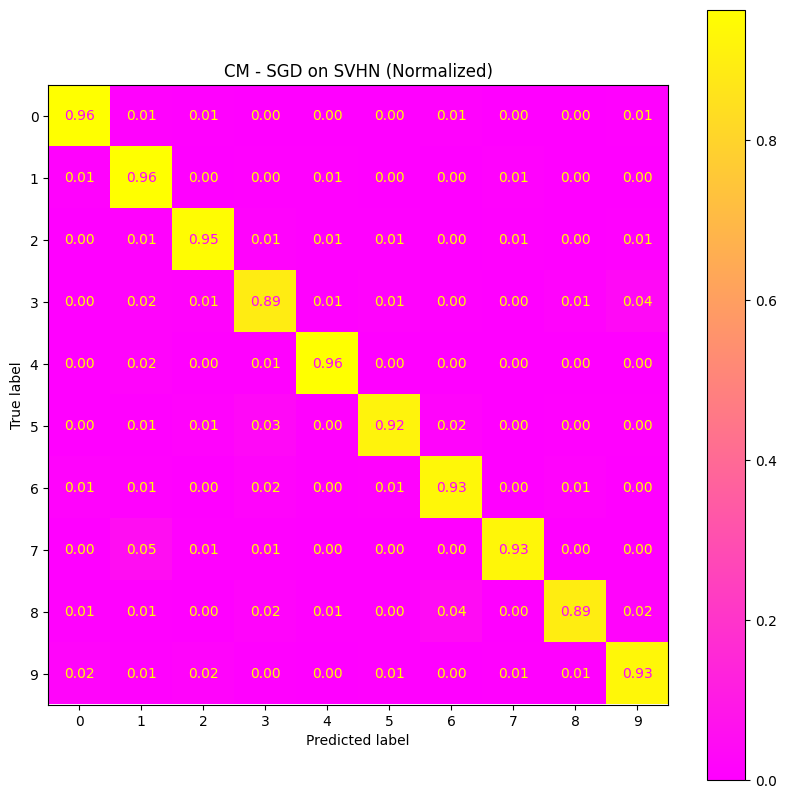


=== LaTeX Table for SVHN ===

\begin{table}[H]
\centering
\begin{tabular}{lcccccccc}\toprule
Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\ \midrule
Griffin & 0.1714 & 0.9521 & 0.9490 & 0.9496 & 0.9492 & 0.9969 & 0.9946 & 45.79 \\
LAMB & 0.1862 & 0.9482 & 0.9446 & 0.9455 & 0.9449 & 0.9966 & 0.9942 & 45.59 \\
Lion & 0.1689 & 0.9548 & 0.9510 & 0.9525 & 0.9517 & 0.9968 & 0.9949 & 38.85 \\
AdamW & 0.1623 & 0.9556 & 0.9540 & 0.9534 & 0.9536 & 0.9971 & 0.9950 & 38.64 \\
Sophia & 0.1887 & 0.9456 & 0.9417 & 0.9428 & 0.9421 & 0.9966 & 0.9939 & 39.17 \\
Nadam & 0.1569 & 0.9579 & 0.9569 & 0.9558 & 0.9563 & 0.9972 & 0.9952 & 38.87 \\
Adam & 0.1541 & 0.9577 & 0.9550 & 0.9570 & 0.9560 & 0.9972 & 0.9953 & 38.81 \\
RMSprop & 0.1651 & 0.9528 & 0.9502 & 0.9505 & 0.9503 & 0.9970 & 0.9947 & 38.57 \\
SGD & 0.2231 & 0.9361 & 0.9318 & 0.9318 & 0.9316 & 0.9957 & 0.9928 & 38.40 \\
\bottomrule
\end{tabular}
\caption{Performance Metrics for SVHN}
\label{ta

In [1]:
import os
import random
import time
from collections import Counter
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import Optimizer
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
from sklearn.metrics import (
    precision_score, recall_score, f1_score, confusion_matrix,
    ConfusionMatrixDisplay, roc_curve, auc, roc_auc_score
)
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
from typing import Iterable, Tuple, Optional
from itertools import cycle

# ---------------------------
# Setup & Reproducibility
# ---------------------------
def set_seed(seed: int = 42):
    """Sets the random seed for reproducibility across libraries."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

print("Setting random seed for reproducibility...", flush=True)
set_seed()

# Global settings
NUM_EPOCHS = 10
RESULTS_DIR = "/kaggle/working/results_svhn"
os.makedirs(RESULTS_DIR, exist_ok=True)


# ---------------------------
# Optimizer Implementations
# ---------------------------

# ---------------------------
# Griffin Optimizer
# ---------------------------
class Griffin(Optimizer):
    def __init__(self, params, lr=5e-4, betas=(0.95, 0.99), weight_decay=1e-4,
                 eps=1e-8, beta_sigma=0.9, schedule_decay=5e-3, warmup_steps=100):
        defaults = dict(lr=lr, betas=betas, weight_decay=weight_decay,
                        eps=eps, beta_sigma=beta_sigma,
                        schedule_decay=schedule_decay, warmup_steps=warmup_steps)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure else None
        for group in self.param_groups:
            lr = group['lr']
            wd = group['weight_decay']
            eps = group['eps']
            beta_sigma = group['beta_sigma']
            schedule_decay = group['schedule_decay']
            warmup_steps = group['warmup_steps']
            beta1, beta2 = group['betas']

            for p in group['params']:
                if p.grad is None:
                    continue

                g = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m_schedule'] = 1.0
                    state['m'] = torch.zeros_like(p)  # 1st moment
                    state['v'] = torch.zeros_like(p)  # 2nd moment
                    state['sigma'] = 0.6  # Scalar sigma per parameter
                    state['g_prev'] = torch.zeros_like(p)  # Previous gradient

                state['step'] += 1
                step = state['step']
                m, v, g_prev = state['m'], state['v'], state['g_prev']
                m_schedule = state['m_schedule']
                sigma = state['sigma']

                # ===== Nadam Momentum Schedule (Optimized) =====
                momentum_t = beta1 * (1. - 0.5 * (0.98 ** (step * schedule_decay)))
                momentum_t1 = beta1 * (1. - 0.5 * (0.98 ** ((step + 1) * schedule_decay)))
                m_schedule = m_schedule * momentum_t
                schedule_next = m_schedule * momentum_t1

                # ===== Efficient Weight Decay =====
                if wd != 0:
                    p.mul_(1 - lr * wd)

                # ===== Low-Cost Moment Updates =====
                # Update momentum (m)
                m.mul_(beta1).add_(g, alpha=1 - beta1)

                # Update adaptive term (v)
                v.mul_(beta2).addcmul_(g, g, value=1 - beta2)

                # ===== Ultra-Efficient Sigma Update =====
                grad_change = (g - g_prev).abs().mean().item()
                stability = 1.0 / (1.0 + 10 * grad_change)
                new_sigma = 0.4 + 0.4 * stability

                # Warmup-controlled sigma update
                warmup_factor = min(1.0, step / warmup_steps)
                sigma = sigma * (beta_sigma * warmup_factor) + new_sigma * (1 - beta_sigma * warmup_factor)
                sigma = max(0.4, min(0.8, sigma))
                state['sigma'] = sigma

                # Store current gradient for next step
                g_prev.copy_(g)

                # ===== Fast Parameter Update =====
                # Bias correction with momentum combination
                bias_corr1 = 1 - beta1 ** step
                bias_corr2 = 1 - beta2 ** step

                m_hat = (beta1 * m) / (1 - beta1**(step+1)) + ((1 - beta1) * g) / (1 - beta1**step)
                v_hat = v / bias_corr2
                denom = v_hat.sqrt().add_(eps)

                # Learning rate with warmup and sigma scaling
                lr_scale = min(1.0, step / warmup_steps)
                step_size = lr * lr_scale * (1. - momentum_t) / (1. - m_schedule) * sigma

                p.addcdiv_(m_hat, denom, value=-step_size)

                # Update momentum schedule
                state['m_schedule'] = schedule_next

        return loss





class Sophia(Optimizer):
    """Implements Sophia algorithm."""
    def __init__(self, params, lr=1e-3, beta1=0.965, beta2=0.99, rho=0.04, weight_decay=1e-3, eps=1e-8):
        defaults = dict(lr=lr, beta1=beta1, beta2=beta2, rho=rho, weight_decay=weight_decay, eps=eps)
        super(Sophia, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure is not None else None
        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p)
                    state['hess_ema'] = torch.ones_like(p)
                m, hess_ema = state['m'], state['hess_ema']
                beta1, beta2, rho, lr, wd, eps = group['beta1'], group['beta2'], group['rho'], group['lr'], group['weight_decay'], group['eps']
                m.mul_(beta1).add_(grad, alpha=1 - beta1)
                hess_ema.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                denom = hess_ema.add(eps)
                scaled_grad = torch.clamp(m / denom, -rho, rho)
                if wd != 0: p.data.mul_(1 - lr * wd)
                p.add_(scaled_grad, alpha=-lr)
                state['step'] += 1
        return loss

class Lion(Optimizer):
    """Implements Lion algorithm."""
    def __init__(self, params, lr=1e-4, betas=(0.9, 0.99), weight_decay=0.0):
        if lr <= 0.0: raise ValueError(f"Invalid learning rate: {lr}")
        if not 0.0 <= betas[0] < 1.0: raise ValueError(f"Invalid beta1: {betas[0]}")
        if not 0.0 <= betas[1] < 1.0: raise ValueError(f"Invalid beta2: {betas[1]}")
        if weight_decay < 0.0: raise ValueError(f"Invalid weight_decay: {weight_decay}")
        defaults = dict(lr=lr, betas=betas, weight_decay=weight_decay)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                if group["weight_decay"] != 0:
                    p.mul_(1 - group["lr"] * group["weight_decay"])
                state = self.state[p]
                if len(state) == 0:
                    state["exp_avg"] = torch.zeros_like(p)
                exp_avg = state["exp_avg"]
                update = exp_avg.mul(group["betas"][0]).add(grad, alpha=1 - group["betas"][0])
                p.add_(update.sign(), alpha=-group["lr"])
                exp_avg.mul_(group["betas"][1]).add_(grad, alpha=1 - group["betas"][1])
        return loss

class LAMB(Optimizer):
    """Implements LAMB optimizer."""
    def __init__(
        self, params: Iterable[torch.nn.Parameter], lr: float = 1e-3,
        betas: Tuple[float, float] = (0.9, 0.999), eps: float = 1e-6,
        weight_decay: float = 0.0, clamp_trust_ratio: Optional[Tuple[float, float]] = (0.0, 10.0)
    ):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay, clamp_trust_ratio=clamp_trust_ratio)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state["step"] = 0
                    state["exp_avg"] = torch.zeros_like(p)
                    state["exp_avg_sq"] = torch.zeros_like(p)
                exp_avg, exp_avg_sq = state["exp_avg"], state["exp_avg_sq"]
                state["step"] += 1
                beta1, beta2 = group["betas"]
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                bias_c1 = 1 - beta1 ** state["step"]
                bias_c2 = 1 - beta2 ** state["step"]
                m_hat = exp_avg / bias_c1
                v_hat = exp_avg_sq / bias_c2
                denom = v_hat.sqrt().add_(group["eps"])
                update = m_hat / denom
                if group["weight_decay"] != 0:
                    update.add_(p, alpha=group["weight_decay"])
                w_norm = p.norm(p=2)
                u_norm = update.norm(p=2)
                trust_ratio = (w_norm / u_norm).item() if w_norm > 0 and u_norm > 0 else 1.0
                if group["clamp_trust_ratio"] is not None:
                    lo, hi = group["clamp_trust_ratio"]
                    trust_ratio = max(lo, min(trust_ratio, hi))
                p.add_(update, alpha=-group["lr"] * trust_ratio)
        return loss

# ---------------------------
# Model and Data for SVHN
# ---------------------------
def get_resnet18_svhn():
    """Returns a ResNet-18 model adapted for SVHN."""
    model = models.resnet18(weights=None, num_classes=10)
    # Adapt for 32x32 images
    model.conv1 = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1, bias=False)
    model.maxpool = nn.Identity()
    return model

def get_svhn_loaders(batch_size=128, data_root="./data"):
    """Creates and returns SVHN DataLoaders."""
    # Mean and std for SVHN dataset, from the previous immersive
    normalize_transform = transforms.Normalize((0.4377, 0.4438, 0.4728), (0.1980, 0.2010, 0.1970))

    transform_train = transforms.Compose([
        transforms.RandomCrop(32, padding=4),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        normalize_transform,
    ])

    transform_test = transforms.Compose([
        transforms.ToTensor(),
        normalize_transform,
    ])

    train_dataset = datasets.SVHN(root=data_root, split="train", download=True, transform=transform_train)
    test_dataset = datasets.SVHN(root=data_root, split="test", download=True, transform=transform_test)

    train_size = int(0.9 * len(train_dataset))
    val_size = len(train_dataset) - train_size
    train_subset, val_subset = random_split(train_dataset, [train_size, val_size])

    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True)
    val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)

    return train_loader, val_loader, test_loader

# ---------------------------
# Training and Evaluation
# ---------------------------
def train_model(model_fn, optimizer_factory, train_loader, val_loader, test_loader,
                num_epochs=15, dataset_name="SVHN", run_name="default"):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model_fn().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optimizer_factory(model.parameters())
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    history = { 'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': [] }
    start_time = time.time()

    print(f"Training {run_name} on {dataset_name} for {num_epochs} epochs on {device}...")

    for epoch in range(num_epochs):
        epoch_start = time.time()
        model.train()
        train_loss, train_correct, train_total = 0.0, 0, 0
        for data, targets in train_loader:
            data, targets = data.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(data)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            train_total += targets.size(0)
            train_correct += preds.eq(targets).sum().item()

        history['train_loss'].append(train_loss / train_total)
        history['train_acc'].append(train_correct / train_total)

        model.eval()
        val_loss, val_correct, val_total = 0.0, 0, 0
        with torch.no_grad():
            for data, targets in val_loader:
                data, targets = data.to(device), targets.to(device)
                outputs = model(data)
                loss = criterion(outputs, targets)
                val_loss += loss.item() * data.size(0)
                _, preds = outputs.max(1)
                val_total += targets.size(0)
                val_correct += preds.eq(targets).sum().item()

        history['val_loss'].append(val_loss / val_total)
        history['val_acc'].append(val_correct / val_total)

        print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {history['train_loss'][-1]:.4f}, Acc: {history['train_acc'][-1]:.4f} | "
              f"Val Loss: {history['val_loss'][-1]:.4f}, Acc: {history['val_acc'][-1]:.4f} | Time: {time.time() - epoch_start:.2f}s")
        scheduler.step()

    # --- Test Phase ---
    model.eval()
    all_preds, all_targets, all_probs = [], [], []
    test_loss_sum = 0.0
    with torch.no_grad():
        for data, targets in test_loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            loss = criterion(outputs, targets)
            test_loss_sum += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            all_preds.extend(preds.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
            all_probs.extend(torch.softmax(outputs, dim=1).cpu().numpy())

    # --- Final Metrics Calculation ---
    final_metrics = {}
    all_preds = np.array(all_preds)
    all_targets = np.array(all_targets)
    all_probs = np.array(all_probs)

    final_metrics['test_loss'] = test_loss_sum / len(all_targets)
    final_metrics['test_acc'] = (all_preds == all_targets).mean()
    final_metrics['test_precision'] = precision_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_recall'] = recall_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_f1'] = f1_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_auc'] = roc_auc_score(all_targets, all_probs, multi_class='ovr')

    cm = confusion_matrix(all_targets, all_preds)
    specificity = []
    for i in range(cm.shape[0]):
        tn = cm.sum() - (cm[i, :].sum() + cm[:, i].sum() - cm[i, i])
        fp = cm[:, i].sum() - cm[i, i]
        specificity.append(tn / (tn + fp + 1e-8))
    final_metrics['test_specificity'] = np.mean(specificity)

    final_metrics['runtime'] = time.time() - start_time
    final_metrics['avg_epoch_time'] = final_metrics['runtime'] / num_epochs
    final_metrics['targets'] = all_targets
    final_metrics['preds'] = all_preds
    final_metrics['probs'] = all_probs

    print(f"\nFinal Test Results for {run_name}: Acc: {final_metrics['test_acc']:.4f}, F1: {final_metrics['test_f1']:.4f}, AUC: {final_metrics['test_auc']:.4f}\n")

    return {**history, **final_metrics}

# ---------------------------
# Optimizer Registry
# ---------------------------

# ---------------------------
# Optimizers Setup
# ---------------------------
optimizers = {
    'Griffin': lambda params:  Griffin(params, lr=1e-3, betas=(0.9, 0.999),
            weight_decay=1e-3, eps=1e-8, beta_sigma=0.99, schedule_decay=1e-3, warmup_steps=100),
    'LAMB': lambda params: LAMB(params, lr=1e-3, weight_decay=1e-4),
    'Lion': lambda params: Lion(params, lr=1e-3, weight_decay=1e-4),
    'AdamW': lambda params: optim.AdamW(params, lr=1e-3, weight_decay=1e-4),
    'Sophia': lambda params: Sophia(params, lr=1e-3, weight_decay=1e-4),
    'Nadam': lambda params: optim.NAdam(params, lr=1e-3, weight_decay=1e-4),
    'Adam': lambda params: optim.Adam(params, lr=1e-3, weight_decay=1e-4),
    'RMSprop': lambda params: optim.RMSprop(params, lr=1e-3, weight_decay=1e-4),
    'SGD': lambda params: optim.SGD(params, lr=0.01, momentum=0.9, weight_decay=1e-4),
}


# ---------------------------
# Plotting, Saving, and Table Utilities
# ---------------------------
def plot_learning_curves(results, dataset_name, save_path=None):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    for opt_name, metrics in results.items():
        ax1.plot(metrics['train_acc'], label=f'{opt_name} Train', linestyle='-')
        ax1.plot(metrics['val_acc'], label=f'{opt_name} Val', linestyle='--')
    ax1.set_title(f'{dataset_name} - Accuracy Curves'); ax1.set_xlabel('Epoch'); ax1.set_ylabel('Accuracy'); ax1.legend(); ax1.grid(True)
    for opt_name, metrics in results.items():
        ax2.plot(metrics['train_loss'], label=f'{opt_name} Train', linestyle='-')
        ax2.plot(metrics['val_loss'], label=f'{opt_name} Val', linestyle='--')
    ax2.set_title(f'{dataset_name} - Loss Curves'); ax2.set_xlabel('Epoch'); ax2.set_ylabel('Loss'); ax2.legend(); ax2.grid(True)
    plt.tight_layout()
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_test_metrics(results, dataset_name, save_path=None):
    metrics_list = ['test_acc', 'test_precision', 'test_recall', 'test_f1', 'test_auc', 'test_specificity']
    metric_names = ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Specificity']

    # Beautiful color palette (only change)
    colors = ['#66BB6A', '#42A5F5', '#FFA737', '#EF5350', '#B39DDB', '#26A69A']
    plt.figure(figsize=(14, 7))
    bar_width = 0.12
    x = np.arange(len(results))

    for i, metric in enumerate(metrics_list):
        values = [results[opt][metric] for opt in results]
        plt.bar(x + i * bar_width, values, width=bar_width, label=metric_names[i], color=colors[i])

    plt.title(f'{dataset_name} - Test Metrics Comparison')
    plt.xlabel('Optimizer')
    plt.ylabel('Score')
    plt.xticks(x + bar_width * (len(metrics_list)/2 - 0.5), list(results.keys()), rotation=45, ha="right")
    plt.ylim(0, 1.1)
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path)
    plt.show()

def plot_roc_curves(result, opt_name, class_names, dataset_name, save_path=None):
    probs, targets = result['probs'], result['targets']
    targets_bin = label_binarize(targets, classes=range(len(class_names)))
    fpr, tpr, roc_auc = {}, {}, {}
    for i in range(len(class_names)):
        fpr[i], tpr[i], _ = roc_curve(targets_bin[:, i], probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    fpr["micro"], tpr["micro"], _ = roc_curve(targets_bin.ravel(), probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    plt.figure(figsize=(10, 8))
    plt.plot(fpr["micro"], tpr["micro"], label=f'Micro-average (AUC = {roc_auc["micro"]:.2f})', color='deeppink', linestyle=':', linewidth=4)
    # Corrected MatplotlibDeprecationWarning
    colors = cycle(plt.get_cmap('tab10').colors)
    for i, color in zip(range(len(class_names)), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2, label=f'Class {class_names[i]} (AUC = {roc_auc[i]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2); plt.xlim([0.0, 1.0]); plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate'); plt.title(f'ROC Curve - {opt_name} on {dataset_name}'); plt.legend(loc="lower right")
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_confusion_matrix(result, opt_name, class_names, dataset_name, normalize=False, save_path=None):
    cm = confusion_matrix(result['targets'], result['preds'])
    title = f'CM - {opt_name} on {dataset_name}'
    if normalize:
        cm = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-8)
        title += ' (Normalized)'
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    fig, ax = plt.subplots(figsize=(10, 10))
    disp.plot(ax=ax, cmap='spring', values_format='.2f' if normalize else 'd')
    plt.title(title)
    if save_path: plt.savefig(save_path)
    plt.show()

def generate_latex_table(results, dataset_name):
    """Generates a LaTeX table with all relevant metrics."""
    header = (
        "\\begin{table}[H]\n\\centering\n"
        "\\begin{tabular}{lcccccccc}\\toprule\n"
        "Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\\\ \\midrule\n"
    )

    footer = (
        "\\bottomrule\n\\end{tabular}\n"
        f"\\caption{{Performance Metrics for {dataset_name}}}\n"
        f"\\label{{tab:{dataset_name.lower().replace('-', '_')}_perf}}\n"
        "\\end{table}"
    )

    rows = []
    for opt, m in results.items():
        rows.append(
            f"{opt} & {m['test_loss']:.4f} & {m['test_acc']:.4f} & "
            f"{m['test_precision']:.4f} & {m['test_recall']:.4f} & {m['test_f1']:.4f} & "
            f"{m['test_auc']:.4f} & {m['test_specificity']:.4f} & {m['avg_epoch_time']:.2f} \\\\"
        )

    return header + "\n".join(rows) + "\n" + footer

# ---------------------------
# Main Execution
# ---------------------------
if __name__ == "__main__":
    svhn_class_names = [str(i) for i in range(10)]
    train_loader, val_loader, test_loader = get_svhn_loaders()

    results_svhn = {}
    for opt_name, opt_factory in optimizers.items():
        results_svhn[opt_name] = train_model(
            get_resnet18_svhn, opt_factory, train_loader, val_loader, test_loader,
            num_epochs=NUM_EPOCHS, dataset_name="SVHN", run_name=opt_name
        )

    # --- Generate and Save Artifacts ---
    print("\n--- Generating and Saving All Artifacts for SVHN ---")
    plot_learning_curves(results_svhn, "SVHN", save_path=os.path.join(RESULTS_DIR, "svhn_learning_curves.png"))
    plot_test_metrics(results_svhn, "SVHN", save_path=os.path.join(RESULTS_DIR, "svhn_test_metrics.png"))

    for opt_name, result in results_svhn.items():
        plot_roc_curves(result, opt_name, svhn_class_names, "SVHN", save_path=os.path.join(RESULTS_DIR, f"roc_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, svhn_class_names, "SVHN", normalize=False, save_path=os.path.join(RESULTS_DIR, f"cm_raw_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, svhn_class_names, "SVHN", normalize=True, save_path=os.path.join(RESULTS_DIR, f"cm_norm_{opt_name}.png"))

    # --- Generate, Print, and Save LaTeX and TXT Table ---
    latex_table_str = generate_latex_table(results_svhn, "SVHN")
    print("\n=== LaTeX Table for SVHN ===\n")
    print(latex_table_str)

    # Save as .tex file
    tex_path = os.path.join(RESULTS_DIR, "svhn_results_table.tex")
    with open(tex_path, "w") as f:
        f.write(latex_table_str)
    print(f"LaTeX table saved to: {tex_path}")

    # Save as .txt file (without LaTeX commands for readability)
    txt_path = os.path.join(RESULTS_DIR, "svhn_results_summary.txt")
    with open(txt_path, "w") as f:
        f.write("Optimizer, Test Loss, Test Acc, Precision, Recall, F1, AUC, Specificity, Avg Epoch Time (s)\n")
        for opt, m in results_svhn.items():
             f.write(
                f"{opt}, {m['test_loss']:.4f}, {m['test_acc']:.4f}, "
                f"{m['test_precision']:.4f}, {m['test_recall']:.4f}, {m['test_f1']:.4f}, "
                f"{m['test_auc']:.4f}, {m['test_specificity']:.4f}, {m['avg_epoch_time']:.2f}\n"
             )
    print(f"Summary text file saved to: {txt_path}")


    print("\n--- Script Finished ---")


In [2]:
import os
import shutil

results_dir = "/kaggle/working/results_svhn"
zip_base_path = "/kaggle/working/svhn_results"  # No .zip extension here

if os.path.exists(results_dir):
    zip_file = shutil.make_archive(zip_base_path, 'zip', results_dir)
    print(f"✅ Results zipped to: {zip_file}")
else:
    print(f"⚠️ Results directory not found: {results_dir}")

print("\n💾 Download the ZIP file from the 'Output' tab after the notebook finishes.")

✅ Results zipped to: /kaggle/working/svhn_results.zip

💾 Download the ZIP file from the 'Output' tab after the notebook finishes.


In [ ]:
# !rm -rf results_svhn